In [1]:
%matplotlib inline
from Pathopticon_REV_master import *
import pandas as pd
import pickle
from tqdm import tqdm
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import linkage, dendrogram, set_link_color_palette
from scipy.spatial import distance
import scipy.stats as st
from matplotlib.cm import get_cmap
from matplotlib import gridspec, colors
from matplotlib.patches import Rectangle
import random
import functools
from itertools import product
import statsmodels.api as sm
from matplotlib.colors import rgb2hex, colorConverter
from collections import defaultdict

## Set file paths

In [2]:
proj_path = '/Users/ardahalu/Research/CICS/L1000_project/Pathopticon_all_analyses_v2/'

proj_R_path = proj_path + 'Pathopticon_for_R/'
proj_reducibility_path = proj_path + 'Pathopticon_reducibility/'
proj_invitro_path = proj_path + 'Pathopticon_invitro_data/'


proj_external_data_path = proj_path + 'Pathopticon_external_data/'
proj_intermediary_outputs_path = proj_path + 'Pathopticon_intermediary_outputs/'
proj_output_path = proj_path + 'Pathopticon_all_analyses_outputs/'
proj_benchmark_outputs_path = proj_path + 'Pathopticon_benchmark_outputs/'

input_paths_dict = input_paths(proj_path)

## Import L1000 metadata

In [3]:
L1000_gene_info, L1000_cell_info, L1000_inst_info, L1000_pert_info, L1000_sig_info = import_L1000_metadata(input_paths_dict['L1000_gene_info_path'], 
                                                                                                           input_paths_dict['L1000_cell_info_path'],
                                                                                                           input_paths_dict['L1000_inst_info_path'], 
                                                                                                           input_paths_dict['L1000_pert_info_path'], 
                                                                                                           input_paths_dict['L1000_sig_info_path'])

## Import cell type-specific gene-perturbation networks (QUIZ-C, MODZ, CD)

In [4]:
QUIZC_edgelist_df_dict, QUIZC_nodelist_df_dict, QUIZC_allcells, \
QUIZC_allgenes, QUIZC_alldrugs, QUIZC_allnodes = process_QUIZC_output(proj_path + 'ALL_QUIZC75/' + 'ALL_cell_pos_edges_dict_0.75.pickle', 
                                                                     proj_path + 'ALL_QUIZC75/' + 'ALL_cell_neg_edges_dict_0.75.pickle',
                                                                     proj_path + 'ALL_QUIZC75/' + 'ALL_cell_drugs_dict_0.75.pickle',
                                                                     L1000_gene_info)

MODZ_edgelist_df_dict, MODZ_nodelist_df_dict, MODZ_allcells, \
MODZ_allgenes, MODZ_alldrugs, MODZ_allnodes = import_CD_MODZ_networks(proj_path + 'ALL_MODZ_networks/')

CD_edgelist_df_dict, CD_nodelist_df_dict, CD_allcells, \
CD_allgenes, CD_alldrugs, CD_allnodes = import_CD_MODZ_networks(proj_path + 'ALL_CD_networks/')

100%|██████████| 71/71 [00:07<00:00,  9.07it/s]


## Drug coverage in QUIZC/MODZ/CD networks (Fig. 3A)

In [5]:
drug_coverage_df = pd.DataFrame(index=QUIZC_allcells['Cell_type'], columns=['L1000', 'QUIZC'])
for c in QUIZC_allcells['Cell_type']:
    drug_coverage_df.at[c, 'L1000'] = len(L1000_inst_info[(L1000_inst_info['cell_id']==c) & 
                                                          (L1000_inst_info['pert_type']=='trt_cp')]['pert_iname'].unique())
    drug_coverage_df.at[c, 'QUIZC'] = len(set(QUIZC_nodelist_df_dict[c][QUIZC_nodelist_df_dict[c]['Type']=='Drug']['Id']))
for c in MODZ_allcells['Cell_type']:    
    drug_coverage_df.at[c, 'MODZ'] = len(set(MODZ_nodelist_df_dict[c][MODZ_nodelist_df_dict[c]['Type']=='Drug']['Id']))
for c in CD_allcells['Cell_type']:    
    drug_coverage_df.at[c, 'CD'] = len(set(CD_nodelist_df_dict[c][CD_nodelist_df_dict[c]['Type']=='Drug']['Id']))
    
drug_coverage_df['% (QUIZC)'] = 100.0 * drug_coverage_df['QUIZC']/ drug_coverage_df['L1000']
drug_coverage_df['% (MODZ)'] = 100.0 * drug_coverage_df['MODZ']/ drug_coverage_df['L1000']
drug_coverage_df['% (CD)'] = 100.0 * drug_coverage_df['CD']/ drug_coverage_df['L1000']

In [6]:
print(len(drug_coverage_df['% (QUIZC)'][drug_coverage_df['% (QUIZC)'] > 80]))

41


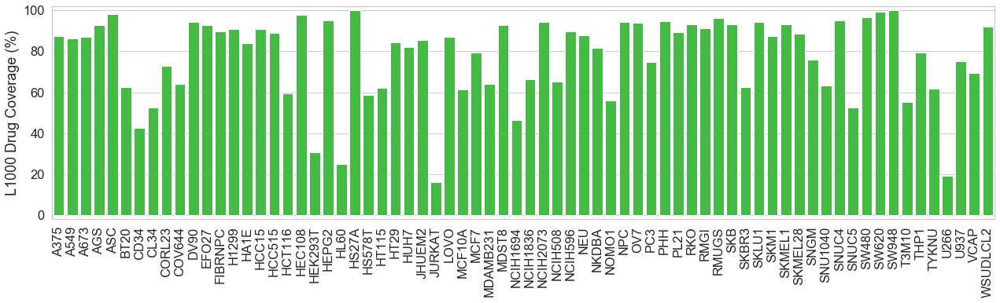

In [8]:
fig = plt.figure()
fig.set_size_inches(18, 6)
sns.set(font_scale=1.5)
with sns.axes_style('whitegrid'):
    sns.barplot(x=drug_coverage_df.index, y='% (QUIZC)', data=drug_coverage_df, color='limegreen')
    plt.xticks(rotation=90)
    plt.ylim(-2, 102)
    plt.tight_layout()
    plt.ylabel('L1000 Drug Coverage (%)')
    plt.xlabel('')
    plt.savefig(proj_output_path + 'Drug_coverage_QUIZC.pdf', format='pdf')
    plt.show()

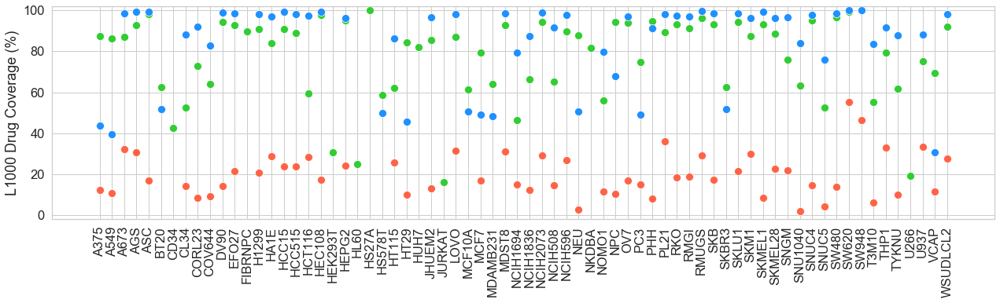

In [9]:
fig = plt.figure()
fig.set_size_inches(18, 6)
sns.set(font_scale=1.5)
with sns.axes_style('whitegrid'):
    sns.scatterplot(x=drug_coverage_df.index, y='% (QUIZC)', data=drug_coverage_df, color='limegreen', s=100)
    sns.scatterplot(x=drug_coverage_df.index, y='% (MODZ)', data=drug_coverage_df, color='tomato', s=100)
    sns.scatterplot(x=drug_coverage_df.index, y='% (CD)', data=drug_coverage_df,  color='dodgerblue', s=100)
    plt.xticks(rotation=90)
    plt.ylim(-2, 102)
    plt.tight_layout()
    plt.ylabel('L1000 Drug Coverage (%)')
    plt.xlabel('')
    plt.savefig(proj_output_path + 'Drug_coverage_all.pdf', format='pdf')
    plt.show()

## In- and out-degree vs number of cell lines (Figs. 2B-C, Supp. Fig. 5)

In [69]:
QUIZC_diG_dict = generate_diG_dict(QUIZC_nodelist_df_dict, QUIZC_edgelist_df_dict, QUIZC_allcells)
MODZ_diG_dict = generate_diG_dict(MODZ_nodelist_df_dict, MODZ_edgelist_df_dict, MODZ_allcells)
CD_diG_dict = generate_diG_dict(CD_nodelist_df_dict, CD_edgelist_df_dict, CD_allcells)

100%|██████████| 61/61 [00:52<00:00,  1.17it/s]


### QUIZ-C

In [70]:
QUIZC_norm_in_degree_df = pd.DataFrame(index=QUIZC_allgenes['Gene_symbol'], columns=QUIZC_allcells['Cell_type'])
QUIZC_norm_out_degree_df = pd.DataFrame(index=QUIZC_alldrugs['Pert_iname'], columns=QUIZC_allcells['Cell_type'])

for c in tqdm(QUIZC_norm_in_degree_df.columns):
    QUIZC_norm_in_degree_df[c] = pd.Series(pd.DataFrame.from_dict(QUIZC_diG_dict[c].in_degree()).set_index(0)[1] / 
                                     len(QUIZC_nodelist_df_dict[c][QUIZC_nodelist_df_dict[c]['Type']=='Drug']['Id'].unique()), 
                                           index=QUIZC_allgenes['Gene_symbol'])
    QUIZC_norm_out_degree_df[c] = pd.Series(pd.DataFrame.from_dict(QUIZC_diG_dict[c].out_degree()).set_index(0)[1] / 
                                      len(QUIZC_nodelist_df_dict[c][QUIZC_nodelist_df_dict[c]['Type']=='Gene']['Id'].unique()), 
                                            index=QUIZC_alldrugs['Pert_iname'])
    
QUIZC_norm_in_degree_cellno_df = pd.DataFrame(index=QUIZC_allgenes['Gene_symbol'])
QUIZC_norm_in_degree_cellno_df['# cell lines gene is in'] = pd.Series(QUIZC_norm_in_degree_df.count(axis=1), 
                                                                      index=QUIZC_allgenes['Gene_symbol'])
QUIZC_norm_in_degree_cellno_df['mean norm. in-degree'] = pd.Series(QUIZC_norm_in_degree_df.mean(axis=1), 
                                                                   index=QUIZC_allgenes['Gene_symbol'])
QUIZC_norm_in_degree_cellno_df['norm. in-degree std.dev.'] = pd.Series(QUIZC_norm_in_degree_df.std(axis=1, ddof=0), 
                                                                       index=QUIZC_allgenes['Gene_symbol'])

QUIZC_norm_out_degree_cellno_df = pd.DataFrame(index=QUIZC_alldrugs['Pert_iname'])
QUIZC_norm_out_degree_cellno_df['# cell lines drug is in'] = pd.Series(QUIZC_norm_out_degree_df.count(axis=1), 
                                                                       index=QUIZC_alldrugs['Pert_iname'])
QUIZC_norm_out_degree_cellno_df['mean norm. out-degree'] = pd.Series(QUIZC_norm_out_degree_df.mean(axis=1), 
                                                                     index=QUIZC_alldrugs['Pert_iname'])
QUIZC_norm_out_degree_cellno_df['norm. out-degree std.dev.'] = pd.Series(QUIZC_norm_out_degree_df.std(axis=1, ddof=0), 
                                                                         index=QUIZC_alldrugs['Pert_iname'])

100%|██████████| 70/70 [00:02<00:00, 32.60it/s]


<Figure size 432x288 with 0 Axes>

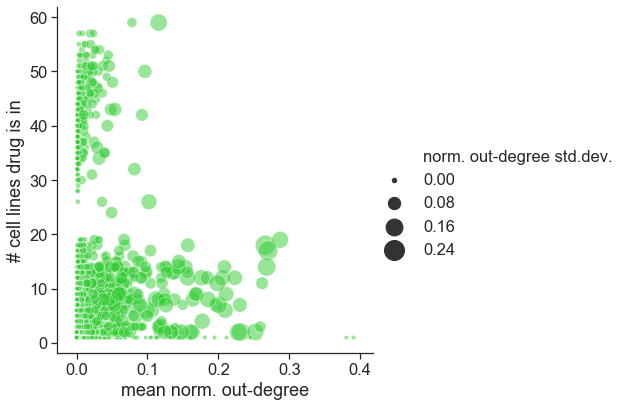

In [12]:
sns.set(font_scale=1.5)
fig = plt.figure()
with sns.axes_style('ticks'):
    ax = sns.relplot(x='mean norm. out-degree', y='# cell lines drug is in', size='norm. out-degree std.dev.', 
                     sizes=(20, 400), alpha=.5, palette="muted",
                height=6, data=QUIZC_norm_out_degree_cellno_df, color='limegreen')
    plt.savefig(proj_output_path + 'QUIZC_norm_out-degree_cellno.pdf', format='pdf')
plt.show()

<Figure size 432x288 with 0 Axes>

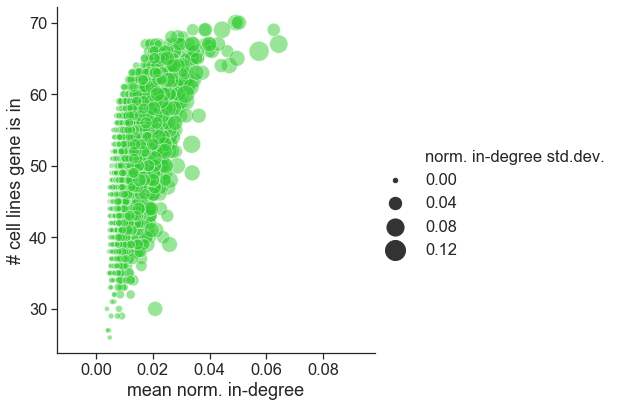

In [13]:
sns.set(font_scale=1.5)
fig = plt.figure()
with sns.axes_style('ticks'):
    sns.relplot(x='mean norm. in-degree', y='# cell lines gene is in', size='norm. in-degree std.dev.', sizes=(20, 400), alpha=.5, palette="muted",
                height=6, data=QUIZC_norm_in_degree_cellno_df, color='limegreen')
    plt.savefig(proj_output_path + 'QUIZC_norm_in-degree_cellno.pdf', format='pdf')
    plt.show()

In [14]:
st.pearsonr(QUIZC_norm_in_degree_cellno_df['mean norm. in-degree'], QUIZC_norm_in_degree_cellno_df['# cell lines gene is in'])

(0.6218718772880161, 0.0)

### MODZ

In [71]:
MODZ_norm_in_degree_df = pd.DataFrame(index=MODZ_allgenes['Gene_symbol'], columns=MODZ_allcells['Cell_type'])
MODZ_norm_out_degree_df = pd.DataFrame(index=MODZ_alldrugs['Pert_iname'], columns=MODZ_allcells['Cell_type'])

for c in tqdm(MODZ_norm_in_degree_df.columns):
    MODZ_norm_in_degree_df[c] = pd.Series(pd.DataFrame.from_dict(MODZ_diG_dict[c].in_degree()).set_index(0)[1] / 
                                     len(MODZ_nodelist_df_dict[c][MODZ_nodelist_df_dict[c]['Type']=='Drug']['Id'].unique()), 
                                           index=MODZ_allgenes['Gene_symbol'])
    MODZ_norm_out_degree_df[c] = pd.Series(pd.DataFrame.from_dict(MODZ_diG_dict[c].out_degree()).set_index(0)[1] / 
                                      len(MODZ_nodelist_df_dict[c][MODZ_nodelist_df_dict[c]['Type']=='Gene']['Id'].unique()), 
                                            index=MODZ_alldrugs['Pert_iname'])
    
MODZ_norm_in_degree_cellno_df = pd.DataFrame(index=MODZ_allgenes['Gene_symbol'])
MODZ_norm_in_degree_cellno_df['# cell lines gene is in'] = pd.Series(MODZ_norm_in_degree_df.count(axis=1), 
                                                                      index=MODZ_allgenes['Gene_symbol'])
MODZ_norm_in_degree_cellno_df['mean norm. in-degree'] = pd.Series(MODZ_norm_in_degree_df.mean(axis=1), 
                                                                   index=MODZ_allgenes['Gene_symbol'])
MODZ_norm_in_degree_cellno_df['norm. in-degree std.dev.'] = pd.Series(MODZ_norm_in_degree_df.std(axis=1, ddof=0), 
                                                                       index=MODZ_allgenes['Gene_symbol'])

MODZ_norm_out_degree_cellno_df = pd.DataFrame(index=MODZ_alldrugs['Pert_iname'])
MODZ_norm_out_degree_cellno_df['# cell lines drug is in'] = pd.Series(MODZ_norm_out_degree_df.count(axis=1), 
                                                                       index=MODZ_alldrugs['Pert_iname'])
MODZ_norm_out_degree_cellno_df['mean norm. out-degree'] = pd.Series(MODZ_norm_out_degree_df.mean(axis=1), 
                                                                     index=MODZ_alldrugs['Pert_iname'])
MODZ_norm_out_degree_cellno_df['norm. out-degree std.dev.'] = pd.Series(MODZ_norm_out_degree_df.std(axis=1, ddof=0), 
                                                                         index=MODZ_alldrugs['Pert_iname'])

100%|██████████| 61/61 [00:00<00:00, 66.30it/s]


<Figure size 432x288 with 0 Axes>

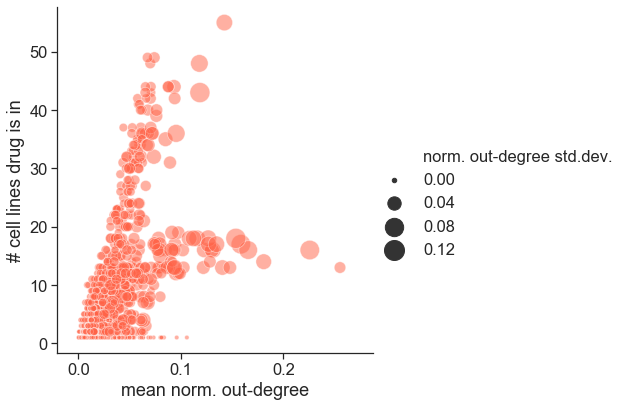

In [16]:
sns.set(font_scale=1.5)
fig = plt.figure()
with sns.axes_style('ticks'):
    ax = sns.relplot(x='mean norm. out-degree', y='# cell lines drug is in', size='norm. out-degree std.dev.', 
                     sizes=(20, 400), alpha=.5, palette="muted",
                height=6, data=MODZ_norm_out_degree_cellno_df, color='tomato')
    plt.savefig(proj_output_path + 'MODZ_norm_out-degree_cellno.pdf', format='pdf')
plt.show()

<Figure size 432x288 with 0 Axes>

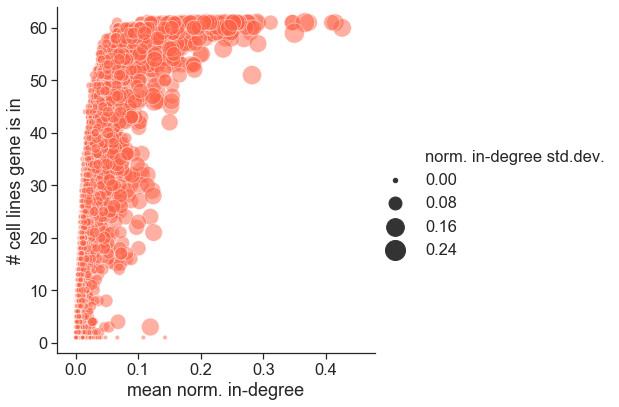

In [17]:
sns.set(font_scale=1.5)
fig = plt.figure()
with sns.axes_style('ticks'):
    sns.relplot(x='mean norm. in-degree', y='# cell lines gene is in', size='norm. in-degree std.dev.', sizes=(20, 400), alpha=.5, palette="muted",
                height=6, data=MODZ_norm_in_degree_cellno_df, color='tomato')
    plt.savefig(proj_output_path + 'MODZ_norm_in-degree_cellno.pdf', format='pdf')
    plt.show()

### CD

In [72]:
CD_norm_in_degree_df = pd.DataFrame(index=CD_allgenes['Gene_symbol'], columns=CD_allcells['Cell_type'])
CD_norm_out_degree_df = pd.DataFrame(index=CD_alldrugs['Pert_iname'], columns=CD_allcells['Cell_type'])

for c in tqdm(CD_norm_in_degree_df.columns):
    CD_norm_in_degree_df[c] = pd.Series(pd.DataFrame.from_dict(CD_diG_dict[c].in_degree()).set_index(0)[1] / 
                                     len(CD_nodelist_df_dict[c][CD_nodelist_df_dict[c]['Type']=='Drug']['Id'].unique()), 
                                           index=CD_allgenes['Gene_symbol'])
    CD_norm_out_degree_df[c] = pd.Series(pd.DataFrame.from_dict(CD_diG_dict[c].out_degree()).set_index(0)[1] / 
                                      len(CD_nodelist_df_dict[c][CD_nodelist_df_dict[c]['Type']=='Gene']['Id'].unique()), 
                                            index=CD_alldrugs['Pert_iname'])
    
CD_norm_in_degree_cellno_df = pd.DataFrame(index=CD_allgenes['Gene_symbol'])
CD_norm_in_degree_cellno_df['# cell lines gene is in'] = pd.Series(CD_norm_in_degree_df.count(axis=1), 
                                                                      index=CD_allgenes['Gene_symbol'])
CD_norm_in_degree_cellno_df['mean norm. in-degree'] = pd.Series(CD_norm_in_degree_df.mean(axis=1), 
                                                                   index=CD_allgenes['Gene_symbol'])
CD_norm_in_degree_cellno_df['norm. in-degree std.dev.'] = pd.Series(CD_norm_in_degree_df.std(axis=1, ddof=0), 
                                                                       index=CD_allgenes['Gene_symbol'])

CD_norm_out_degree_cellno_df = pd.DataFrame(index=CD_alldrugs['Pert_iname'])
CD_norm_out_degree_cellno_df['# cell lines drug is in'] = pd.Series(CD_norm_out_degree_df.count(axis=1), 
                                                                       index=CD_alldrugs['Pert_iname'])
CD_norm_out_degree_cellno_df['mean norm. out-degree'] = pd.Series(CD_norm_out_degree_df.mean(axis=1), 
                                                                     index=CD_alldrugs['Pert_iname'])
CD_norm_out_degree_cellno_df['norm. out-degree std.dev.'] = pd.Series(CD_norm_out_degree_df.std(axis=1, ddof=0), 
                                                                         index=CD_alldrugs['Pert_iname'])

100%|██████████| 61/61 [00:01<00:00, 56.52it/s]


<Figure size 432x288 with 0 Axes>

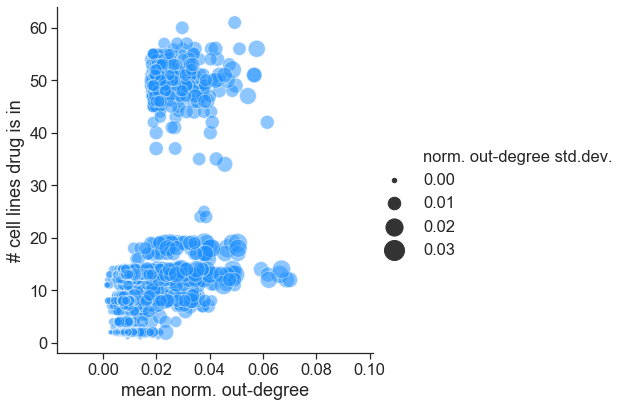

In [19]:
sns.set(font_scale=1.5)
fig = plt.figure()
with sns.axes_style('ticks'):
    ax = sns.relplot(x='mean norm. out-degree', y='# cell lines drug is in', size='norm. out-degree std.dev.', 
                     sizes=(20, 400), alpha=.5, palette="muted",
                height=6, data=CD_norm_out_degree_cellno_df, color='dodgerblue')
    plt.savefig(proj_output_path + 'CD_norm_out-degree_cellno.pdf', format='pdf')
plt.show()

<Figure size 432x288 with 0 Axes>

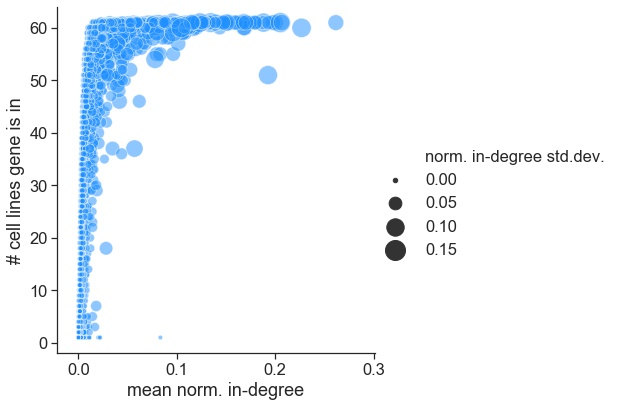

In [20]:
sns.set(font_scale=1.5)
fig = plt.figure()
with sns.axes_style('ticks'):
    sns.relplot(x='mean norm. in-degree', y='# cell lines gene is in', size='norm. in-degree std.dev.', sizes=(20, 400), alpha=.5, palette="muted",
                height=6, data=CD_norm_in_degree_cellno_df, color='dodgerblue')
    plt.savefig(proj_output_path + 'CD_norm_in-degree_cellno.pdf', format='pdf')
    plt.show()

## Comparison of landmark vs predicted genes in QUIZC/MODZ/CD networks (Supp. Figs. 6A-C)

In [110]:
L1000_landmark = pd.read_csv(proj_external_data_path + '/L1000/GSE92742_Broad_LINCS_gene_info_delta_landmark.txt', sep='\t')

/Users/ardahalu/anaconda3/envs/py3_main/lib/python3.8/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


<Figure size 1728x432 with 0 Axes>

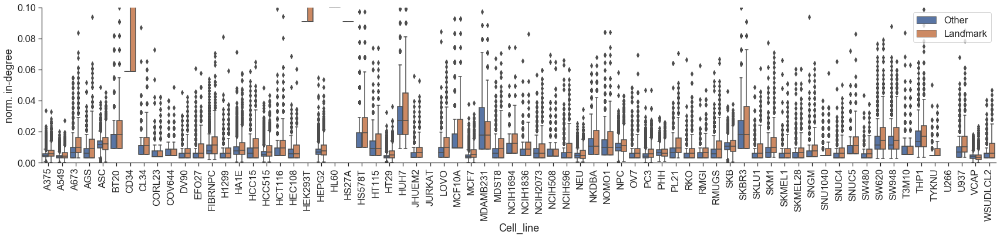

In [111]:
in_degree_landmark_df = pd.DataFrame(columns=QUIZC_allcells['Cell_type'], index=QUIZC_allgenes['Gene_symbol'])

for c in QUIZC_allcells['Cell_type']:
    temp_in_degree_df = pd.DataFrame.from_dict(QUIZC_diG_dict[c].in_degree()).set_index(0).sort_values(0) /\
                        len(QUIZC_nodelist_df_dict[c][QUIZC_nodelist_df_dict[c]['Type']=='Drug']['Id'].unique())
    temp_in_degree_df = temp_in_degree_df[temp_in_degree_df[1] > 0]

    in_degree_landmark_df.loc[in_degree_landmark_df.index.isin(temp_in_degree_df.index), c] = temp_in_degree_df[1].values
    
in_degree_landmark_df['in_landmark'] = 'Landmark'
in_degree_landmark_df.loc[~in_degree_landmark_df.index.isin(L1000_landmark['pr_gene_symbol']), 'in_landmark'] = 'Other'

in_degree_landmark_df_long = pd.melt(in_degree_landmark_df, id_vars="in_landmark", var_name="Cell_line", value_name="in-degree")
in_degree_landmark_df_long = in_degree_landmark_df_long[~pd.isnull(in_degree_landmark_df_long['in-degree'])]
in_degree_landmark_df_long = in_degree_landmark_df_long.astype({'in-degree': 'float64'})

QUIZC_in_degree_landmark_MWU = pd.DataFrame(index=QUIZC_allcells['Cell_type'], columns=['Delta', 'p-value'])
for c in QUIZC_allcells['Cell_type']:
    QUIZC_in_degree_landmark_MWU.at[c, 'Delta'] = (in_degree_landmark_df_long[(in_degree_landmark_df_long['Cell_line']==c) & 
                                                                      (in_degree_landmark_df_long['in_landmark']=='Landmark')]['in-degree'].mean() -
                                           in_degree_landmark_df_long[(in_degree_landmark_df_long['Cell_line']==c) & 
                                                                      (in_degree_landmark_df_long['in_landmark']=='Other')]['in-degree'].mean())
    QUIZC_in_degree_landmark_MWU.at[c, 'p-value'] = (st.mannwhitneyu(in_degree_landmark_df_long[(in_degree_landmark_df_long['Cell_line']==c) & 
                                                                                          (in_degree_landmark_df_long['in_landmark']=='Landmark')]['in-degree'],
                                                               in_degree_landmark_df_long[(in_degree_landmark_df_long['Cell_line']==c) & 
                                                                                          (in_degree_landmark_df_long['in_landmark']=='Other')]['in-degree'])[1])

fig = plt.figure()
fig.set_size_inches(24, 6)
sns.set(font_scale=1.5)
with sns.axes_style("ticks"):
    sns.factorplot(data=in_degree_landmark_df_long, hue='in_landmark', x='Cell_line', y='in-degree', kind='box', 
                   height=6, aspect=4, legend=False)
    plt.xticks(rotation=90)
    plt.ylabel('norm. in-degree')
    plt.ylim(0, 0.1)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.savefig(proj_output_path + 'QUIZC_norm_in-degree_landmark_vs_other.pdf', format='pdf')
    plt.show()

/Users/ardahalu/anaconda3/envs/py3_main/lib/python3.8/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


<Figure size 1728x432 with 0 Axes>

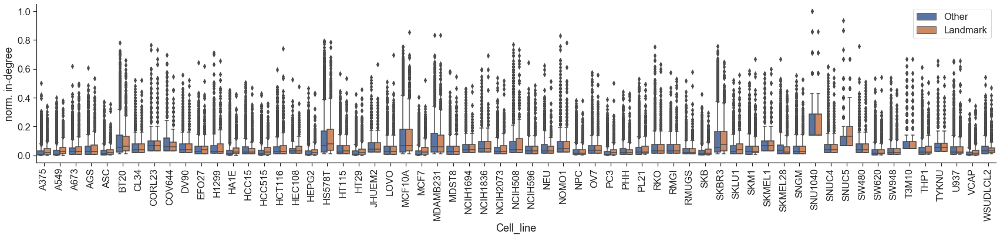

In [112]:
in_degree_landmark_df = pd.DataFrame(columns=MODZ_allcells['Cell_type'], index=MODZ_allgenes['Gene_symbol'])

for c in MODZ_allcells['Cell_type']:
    temp_in_degree_df = pd.DataFrame.from_dict(MODZ_diG_dict[c].in_degree()).set_index(0).sort_values(0) /\
                        len(MODZ_nodelist_df_dict[c][MODZ_nodelist_df_dict[c]['Type']=='Drug']['Id'].unique())
    temp_in_degree_df = temp_in_degree_df[temp_in_degree_df[1] > 0]
    temp_in_degree_df = temp_in_degree_df[temp_in_degree_df.index != '1060P11.3']

    in_degree_landmark_df.loc[in_degree_landmark_df.index.isin(temp_in_degree_df.index), c] = temp_in_degree_df[1].values
    
in_degree_landmark_df['in_landmark'] = 'Landmark'
in_degree_landmark_df.loc[~in_degree_landmark_df.index.isin(L1000_landmark['pr_gene_symbol']), 'in_landmark'] = 'Other'

in_degree_landmark_df_long = pd.melt(in_degree_landmark_df, id_vars="in_landmark", var_name="Cell_line", value_name="in-degree")
in_degree_landmark_df_long = in_degree_landmark_df_long[~pd.isnull(in_degree_landmark_df_long['in-degree'])]
in_degree_landmark_df_long = in_degree_landmark_df_long.astype({'in-degree': 'float64'})

MODZ_in_degree_landmark_MWU = pd.DataFrame(index=MODZ_allcells['Cell_type'], columns=['Delta', 'p-value'])
for c in MODZ_allcells['Cell_type']:
    MODZ_in_degree_landmark_MWU.at[c, 'Delta'] = (in_degree_landmark_df_long[(in_degree_landmark_df_long['Cell_line']==c) & 
                                                                      (in_degree_landmark_df_long['in_landmark']=='Landmark')]['in-degree'].mean() -
                                           in_degree_landmark_df_long[(in_degree_landmark_df_long['Cell_line']==c) & 
                                                                      (in_degree_landmark_df_long['in_landmark']=='Other')]['in-degree'].mean())
    MODZ_in_degree_landmark_MWU.at[c, 'p-value'] = (st.mannwhitneyu(in_degree_landmark_df_long[(in_degree_landmark_df_long['Cell_line']==c) & 
                                                                                          (in_degree_landmark_df_long['in_landmark']=='Landmark')]['in-degree'],
                                                               in_degree_landmark_df_long[(in_degree_landmark_df_long['Cell_line']==c) & 
                                                                                          (in_degree_landmark_df_long['in_landmark']=='Other')]['in-degree'])[1])

fig = plt.figure()
fig.set_size_inches(24, 6)
sns.set(font_scale=1.5)
with sns.axes_style("ticks"):
    sns.factorplot(data=in_degree_landmark_df_long, hue='in_landmark', x='Cell_line', y='in-degree', kind='box', 
                   height=6, aspect=4, legend=False)
    plt.xticks(rotation=90)
    plt.ylabel('norm. in-degree')
    #plt.ylim(0, 0.1)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.savefig(proj_output_path + 'MODZ_norm_in-degree_landmark_vs_other.pdf', format='pdf')
    plt.show()

/Users/ardahalu/anaconda3/envs/py3_main/lib/python3.8/site-packages/seaborn/categorical.py:3669: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


<Figure size 1728x432 with 0 Axes>

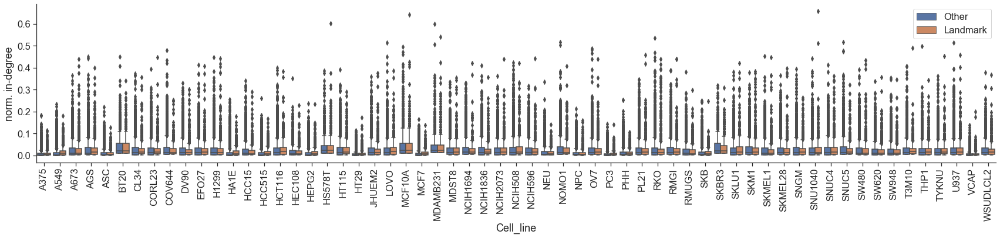

In [113]:
in_degree_landmark_df = pd.DataFrame(columns=CD_allcells['Cell_type'], index=CD_allgenes['Gene_symbol'])

for c in CD_allcells['Cell_type']:
    temp_in_degree_df = pd.DataFrame.from_dict(CD_diG_dict[c].in_degree()).set_index(0).sort_values(0) /\
                        len(CD_nodelist_df_dict[c][CD_nodelist_df_dict[c]['Type']=='Drug']['Id'].unique())
    temp_in_degree_df = temp_in_degree_df[temp_in_degree_df[1] > 0]
    temp_in_degree_df = temp_in_degree_df[temp_in_degree_df.index != '-666']

    in_degree_landmark_df.loc[in_degree_landmark_df.index.isin(temp_in_degree_df.index), c] = temp_in_degree_df[1].values
    
in_degree_landmark_df['in_landmark'] = 'Landmark'
in_degree_landmark_df.loc[~in_degree_landmark_df.index.isin(L1000_landmark['pr_gene_symbol']), 'in_landmark'] = 'Other'

in_degree_landmark_df_long = pd.melt(in_degree_landmark_df, id_vars="in_landmark", var_name="Cell_line", value_name="in-degree")
in_degree_landmark_df_long = in_degree_landmark_df_long[~pd.isnull(in_degree_landmark_df_long['in-degree'])]
in_degree_landmark_df_long = in_degree_landmark_df_long.astype({'in-degree': 'float64'})

CD_in_degree_landmark_MWU = pd.DataFrame(index=CD_allcells['Cell_type'], columns=['Delta', 'p-value'])
for c in CD_allcells['Cell_type']:
    CD_in_degree_landmark_MWU.at[c, 'Delta'] = (in_degree_landmark_df_long[(in_degree_landmark_df_long['Cell_line']==c) & 
                                                                      (in_degree_landmark_df_long['in_landmark']=='Landmark')]['in-degree'].mean() -
                                           in_degree_landmark_df_long[(in_degree_landmark_df_long['Cell_line']==c) & 
                                                                      (in_degree_landmark_df_long['in_landmark']=='Other')]['in-degree'].mean())
    CD_in_degree_landmark_MWU.at[c, 'p-value'] = (st.mannwhitneyu(in_degree_landmark_df_long[(in_degree_landmark_df_long['Cell_line']==c) & 
                                                                                          (in_degree_landmark_df_long['in_landmark']=='Landmark')]['in-degree'],
                                                               in_degree_landmark_df_long[(in_degree_landmark_df_long['Cell_line']==c) & 
                                                                                          (in_degree_landmark_df_long['in_landmark']=='Other')]['in-degree'])[1])

fig = plt.figure()
fig.set_size_inches(24, 6)
sns.set(font_scale=1.5)
with sns.axes_style("ticks"):
    sns.factorplot(data=in_degree_landmark_df_long, hue='in_landmark', x='Cell_line', y='in-degree', kind='box', 
                   height=6, aspect=4, legend=False)
    plt.xticks(rotation=90)
    plt.ylabel('norm. in-degree')
    #plt.ylim(0, 0.1)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.savefig(proj_output_path + 'CD_norm_in-degree_landmark_vs_other.pdf', format='pdf')
    plt.show()

In [115]:
print(len(QUIZC_in_degree_landmark_MWU[(QUIZC_in_degree_landmark_MWU['Delta'] > 0)]) / len(QUIZC_in_degree_landmark_MWU),
      len(MODZ_in_degree_landmark_MWU[(MODZ_in_degree_landmark_MWU['Delta'] > 0)]) / len(MODZ_in_degree_landmark_MWU),
      len(CD_in_degree_landmark_MWU[(CD_in_degree_landmark_MWU['Delta'] > 0)]) / len(CD_in_degree_landmark_MWU))

0.9428571428571428 0.9180327868852459 0.5573770491803278


## Enrichment of landmark genes in QUIZ-C networks (Supp. Table 5)

In [118]:
landmark_fisher_pval = pd.DataFrame(index=sorted(list(QUIZC_nodelist_df_dict.keys())), columns=['p-value', 'OR'])
for c in sorted(list(QUIZC_nodelist_df_dict.keys())):
    A = len(set(QUIZC_nodelist_df_dict[c][QUIZC_nodelist_df_dict[c]['Type']=='Gene']['Id']) & set(L1000_landmark['pr_gene_symbol']))
    B = len(set(QUIZC_nodelist_df_dict[c][QUIZC_nodelist_df_dict[c]['Type']=='Gene']['Id']) - set(L1000_landmark['pr_gene_symbol']))
    C = len(set(L1000_landmark['pr_gene_symbol']) - set(QUIZC_nodelist_df_dict[c][QUIZC_nodelist_df_dict[c]['Type']=='Gene']['Id']))
    D = len(set(QUIZC_allgenes['Gene_symbol']) - 
            (set(QUIZC_nodelist_df_dict[c][QUIZC_nodelist_df_dict[c]['Type']=='Gene']['Id']) | set(L1000_landmark['pr_gene_symbol'])))
    landmark_fisher_pval.at[c, 'p-value'] = st.fisher_exact([[A, B], [C, D]])[1]
    landmark_fisher_pval.at[c, 'OR'] = st.fisher_exact([[A, B], [C, D]])[0]                       
    
landmark_fisher_pval.to_csv(proj_output_path + 'landmark_vs_other_enrichment_QUIZC.csv')

In [119]:
print(len(landmark_fisher_pval[(landmark_fisher_pval['p-value']<0.05) & (landmark_fisher_pval['OR']>1)]),
      len(landmark_fisher_pval[(landmark_fisher_pval['p-value']<0.05) & (landmark_fisher_pval['OR']<1)]),
      len(landmark_fisher_pval[(landmark_fisher_pval['p-value']>=0.05)]))

13 26 31


## Topological drug specificity within each QUIZC/MODZ/CD network (Figure 4C)

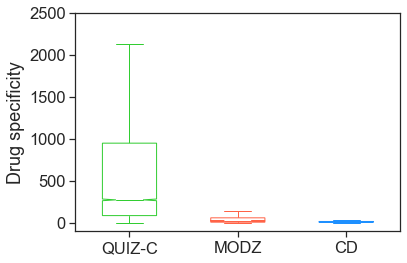

In [73]:
sns.set(font_scale=1.5)
fig = plt.figure()
with sns.axes_style('ticks'):
    box1 = plt.boxplot(1.0/(QUIZC_norm_out_degree_cellno_df['# cell lines drug is in'] * QUIZC_norm_out_degree_cellno_df['mean norm. out-degree']), widths=0.5,
                       positions=[1], notch=True, patch_artist=True, showfliers=False)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box1[item], color='limegreen')
    plt.setp(box1["boxes"], facecolor='white')
    plt.setp(box1["fliers"], markeredgecolor='limegreen')

    box2 = plt.boxplot(1.0/(MODZ_norm_out_degree_cellno_df['# cell lines drug is in'] * MODZ_norm_out_degree_cellno_df['mean norm. out-degree']), widths=0.5,
                       positions=[2], notch=True, patch_artist=True, showfliers=False)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box2[item], color='tomato')
    plt.setp(box2["boxes"], facecolor='white')
    plt.setp(box2["fliers"], markeredgecolor='tomato')
    
    box3 = plt.boxplot(1.0/(CD_norm_out_degree_cellno_df['# cell lines drug is in'] * CD_norm_out_degree_cellno_df['mean norm. out-degree']), widths=0.5,
                       positions=[3], notch=True, patch_artist=True, showfliers=False)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box3[item], color='dodgerblue')
    plt.setp(box3["boxes"], facecolor='white')
    plt.setp(box3["fliers"], markeredgecolor='dodgerblue')
   
    plt.xticks([1, 2, 3], ['QUIZ-C', 'MODZ', 'CD'])
    plt.ylim(-100, 2500)
    plt.ylabel('Drug specificity')
    plt.tight_layout()
    plt.savefig(proj_output_path + 'Drug_specificity_boxplots_nofliers.pdf', format='pdf')
    plt.show()

In [74]:
st.mannwhitneyu(1.0/(MODZ_norm_out_degree_cellno_df['# cell lines drug is in'] * MODZ_norm_out_degree_cellno_df['mean norm. out-degree']),
                1.0/(QUIZC_norm_out_degree_cellno_df['# cell lines drug is in'] * QUIZC_norm_out_degree_cellno_df['mean norm. out-degree']))

MannwhitneyuResult(statistic=9091836.0, pvalue=0.0)

In [75]:
st.mannwhitneyu(1.0/(CD_norm_out_degree_cellno_df['# cell lines drug is in'] * CD_norm_out_degree_cellno_df['mean norm. out-degree']),
                1.0/(QUIZC_norm_out_degree_cellno_df['# cell lines drug is in'] * QUIZC_norm_out_degree_cellno_df['mean norm. out-degree']))

MannwhitneyuResult(statistic=5959478.0, pvalue=0.0)

In [76]:
st.mannwhitneyu(1.0/(MODZ_norm_out_degree_cellno_df['# cell lines drug is in'] * MODZ_norm_out_degree_cellno_df['mean norm. out-degree']),
                1.0/(CD_norm_out_degree_cellno_df['# cell lines drug is in'] * CD_norm_out_degree_cellno_df['mean norm. out-degree']))

MannwhitneyuResult(statistic=6160194.0, pvalue=9.91823699860648e-175)

## Edge overlap between cell lines in QUIZC/MODZ/CD networks (Supp. Fig. 7A-D)

In [5]:
QUIZC_edge_overlap_df = pd.DataFrame(index=QUIZC_allcells['Cell_type'], columns=QUIZC_allcells['Cell_type'])
QUIZC_edge_concordance_df = pd.DataFrame(index=QUIZC_allcells['Cell_type'], columns=QUIZC_allcells['Cell_type'])
for c1 in tqdm(QUIZC_allcells['Cell_type']):
    for c2 in QUIZC_allcells['Cell_type']:
        inner = pd.merge(QUIZC_edgelist_df_dict[c1], QUIZC_edgelist_df_dict[c2], left_on=['Drug', 'Target'], right_on=['Drug', 'Target'], how='inner')
        outer = pd.merge(QUIZC_edgelist_df_dict[c1], QUIZC_edgelist_df_dict[c2], left_on=['Drug', 'Target'], right_on=['Drug', 'Target'], how='outer')
        inner_conc = pd.merge(QUIZC_edgelist_df_dict[c1], QUIZC_edgelist_df_dict[c2], left_on=['Drug', 'Target', 'Direction'], 
                              right_on=['Drug', 'Target', 'Direction'], how='inner')
        QUIZC_edge_overlap_df.at[c1, c2] = 1.0 * len(inner) / len(outer)   
        if len(inner) > 0:
            QUIZC_edge_concordance_df.at[c1, c2] = 100.0 * len(inner_conc) / len(inner)   

100%|██████████| 70/70 [11:50<00:00, 10.16s/it]


In [6]:
MODZ_edge_overlap_df = pd.DataFrame(index=MODZ_allcells['Cell_type'], columns=MODZ_allcells['Cell_type'])
MODZ_edge_concordance_df = pd.DataFrame(index=MODZ_allcells['Cell_type'], columns=MODZ_allcells['Cell_type'])
for c1 in tqdm(MODZ_allcells['Cell_type']):
    for c2 in MODZ_allcells['Cell_type']:
        inner = pd.merge(MODZ_edgelist_df_dict[c1], MODZ_edgelist_df_dict[c2], left_on=['Drug', 'Target'], right_on=['Drug', 'Target'], how='inner')
        outer = pd.merge(MODZ_edgelist_df_dict[c1], MODZ_edgelist_df_dict[c2], left_on=['Drug', 'Target'], right_on=['Drug', 'Target'], how='outer')
        inner_conc = pd.merge(MODZ_edgelist_df_dict[c1], MODZ_edgelist_df_dict[c2], left_on=['Drug', 'Target', 'Direction'], 
                              right_on=['Drug', 'Target', 'Direction'], how='inner')
        MODZ_edge_overlap_df.at[c1, c2] = 1.0 * len(inner) / len(outer) 
        if len(inner) > 0:
            MODZ_edge_concordance_df.at[c1, c2] = 100.0 * len(inner_conc) / len(inner)  

100%|██████████| 61/61 [04:55<00:00,  4.85s/it]


In [7]:
CD_edge_overlap_df = pd.DataFrame(index=CD_allcells['Cell_type'], columns=CD_allcells['Cell_type'])
CD_edge_concordance_df = pd.DataFrame(index=CD_allcells['Cell_type'], columns=CD_allcells['Cell_type'])
for c1 in tqdm(CD_allcells['Cell_type']):
    for c2 in CD_allcells['Cell_type']:
        inner = pd.merge(CD_edgelist_df_dict[c1], CD_edgelist_df_dict[c2], left_on=['Drug', 'Target'], right_on=['Drug', 'Target'], how='inner')
        outer = pd.merge(CD_edgelist_df_dict[c1], CD_edgelist_df_dict[c2], left_on=['Drug', 'Target'], right_on=['Drug', 'Target'], how='outer')
        inner_conc = pd.merge(CD_edgelist_df_dict[c1], CD_edgelist_df_dict[c2], left_on=['Drug', 'Target', 'Direction'], 
                              right_on=['Drug', 'Target', 'Direction'], how='inner')
        CD_edge_overlap_df.at[c1, c2] = 1.0 * len(inner) / len(outer) 
        if len(inner) > 0:
            CD_edge_concordance_df.at[c1, c2] = 100.0 * len(inner_conc) / len(inner)  

100%|██████████| 61/61 [07:06<00:00,  6.99s/it]


In [8]:
QUIZC_overlap_mat = QUIZC_edge_overlap_df.astype(float).values
row_linkage = hierarchy.linkage(distance.pdist(QUIZC_overlap_mat), method='ward')
Z = hierarchy.dendrogram(row_linkage, orientation='left', no_plot=True)
idx = Z['leaves']
QUIZC_overlap_mat = QUIZC_overlap_mat[idx, :]
QUIZC_overlap_mat = QUIZC_overlap_mat[:, idx]

MODZ_overlap_mat = MODZ_edge_overlap_df.astype(float).values
row_linkage = hierarchy.linkage(distance.pdist(MODZ_overlap_mat), method='ward')
Z = hierarchy.dendrogram(row_linkage, orientation='left', no_plot=True)
idx = Z['leaves']
MODZ_overlap_mat = MODZ_overlap_mat[idx, :]
MODZ_overlap_mat = MODZ_overlap_mat[:, idx]

CD_overlap_mat = CD_edge_overlap_df.astype(float).values
row_linkage = hierarchy.linkage(distance.pdist(CD_overlap_mat), method='ward')
Z = hierarchy.dendrogram(row_linkage, orientation='left', no_plot=True)
idx = Z['leaves']
CD_overlap_mat = CD_overlap_mat[idx, :]
CD_overlap_mat = CD_overlap_mat[:, idx]

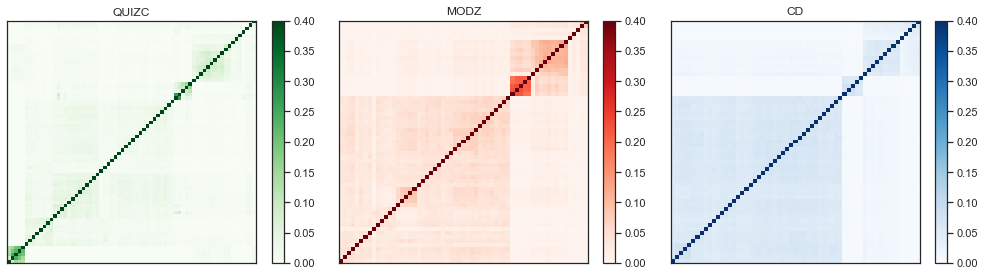

In [9]:
plt.figure(figsize=(14, 4))
sns.set(font_scale=1.0)
with sns.axes_style("white"):

    plt.subplot(1, 3, 1)
    plt.imshow(QUIZC_overlap_mat, aspect='auto', origin='lower', cmap='Greens', vmin=0.0, vmax=0.4)
    plt.gca().axes.get_xaxis().set_visible(False)
    plt.gca().axes.get_yaxis().set_visible(False)
    plt.title('QUIZC')
    plt.colorbar()
    plt.subplot(1, 3, 2)
    plt.imshow(MODZ_overlap_mat, aspect='auto', origin='lower', cmap='Reds', vmin=0.0, vmax=0.4)
    plt.gca().axes.get_xaxis().set_visible(False)
    plt.gca().axes.get_yaxis().set_visible(False)
    plt.title('MODZ')
    plt.colorbar()
    plt.subplot(1, 3, 3)
    plt.imshow(CD_overlap_mat, aspect='auto', origin='lower', cmap='Blues', vmin=0.0, vmax=0.4)
    plt.gca().axes.get_xaxis().set_visible(False)
    plt.gca().axes.get_yaxis().set_visible(False)
    plt.title('CD')
    plt.colorbar()
    
    plt.tight_layout()
    plt.savefig(proj_output_path + 'edge_overlap_all_heatmap.pdf', format='pdf')
    plt.show()

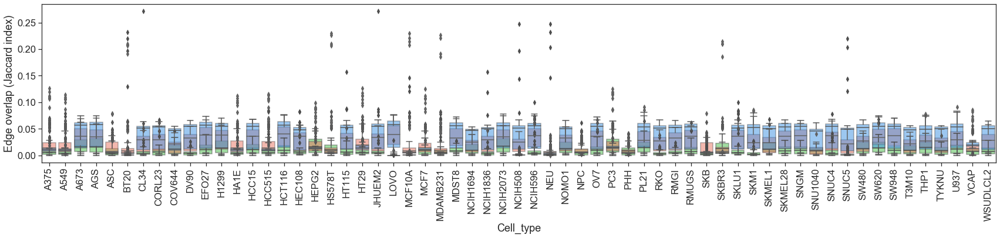

In [10]:
fig = plt.figure()
fig.set_size_inches(24, 6)
sns.set(font_scale=1.5)
with sns.axes_style("ticks"):
    sns.boxplot(QUIZC_allcells['Cell_type'], 
                [list(QUIZC_edge_overlap_df.loc[c][set(QUIZC_allcells['Cell_type']) - set([c])].values.astype(float)) for c in QUIZC_allcells['Cell_type']],
               color='limegreen', boxprops=dict(alpha=.5))
    sns.boxplot(MODZ_allcells['Cell_type'], 
                [list(MODZ_edge_overlap_df.loc[c][set(MODZ_allcells['Cell_type']) - set([c])].values.astype(float)) for c in MODZ_allcells['Cell_type']],
               color='tomato', boxprops=dict(alpha=.5))
    sns.boxplot(CD_allcells['Cell_type'], 
                [list(CD_edge_overlap_df.loc[c][set(CD_allcells['Cell_type']) - set([c])].values.astype(float)) for c in CD_allcells['Cell_type']],
               color='dodgerblue', boxprops=dict(alpha=.5))
    plt.xticks(rotation=90)
    plt.ylabel('Edge overlap (Jaccard index)')
    plt.tight_layout()
    plt.savefig(proj_output_path + 'edge_overlap_all_boxplot.pdf', format='pdf')
    plt.show()

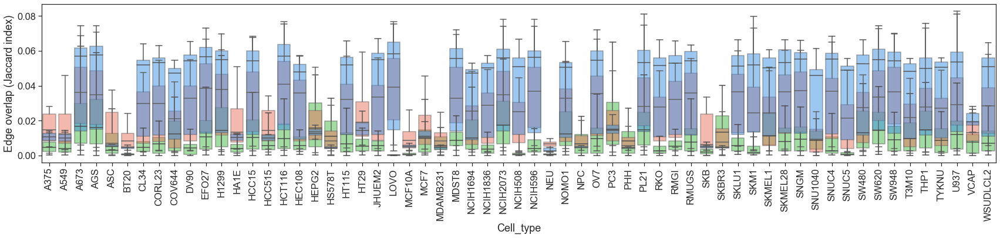

In [11]:
fig = plt.figure()
fig.set_size_inches(24, 6)
sns.set(font_scale=1.5)
with sns.axes_style("ticks"):
    sns.boxplot(QUIZC_allcells['Cell_type'], 
                [list(QUIZC_edge_overlap_df.loc[c][set(QUIZC_allcells['Cell_type']) - set([c])].values.astype(float)) for c in QUIZC_allcells['Cell_type']],
               color='limegreen', showfliers=False, boxprops=dict(alpha=.5))
    sns.boxplot(MODZ_allcells['Cell_type'], 
                [list(MODZ_edge_overlap_df.loc[c][set(MODZ_allcells['Cell_type']) - set([c])].values.astype(float)) for c in MODZ_allcells['Cell_type']],
               color='tomato', showfliers=False, boxprops=dict(alpha=.5))
    sns.boxplot(CD_allcells['Cell_type'], 
                [list(CD_edge_overlap_df.loc[c][set(CD_allcells['Cell_type']) - set([c])].values.astype(float)) for c in CD_allcells['Cell_type']],
               color='dodgerblue', showfliers=False, boxprops=dict(alpha=.5))
    plt.xticks(rotation=90)
    plt.ylabel('Edge overlap (Jaccard index)')
    plt.tight_layout()
    plt.savefig(proj_output_path + 'edge_overlap_all_boxplot_nofliers.pdf', format='pdf')
    plt.show()

## Network densities for QUIZ-C/MODZ/CD (Supp. Fig. 7E)

In [12]:
f = open(proj_output_path + 'QUIZC_network_stats.csv', 'w')
f.write('Cell_type,N_drugs,N_targets,M,Density\n')
for c in sorted(list(QUIZC_nodelist_df_dict.keys())):
    f.write('%s,%s,%s,%s,%s\n' % (c, 
                                  len(set(QUIZC_nodelist_df_dict[c][QUIZC_nodelist_df_dict[c]['Type']=='Drug']['Id'])),
                                  len(set(QUIZC_nodelist_df_dict[c][QUIZC_nodelist_df_dict[c]['Type']=='Gene']['Id'])), 
                                  len(QUIZC_edgelist_df_dict[c]), 
                                  len(QUIZC_edgelist_df_dict[c])/(len(set(QUIZC_nodelist_df_dict[c][QUIZC_nodelist_df_dict[c]['Type']=='Drug']['Id']))*
                                                            len(set(QUIZC_nodelist_df_dict[c][QUIZC_nodelist_df_dict[c]['Type']=='Gene']['Id'])))))
f.close()

f = open(proj_output_path + 'MODZ_network_stats.csv', 'w')
f.write('Cell_type,N_drugs,N_targets,M,Density\n')
for c in sorted(list(MODZ_nodelist_df_dict.keys())):
    f.write('%s,%s,%s,%s,%s\n' % (c, 
                                  len(set(MODZ_nodelist_df_dict[c][MODZ_nodelist_df_dict[c]['Type']=='Drug']['Id'])),
                                  len(set(MODZ_nodelist_df_dict[c][MODZ_nodelist_df_dict[c]['Type']=='Gene']['Id'])), 
                                  len(MODZ_edgelist_df_dict[c]), 
                                  len(MODZ_edgelist_df_dict[c])/(len(set(MODZ_nodelist_df_dict[c][MODZ_nodelist_df_dict[c]['Type']=='Drug']['Id']))*
                                                            len(set(MODZ_nodelist_df_dict[c][MODZ_nodelist_df_dict[c]['Type']=='Gene']['Id'])))))
f.close()

f = open(proj_output_path + 'CD_network_stats.csv', 'w')
f.write('Cell_type,N_drugs,N_targets,M,Density\n')
for c in sorted(list(CD_nodelist_df_dict.keys())):
    f.write('%s,%s,%s,%s,%s\n' % (c, 
                                  len(set(CD_nodelist_df_dict[c][CD_nodelist_df_dict[c]['Type']=='Drug']['Id'])),
                                  len(set(CD_nodelist_df_dict[c][CD_nodelist_df_dict[c]['Type']=='Gene']['Id'])), 
                                  len(CD_edgelist_df_dict[c]), 
                                  len(CD_edgelist_df_dict[c])/(len(set(CD_nodelist_df_dict[c][CD_nodelist_df_dict[c]['Type']=='Drug']['Id']))*
                                                            len(set(CD_nodelist_df_dict[c][CD_nodelist_df_dict[c]['Type']=='Gene']['Id'])))))
f.close()

In [13]:
QUIZC_net_stats = pd.read_csv(proj_output_path + 'QUIZC_network_stats.csv')
MODZ_net_stats = pd.read_csv(proj_output_path + 'MODZ_network_stats.csv')
CD_net_stats = pd.read_csv(proj_output_path + 'CD_network_stats.csv')

QUIZC_net_stats.columns = [x + '_QUIZC' for x in QUIZC_net_stats.columns]
MODZ_net_stats.columns = [x + '_MODZ' for x in MODZ_net_stats.columns]
CD_net_stats.columns = [x + '_CD' for x in CD_net_stats.columns]

In [14]:
merged_net_stats = pd.merge(QUIZC_net_stats, pd.merge(MODZ_net_stats, CD_net_stats, how='outer', left_on='Cell_type_MODZ', right_on='Cell_type_CD'), 
         how='outer', left_on='Cell_type_QUIZC', right_on='Cell_type_MODZ')

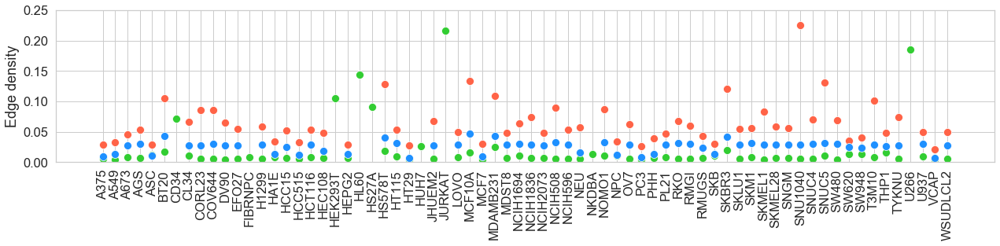

In [15]:
fig = plt.figure()
fig.set_size_inches(18, 5)
sns.set(font_scale=1.5)
with sns.axes_style('whitegrid'):
    sns.scatterplot(x='Cell_type_QUIZC', y='Density_QUIZC', data=merged_net_stats, color='limegreen', s=100)
    sns.scatterplot(x='Cell_type_QUIZC', y='Density_MODZ', data=merged_net_stats, color='tomato', s=100)
    sns.scatterplot(x='Cell_type_QUIZC', y='Density_CD', data=merged_net_stats,  color='dodgerblue', s=100)
    plt.xticks(rotation=90)
    plt.ylim(0, 0.25)
    plt.tight_layout()
    plt.ylabel('Edge density')
    plt.xlabel('')
    plt.savefig(proj_output_path + 'Edge_densities.pdf', format='pdf')
    plt.show()

## Edge direction concordance (Supp. Fig. 7F)

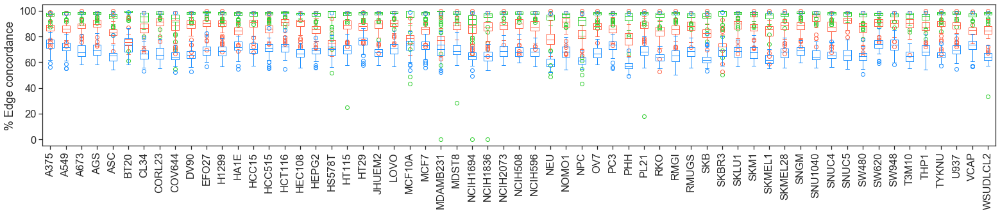

In [16]:
fig = plt.figure()
fig.set_size_inches(22, 5)
sns.set(font_scale=1.5)
with sns.axes_style("ticks"):
    box1 = plt.boxplot([list(QUIZC_edge_concordance_df[c][~pd.isnull(QUIZC_edge_concordance_df[c])].values) for c in MODZ_allcells['Cell_type']])
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box1[item], color='limegreen')
    plt.setp(box1["fliers"], markeredgecolor='limegreen')    
    
    box2 = plt.boxplot([list(MODZ_edge_concordance_df[c][~pd.isnull(MODZ_edge_concordance_df[c])].values) for c in MODZ_allcells['Cell_type']])
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box2[item], color='tomato')
    plt.setp(box2["fliers"], markeredgecolor='tomato')  
    
    box3 = plt.boxplot([list(CD_edge_concordance_df[c][~pd.isnull(CD_edge_concordance_df[c])].values) for c in MODZ_allcells['Cell_type']])
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box3[item], color='dodgerblue')
    plt.setp(box3["fliers"], markeredgecolor='dodgerblue') 
    
    plt.xticks(np.arange(1, len(MODZ_allcells['Cell_type'])+1),  MODZ_allcells['Cell_type'].values)
    plt.xticks(rotation=90)
    plt.ylabel('% Edge concordance')
    plt.tight_layout()
    plt.savefig(proj_output_path + 'edge_concordance_all_boxplot_NEW.pdf', format='pdf')
    plt.show()

## Reducibility analysis (Figure 3D, Supp. Figs. 8A-B)

In [17]:
from matplotlib.colors import rgb2hex, colorConverter
from collections import defaultdict

class Clusters(dict):
    def _repr_html_(self):
        html = '<table style="border: 0;">'
        for c in self:
            hx = rgb2hex(colorConverter.to_rgb(c))
            html += '<tr style="border: 0;">' \
            '<td style="background-color: {0}; ' \
                       'border: 0;">' \
            '<code style="background-color: {0};">'.format(hx)
            html += c + '</code></td>'
            html += '<td style="border: 0"><code>' 
            html += repr(self[c]) + '</code>'
            html += '</td></tr>'

        html += '</table>'

        return html

# (http://www.nxn.se/valent/extract-cluster-elements-by-color-in-python) and (https://nbviewer.jupyter.org/gist/vals/150ec97a5b7db9c82ee9) 
# Note: This is an ingenious method but has one minor flaw -- if the upper and lower legs of two branches somehow coincide (in the reducibility 
# dendrogram it does, so I guess it's not that rare), the same coordinate can be registered as a leaf in two different classes, and when the time 
# comes to plot, the non-leaf color can override the actual leaf color. to circumvent this issue, we should either remove whichever labels are 
# duplicated from the non-leaf (grey in this case) color, or make the coloring order such that grey gets colored first and all other colors 
# overwrite it.
def get_cluster_classes(den, label='ivl'):
    cluster_idxs = defaultdict(list)
    for c, pi in zip(den['color_list'], den['icoord']):
        for leg in pi[1:3]:
            i = (leg - 5.0) / 10.0
            #print(c, '|', pi, '|', leg,'|', i, '|', abs(i - int(i)) < 1e-5)
            if abs(i - int(i)) < 1e-5:
                cluster_idxs[c].append(int(i))

    # not the best solution but here is where we remove the redundant key from the grey class(i.e. "above_color_threshold parameter", set to #AAAAAA) 
    for key in set(cluster_idxs.keys()) - set(['#AAAAAA']):
        overlap = set(cluster_idxs[key]) & set(cluster_idxs['#AAAAAA'])
        #print(key, overlap, len(overlap))
        if len(overlap) > 0:
            for o in overlap:
                cluster_idxs['#AAAAAA'].pop(np.where(np.array(cluster_idxs['#AAAAAA'])==o)[0][0])                
                
    cluster_classes = Clusters()
    for c, l in cluster_idxs.items():
        i_l = [den[label][i] for i in l]
        cluster_classes[c] = i_l

    return cluster_classes

In [18]:
temp_cmap = get_cmap('gist_rainbow', 20) 
temp_cmap_hex = [rgb2hex(temp_cmap(i)[:3]) for i in range(temp_cmap.N)]
temp_palette = random.sample(temp_cmap_hex, len(temp_cmap_hex))
set_link_color_palette(temp_palette)

In [19]:
QUIZC_multired_Z = np.load(proj_reducibility_path + 'QUIZC_ALL_Z.npy')
QUIZC_multired_q_vals = np.load(proj_reducibility_path + 'QUIZC_ALL_q_vals.npy', allow_pickle=True)
QUIZC_multired_cuts = np.load(proj_reducibility_path + 'QUIZC_ALL_cuts.npy', allow_pickle=True)
QUIZC_multired_JSD_matrix = np.load(proj_reducibility_path + 'QUIZC_ALL_JSD_matrix.npy', allow_pickle=True)

MODZ_multired_Z = np.load(proj_reducibility_path + 'MODZ_ALL_Z.npy')
MODZ_multired_q_vals = np.load(proj_reducibility_path + 'MODZ_ALL_q_vals.npy', allow_pickle=True)
MODZ_multired_cuts = np.load(proj_reducibility_path + 'MODZ_ALL_cuts.npy', allow_pickle=True)
MODZ_multired_JSD_matrix = np.load(proj_reducibility_path + 'MODZ_ALL_JSD_matrix.npy', allow_pickle=True)

CD_multired_Z = np.load(proj_reducibility_path + 'CD_ALL_Z.npy')
CD_multired_q_vals = np.load(proj_reducibility_path + 'CD_ALL_q_vals.npy', allow_pickle=True)
CD_multired_cuts = np.load(proj_reducibility_path + 'CD_ALL_cuts.npy', allow_pickle=True)
CD_multired_JSD_matrix = np.load(proj_reducibility_path + 'CD_ALL_JSD_matrix.npy', allow_pickle=True)

In [20]:
QUIZC_multired_JSD_df = pd.DataFrame(QUIZC_multired_JSD_matrix, index=MODZ_allcells['Cell_type'], columns=MODZ_allcells['Cell_type'])
MODZ_multired_JSD_df = pd.DataFrame(MODZ_multired_JSD_matrix, index=MODZ_allcells['Cell_type'], columns=MODZ_allcells['Cell_type'])
CD_multired_JSD_df = pd.DataFrame(CD_multired_JSD_matrix, index=MODZ_allcells['Cell_type'], columns=MODZ_allcells['Cell_type'])

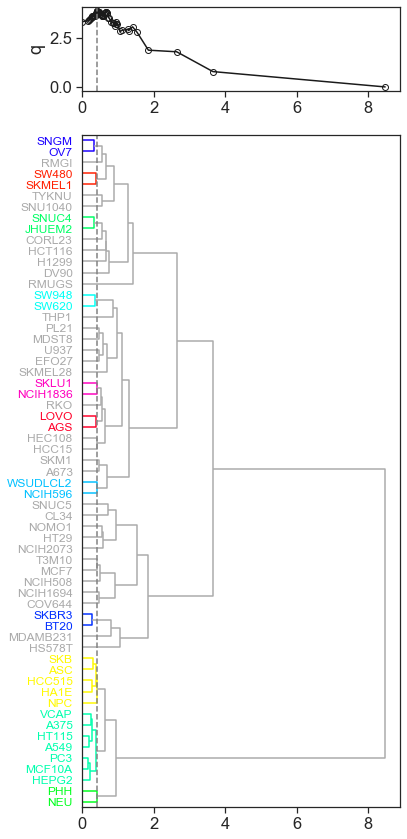

In [21]:
fig = plt.figure()
fig.set_size_inches(6, 12)
sns.set(font_scale=1.5)
gs = gridspec.GridSpec(2, 1, height_ratios=[1, 8]) 

threshold = np.insert(QUIZC_multired_Z[:, 2], 0 , 0)[np.argmax(np.abs(QUIZC_multired_q_vals))]
with sns.axes_style("ticks"):
    ax1 = plt.subplot(gs[0])
    plt.plot(np.insert(QUIZC_multired_Z[:, 2], 0 , 0), np.abs(QUIZC_multired_q_vals), '-o', color='k', mfc='none')
    ax1.axvline(x=threshold, ymin=0.0, ymax=1.0, linestyle='--', color='grey')
    plt.ylabel('q')

    # share x and y
    ax2 = plt.subplot(gs[1], sharex=ax1)
    dendro = dendrogram(QUIZC_multired_Z, orientation='right', color_threshold=threshold, above_threshold_color='#AAAAAA', 
                       labels=list(MODZ_allcells['Cell_type']) ) #cell labels left as CD since the cell line list of QUIZC is the same as CD and LCB
    ax2.axvline(x=threshold, ymin=0.0, ymax=1.0, linestyle='--', color='grey')
    ax2.tick_params(axis='y', which='major', labelsize=12)
    
    
    ylbls = ax2.get_ymajorticklabels()
    
    cluster_classes = get_cluster_classes(dendro)
    col_list = []
    for ci in dendro['ivl']:
        for col, c in cluster_classes.items():
            if ci in c:
                col_list.append(col)
                
    for ix, lbl in enumerate(ylbls):
        lbl.set_color(col_list[ix])
    
    #plt.xlim(0.01, 5.0)
    plt.tight_layout()
    plt.savefig(proj_output_path + 'QUIZC_reducibility.pdf', format='pdf', bbox_inches='tight')
    plt.show()

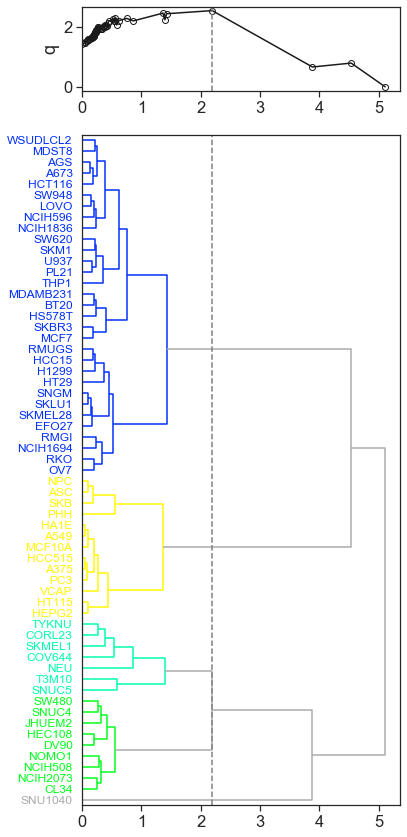

In [22]:
fig = plt.figure()
fig.set_size_inches(6, 12)
sns.set(font_scale=1.5)
gs = gridspec.GridSpec(2, 1, height_ratios=[1, 8]) 

threshold = np.insert(MODZ_multired_Z[:, 2], 0 , 0)[np.argmax(np.abs(MODZ_multired_q_vals))]
with sns.axes_style("ticks"):
    ax1 = plt.subplot(gs[0])
    plt.plot(np.insert(MODZ_multired_Z[:, 2], 0 , 0), np.abs(MODZ_multired_q_vals), '-o', color='k', mfc='none')
    ax1.axvline(x=threshold, ymin=0.0, ymax=1.0, linestyle='--', color='grey')
    plt.ylabel('q')

    # share x and y
    ax2 = plt.subplot(gs[1], sharex=ax1)
    dendro = dendrogram(MODZ_multired_Z, orientation='right', color_threshold=threshold, above_threshold_color='#AAAAAA', 
                       labels=list(MODZ_allcells['Cell_type']) ) #cell labels left as CD since the cell line list of QUIZC is the same as CD and LCB
    ax2.axvline(x=threshold, ymin=0.0, ymax=1.0, linestyle='--', color='grey')
    ax2.tick_params(axis='y', which='major', labelsize=12)
    
    
    ylbls = ax2.get_ymajorticklabels()
    
    cluster_classes = get_cluster_classes(dendro)
    col_list = []
    for ci in dendro['ivl']:
        for col, c in cluster_classes.items():
            if ci in c:
                col_list.append(col)
                
    for ix, lbl in enumerate(ylbls):
        lbl.set_color(col_list[ix])
    
    #plt.xlim(0.01, 5.0)
    plt.tight_layout()
    plt.savefig(proj_output_path + 'MODZ_reducibility.pdf', format='pdf', bbox_inches='tight')
    plt.show()

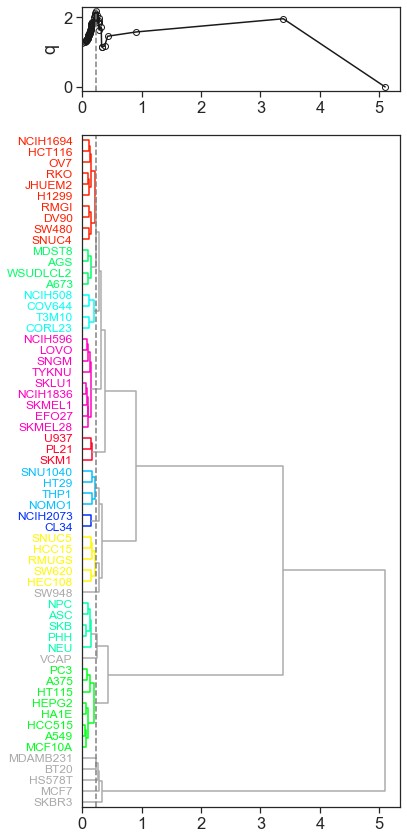

In [23]:
fig = plt.figure()
fig.set_size_inches(6, 12)
sns.set(font_scale=1.5)
gs = gridspec.GridSpec(2, 1, height_ratios=[1, 8]) 

threshold = np.insert(CD_multired_Z[:, 2], 0 , 0)[np.argmax(np.abs(CD_multired_q_vals))]
with sns.axes_style("ticks"):
    ax1 = plt.subplot(gs[0])
    plt.plot(np.insert(CD_multired_Z[:, 2], 0 , 0), np.abs(CD_multired_q_vals), '-o', color='k', mfc='none')
    ax1.axvline(x=threshold, ymin=0.0, ymax=1.0, linestyle='--', color='grey')
    plt.ylabel('q')

    # share x and y
    ax2 = plt.subplot(gs[1], sharex=ax1)
    dendro = dendrogram(CD_multired_Z, orientation='right', color_threshold=threshold, above_threshold_color='#AAAAAA', 
                       labels=list(MODZ_allcells['Cell_type']) ) #cell labels left as CD since the cell line list of QUIZC is the same as CD and LCB
    ax2.axvline(x=threshold, ymin=0.0, ymax=1.0, linestyle='--', color='grey')
    ax2.tick_params(axis='y', which='major', labelsize=12)
    
    
    ylbls = ax2.get_ymajorticklabels()
    
    cluster_classes = get_cluster_classes(dendro)
    col_list = []
    for ci in dendro['ivl']:
        for col, c in cluster_classes.items():
            if ci in c:
                col_list.append(col)
                
    for ix, lbl in enumerate(ylbls):
        lbl.set_color(col_list[ix])
    
    #plt.xlim(0.01, 5.0)
    plt.tight_layout()
    plt.savefig(proj_output_path + 'CD_reducibility.pdf', format='pdf', bbox_inches='tight')
    plt.show()

In [24]:
(61 - 42) / 60.0, (61 - 5) / 60.0, (61 - 17) / 60.0

(0.31666666666666665, 0.9333333333333333, 0.7333333333333333)

## Single Tandem Repeat (STR) profile similarity of cell lines (Supp. Figs. 9A-B)
Using Cellosaurus data + CLASTR (STR profile similarity)

In [32]:
cs = pd.read_csv(proj_external_data_path + 'Cellosaurus/cellosaurus.txt', sep='   ', skiprows=55, engine='python', header=None)

cs_L1000cells_df_dict = {}
for c in tqdm(QUIZC_allcells['Cell_type']):
    temp_ID_df = cs[(cs[0] == 'ID') & (cs[1].str.contains(c))]
    temp_SY_df = cs[(cs[0] == 'SY') & (cs[1].str.contains(c))]    
    cs_L1000cells_df_dict[c] = pd.concat([temp_ID_df, temp_SY_df])

# corner case: add RMG-I, whose synonym is RMG1 and not RMGI
cs_L1000cells_df_dict['RMGI'] = cs[(cs[0] == 'ID') & (cs[1].str.contains('RMG-I'))]

# corner case: since the main OV7 (ID) with the ST values is overwritten by the synonym version without ST values, we need to remove those
cs_L1000cells_df_dict['OV7'] = cs_L1000cells_df_dict['OV7'].iloc[:-1]

cs_L1000cells_df_full_dict = {}
for c in QUIZC_allcells['Cell_type']:
    cs_L1000cells_df_full_dict[c] = {}
    
for c in tqdm(QUIZC_allcells['Cell_type']):
    
    for n, ix in enumerate(cs_L1000cells_df_dict[c].index.values):

        left_cut = np.min(np.abs(ix - cs[cs[0]=='//'].index.values))
        left_index = ix - left_cut
        right_index = cs[cs[0]=='//'].index.values[np.where(cs[cs[0]=='//'].index.values==left_index)[0][0] + 1]
        
        cs_L1000cells_df_full_dict[c][cs.iloc[ix][1]] = cs.iloc[left_index:right_index]

cs_ST_df_dict = {}
for c in QUIZC_allcells['Cell_type']:
    cs_ST_df_dict[c] = {}
for c in QUIZC_allcells['Cell_type']:
    for key in cs_L1000cells_df_full_dict[c].keys():
        if 'ST' in set(cs_L1000cells_df_full_dict[c][key][0]):
            #print(c, '|', key, '|', 'data available')
            cs_ST_df_dict[c][key] = pd.DataFrame(np.array(list(cs_L1000cells_df_full_dict[c][key][cs_L1000cells_df_full_dict[c][key][0]=='ST'][1]
                                                               .str.split(': ').values)))

ST_all_keys = []
for c in QUIZC_allcells['Cell_type']:
    ST_all_keys.extend(list(cs_ST_df_dict[c].keys()))
ST_all_keys = set(ST_all_keys)

CLASTR_df = pd.DataFrame(columns=ST_all_keys, index=['Amelogenin', 'CSF1PO', 'D2S1338', 'D3S1358', 'D5S818', 'D7S820', 'D8S1179', 
                                                               'D13S317', 'D16S539', 'D18S51', 'D19S433', 'D21S11', 'FGA', 'Penta D', 'Penta E', 
                                                               'TH01', 'TPOX', 'vWA'])

for c in QUIZC_allcells['Cell_type']:
    for key in cs_ST_df_dict[c].keys():        
        temp_ST_df = cs_ST_df_dict[c][key].iloc[1:]
        for s, t in temp_ST_df[[0, 1]].values:
            CLASTR_df.at[s, key] = t
            
for c in QUIZC_allcells['Cell_type']:
    for key in cs_ST_df_dict[c].keys():        
        temp_ST_df = cs_ST_df_dict[c][key].iloc[1:]
        for s, t in temp_ST_df[[0, 1]].values:
            CLASTR_df.at[s, key] = t

CLASTR_df.T.to_csv(proj_intermediary_outputs_path + 'L1000_CLASTR_query.csv', index=True)

# get the Cellosaurus accession numbers (AC IDs) for 52 selected cell lines for which we have calculated the CLASTR STR similarity scores
cs_AC_df_dict = {}
for c in QUIZC_allcells['Cell_type']:
    for key in cs_L1000cells_df_full_dict[c].keys():
        cs_AC_df_dict[key] = cs_L1000cells_df_full_dict[c][key][cs_L1000cells_df_full_dict[c][key][0]=='AC'][1].values[0]
cs_AC_df = pd.DataFrame.from_dict(cs_AC_df_dict, orient='Index').rename(columns={0: 'AC'})

CLASTR_selected_rows = pd.read_csv(proj_intermediary_outputs_path + 'L1000_CLASTR_query_selected_rows.csv')
CLASTR_selected_ACs = pd.merge(cs_AC_df, CLASTR_selected_rows, left_index=True, right_on='Cellosaurus ID/Synonym').set_index('L1000 ID')

CLASTR_60_sim_df = pd.DataFrame(index=CLASTR_selected_ACs.index, columns=CLASTR_selected_ACs.index)

# cell lines missing STR profile information
print(set(QUIZC_allcells['Cell_type']) - set(CLASTR_60_sim_df.index))

clastr_path = proj_intermediary_outputs_path + 'CLASTR_results/'

CLASTR_results_df_dict = {}
for f in os.listdir(clastr_path):
    if f.endswith('CLASTR_Results.csv'):
        CLASTR_results_df_dict[f.split('_')[0]] = pd.read_csv(clastr_path + f).iloc[1:]

for i in CLASTR_selected_ACs.index:
    for j in CLASTR_selected_ACs.index:
        if len(CLASTR_results_df_dict[i][CLASTR_results_df_dict[i]['Accession']
                                                            .str.contains(CLASTR_selected_ACs.loc[j]['AC'])]) > 0:
            CLASTR_60_sim_df.at[i, j] = CLASTR_results_df_dict[i][CLASTR_results_df_dict[i]['Accession']
                                                            .str.contains(CLASTR_selected_ACs.loc[j]['AC'])]['Score'].values[0].replace('%', '')
        else:
            CLASTR_60_sim_df.at[i, j] = 0.0

CLASTR_60_sim_df = CLASTR_60_sim_df.astype(float)

for i in CLASTR_60_sim_df.index:
    for j in CLASTR_60_sim_df.index:
        if CLASTR_60_sim_df.at[i, j] != CLASTR_60_sim_df.at[j, i]:
            CLASTR_60_sim_df.at[i, j] = max(CLASTR_60_sim_df.at[i, j], CLASTR_60_sim_df.at[j, i])
            CLASTR_60_sim_df.at[j, i] = CLASTR_60_sim_df.at[i, j]

CLASTR_60_sim_df.to_csv(proj_intermediary_outputs_path + 'CLASTR_60_sim_df.csv')

100%|██████████| 70/70 [05:00<00:00,  4.29s/it]


{'NPC', 'HA1E', 'CD34', 'PHH', 'SKB', 'FIBRNPC', 'HCC515', 'NKDBA', 'NEU', 'MCF7'}


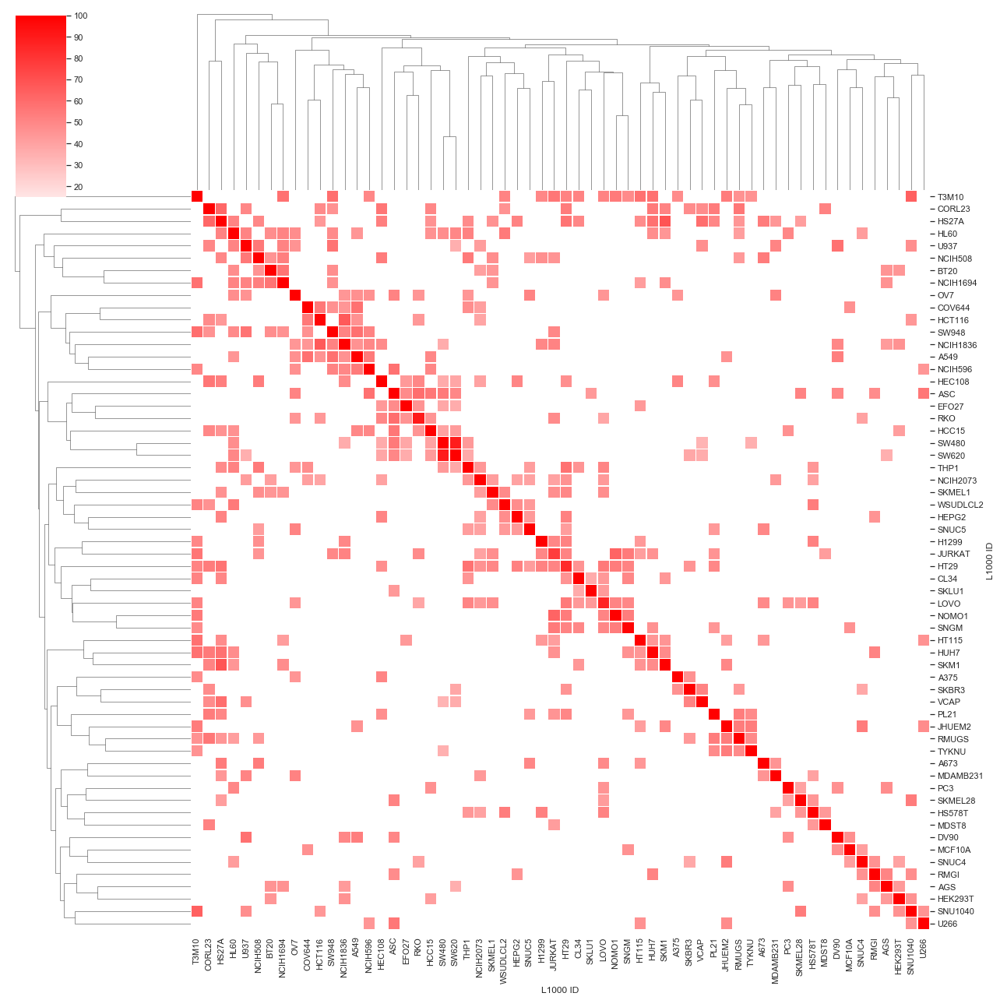

In [33]:
from scipy.spatial import distance
from scipy.cluster import hierarchy

sns.set(font_scale=1.0)
with sns.axes_style("white"):
    sns.clustermap(CLASTR_60_sim_df, mask=CLASTR_60_sim_df==0, cmap=sns.light_palette('red', n_colors=20, as_cmap=True), linewidths=0.5, 
                   figsize=(18, 18), vmin=15, vmax=100)
    plt.savefig(proj_output_path + 'STR_similarity_clustered.pdf', format='pdf', bbox_inches='tight')

In [34]:
# percent under detection threshold (not within top-1000 similar) 
below_ths_df = pd.DataFrame(index=sorted(list(CLASTR_60_sim_df.keys())), columns=['# cell lines with similarity score below threshold', 
                                                                          '% cell lines with similarity score below threshold', 
                                                                          'Score threshold for top 1000'])
for c in CLASTR_60_sim_df.keys():
    
    below_ths_df.at[c, '# cell lines with similarity score below threshold'] = len(CLASTR_60_sim_df[c][CLASTR_60_sim_df[c]==0.0])
    below_ths_df.at[c, '% cell lines with similarity score below threshold'] = 100.0 * len(CLASTR_60_sim_df[c][CLASTR_60_sim_df[c]==0.0]) /\
                                                                        len(CLASTR_60_sim_df)    
    below_ths_df.at[c, 'Score threshold for top 1000'] = np.min(CLASTR_results_df_dict[c]['Score'].str.replace('%', '').astype(float))

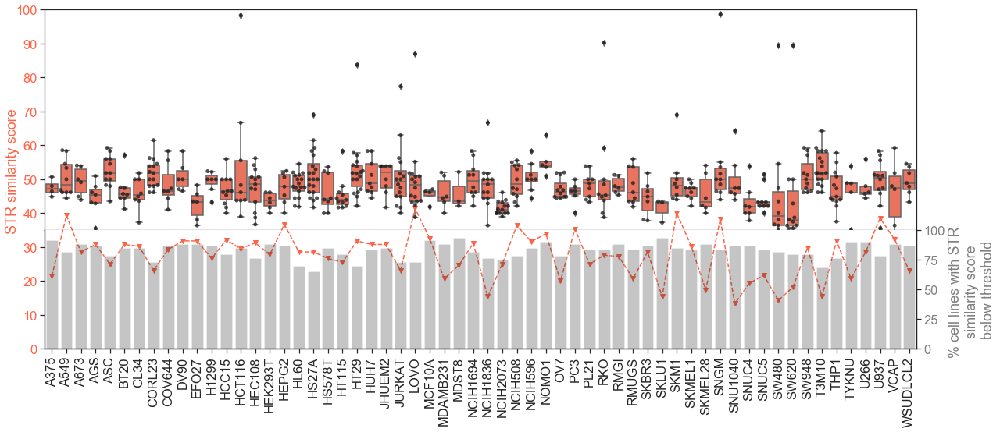

In [35]:
fig = plt.figure()
fig.set_size_inches(20, 8)
sns.set(font_scale=1.5)
gs = gridspec.GridSpec(2, 1, height_ratios=[6.5, 3.5]) 
gs.update(wspace=0.025, hspace=0)

with sns.axes_style("ticks"):
    ax1 = plt.subplot(gs[0])
    sns.boxplot(data=CLASTR_60_sim_df[(CLASTR_60_sim_df>0) & (CLASTR_60_sim_df<100)], color='tomato')
    sns.swarmplot(data=CLASTR_60_sim_df[(CLASTR_60_sim_df>0) & (CLASTR_60_sim_df<100)], color='k', alpha=0.75)
    plt.plot(below_ths_df.index, below_ths_df['Score threshold for top 1000'], 'v--', color='tomato')
    #ax1.axvline(x=threshold, ymin=0.0, ymax=1.0, linestyle='--', color='grey')
    plt.xticks(rotation=90)
    plt.ylim(35, 100)
    ax1.tick_params(axis='y', labelcolor='tomato')
    
    ax2 = plt.subplot(gs[1], sharex=ax1)
    plt.plot(below_ths_df.index, below_ths_df['Score threshold for top 1000'], 'v--', color='tomato')
    plt.xticks(rotation=90)
    plt.ylim(0, 35)
    ax2.tick_params(axis='y', labelcolor='tomato')
    ax2.spines['top'].set_visible(False)
    ax2.set_ylabel('STR similarity score', y = 1.5)
    ax2.yaxis.label.set_color('tomato')
    
    # share x and y
    ax3 = ax2.twinx()
    sns.barplot(x=below_ths_df.index, y='% cell lines with similarity score below threshold', data=below_ths_df, orient='v', color='k', alpha=0.25)
    plt.xticks(rotation=90)
    plt.ylim(0, 100)
    ax3.tick_params(axis='y', labelcolor='grey')
    ax3.spines['top'].set_visible(False)
    ax3.set_ylabel('% cell lines with STR \nsimilarity score \nbelow threshold')
    ax3.yaxis.label.set_color('grey')
    
    plt.savefig(proj_output_path + 'STR_similarity.pdf', format='pdf', bbox_inches='tight')
    plt.show()

## Cell line ontology (CLO) analysis of the cell lines (Supp. Figs. 10A-B)

#### Parse CLO data

In [36]:
clo_data = pd.read_csv(proj_external_data_path + 'CLO/CLO.csv', low_memory=False)

In [37]:
clo_edges = []
for i in tqdm(np.arange(len(clo_data))):
    if pd.isnull(clo_data.iloc[i]['Parents']) != True:
        for j in clo_data.iloc[i]['Parents'].split('|'):            
            temp_dict = {}
            temp_dict['Child']=clo_data.iloc[i]['Class ID'].split('/')[-1:][0]
            temp_dict['Parent']=j.split('/')[-1:][0]
            clo_edges.append(temp_dict)
clo_edges_df = pd.DataFrame(clo_edges)    

100%|██████████| 44874/44874 [00:35<00:00, 1265.78it/s]


In [38]:
clo_edges_df.to_csv(proj_intermediary_outputs_path + 'CLO_edges.csv')

In [39]:
g_clo = nx.Graph()
g_clo.add_edges_from(clo_edges_df.values)

g_clo_dir = nx.DiGraph()
g_clo_dir.add_edges_from(clo_edges_df[['Parent', 'Child']].values)

In [40]:
len(g_clo.nodes()), len(g_clo.edges())

(44871, 46410)

In [41]:
nx.is_directed_acyclic_graph(g_clo), nx.is_directed_acyclic_graph(g_clo_dir)

(False, True)

In [42]:
clo_edges_df_CLOonly = clo_edges_df[(clo_edges_df['Child'].str.startswith('CLO_')) & (clo_edges_df['Parent'].str.startswith('CLO_'))]

In [43]:
g_clo_CLOonly = nx.Graph()
g_clo_CLOonly.add_edges_from(clo_edges_df_CLOonly.values)

g_clo_CLOonly_dir = nx.DiGraph()
g_clo_CLOonly_dir.add_edges_from(clo_edges_df_CLOonly[['Parent', 'Child']].values)

In [44]:
nx.is_directed_acyclic_graph(g_clo_CLOonly), nx.is_directed_acyclic_graph(g_clo_CLOonly_dir)

(False, True)

#### Calculate semantic similarity from CLO
Following [Wang, James Z., et al. "A new method to measure the semantic similarity of GO terms." Bioinformatics 23.10 (2007): 1274-1281](https://academic.oup.com/bioinformatics/article/23/10/1274/197095#1953560).

In [45]:
LINCS2CLO = pd.read_csv(proj_intermediary_outputs_path + 'Cell_IDs_LINCS2CLO.csv')
LINCS2CLO = LINCS2CLO[~pd.isnull(LINCS2CLO['CLO ID'])]

In [46]:
w_s = 0.5

SV = {}
S_dict = {c: {} for c in LINCS2CLO['LINCS']}
    
for c in LINCS2CLO['LINCS']:
    
    clo_id = LINCS2CLO[LINCS2CLO['LINCS']==c]['CLO ID'].values[0]
    S_dict[c][clo_id] = 1.0
    
    anc = nx.ancestors(g_clo_dir, clo_id)
    anc.add(clo_id)
    dag = nx.subgraph(g_clo_dir, anc)
    for t in list(nx.dfs_postorder_nodes(dag, 'owl#Thing'))[1:]: # this has to go in order up the tree (owl#Thing is the top of the hierarchy)
        S_dict[c][t] = max([w_s * S_dict[c][t1] for t1 in list(dag.successors(t))])
    
    SV[c] = np.sum(list(S_dict[c].values()))

In [47]:
S_CLO_df = pd.DataFrame(index=LINCS2CLO['LINCS'], columns=LINCS2CLO['LINCS'])
for c1 in LINCS2CLO['LINCS']:
    for c2 in LINCS2CLO['LINCS']:        
        if len(set(S_dict[c1].keys()) & set(S_dict[c2].keys())) > 0:
            S_CLO_df.at[c1, c2] = np.sum([S_dict[c1][t] + S_dict[c2][t] for t in set(S_dict[c1].keys()) & set(S_dict[c2].keys())]) / (SV[c1] + SV[c2])
        else:
            S_CLO_df.at[c1, c2] = 0
S_CLO_df = S_CLO_df.astype(float)

In [48]:
S_CLO_df.to_csv(proj_intermediary_outputs_path + 'CLO_sim_df.csv')

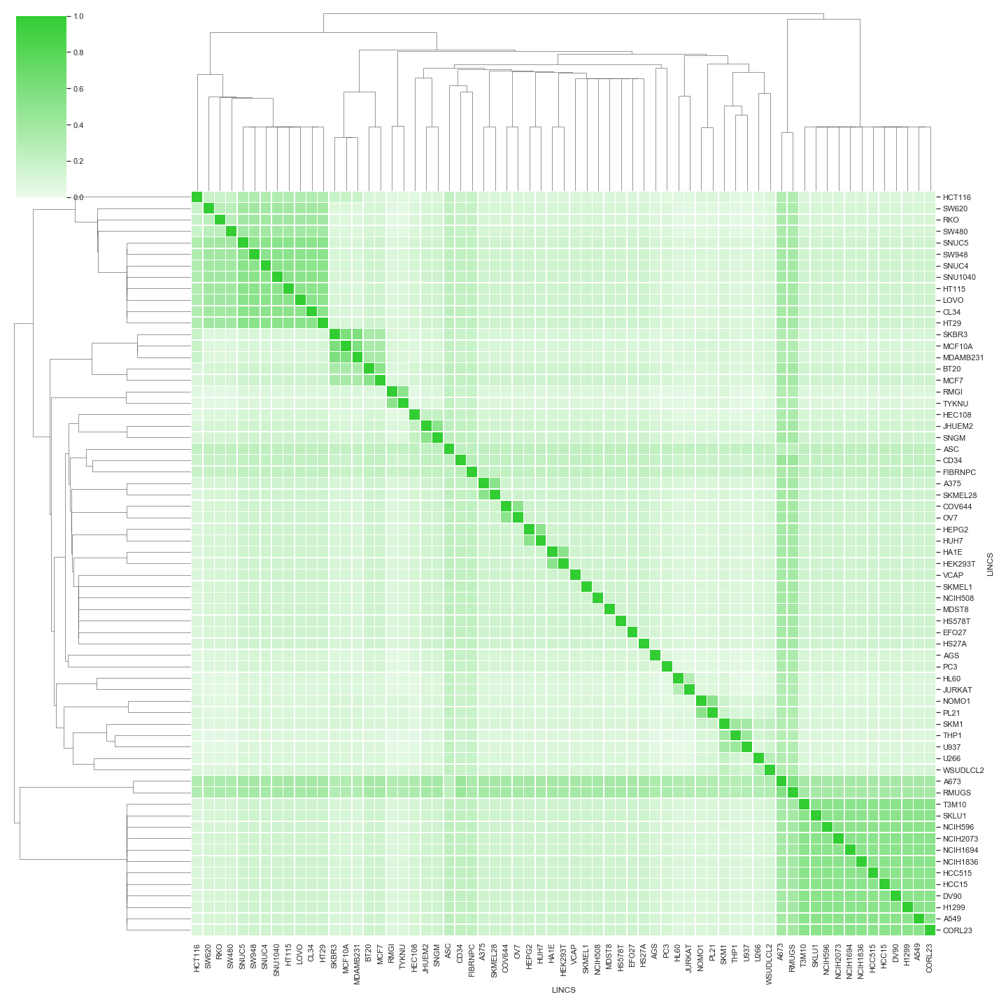

In [49]:
sns.set(font_scale=1.0)
with sns.axes_style("white"):
    sns.clustermap(S_CLO_df, cmap=sns.light_palette('limegreen', n_colors=20, as_cmap=True), linewidths=0.5, 
                   figsize=(20, 20), vmin=0.0, vmax=1.0)
    plt.savefig(proj_output_path + 'CLO_graph_based_semantic_similarity.pdf', format='pdf', bbox_inches='tight')

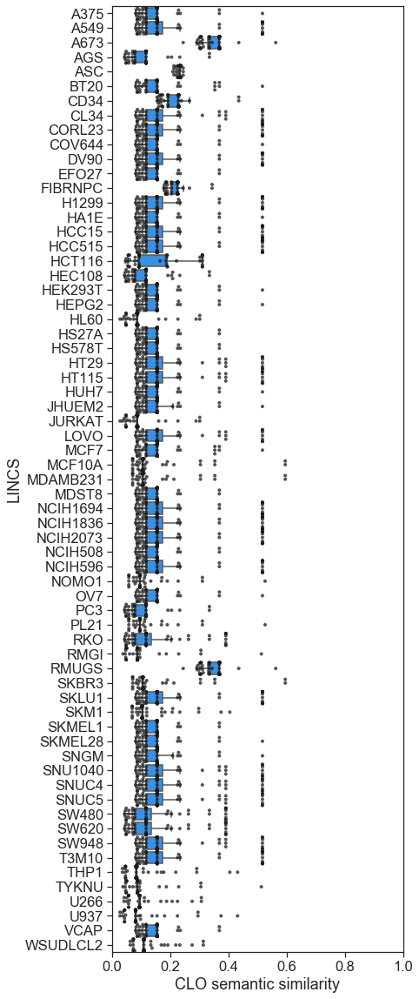

In [50]:
fig = plt.figure()
fig.set_size_inches(6, 20)
sns.set(font_scale=1.5)

with sns.axes_style("ticks"):

    ax1 = sns.boxplot(data=S_CLO_df[S_CLO_df<1.0], color='dodgerblue', orient='h',  showfliers = False)
    ax1 = sns.swarmplot(data=S_CLO_df[S_CLO_df<1.0], color='k', alpha=0.75, size=4, orient='h')
    plt.yticks(rotation=0)
    plt.xlim(0.0, 1.0)    
    plt.xlabel('CLO semantic similarity')
    plt.savefig(proj_output_path + 'L1000_CLO_semantic_similarity.pdf', format='pdf', bbox_inches='tight')
    plt.show()

## Enrichment of known drug-target interactions in QUIZC/MODZ/CD networks (Supp. Fig. 11A, 13A)                                                           

#### Drug Repurposing Hub data

In [51]:
DRH_samples = pd.read_csv(proj_external_data_path + 'DRH/repurposing_samples_20180907.txt', skiprows=9, sep='\t')
DRH_drugs = pd.read_csv(proj_external_data_path + 'DRH/repurposing_drugs_20180907.txt', skiprows=9, sep='\t')
print(len(DRH_drugs), len(DRH_samples))

6125 10147


In [52]:
DRH_drugs_samples_df = DRH_samples.join(DRH_drugs.set_index('pert_iname'), on='pert_iname')

In [53]:
DRH_coverage_df = pd.DataFrame(index=QUIZC_allcells['Cell_type'], columns=['DRH coverage (QUIZC)', 'DRH coverage (MODZ)', 'DRH coverage (CD)'])
for c in QUIZC_allcells['Cell_type']:
    DRH_coverage_df.at[c, 'DRH coverage (QUIZC)'] = 100.0 * (len(set(QUIZC_edgelist_df_dict[c]['Drug']) & set(DRH_drugs['pert_iname'])) / 
                                                          len(set(QUIZC_edgelist_df_dict[c]['Drug'])))
for c in MODZ_allcells['Cell_type']:
    DRH_coverage_df.at[c, 'DRH coverage (MODZ)'] = 100.0 * (len(set(MODZ_edgelist_df_dict[c]['Drug']) & set(DRH_drugs['pert_iname'])) /
                                                         len(set(MODZ_edgelist_df_dict[c]['Drug'])))
for c in CD_allcells['Cell_type']:
    DRH_coverage_df.at[c, 'DRH coverage (CD)'] = 100.0 * (len(set(CD_edgelist_df_dict[c]['Drug']) & set(DRH_drugs['pert_iname'])) /
                                                        len(set(CD_edgelist_df_dict[c]['Drug'])))

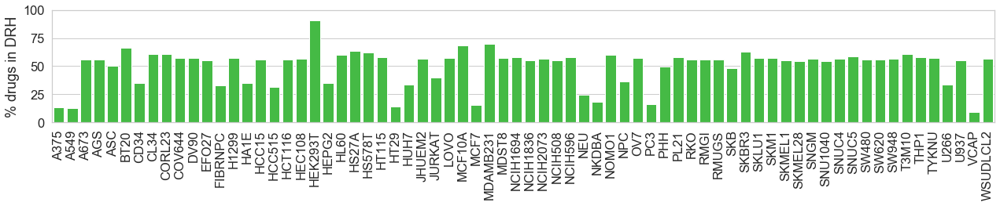

In [54]:
fig = plt.figure()
fig.set_size_inches(18, 4)
sns.set(font_scale=1.5)
with sns.axes_style('whitegrid'):
    sns.barplot(x=DRH_coverage_df.index, y='DRH coverage (QUIZC)', data=DRH_coverage_df, orient='v', color='limegreen')
    plt.ylim(0.0, 100.0)
    plt.xticks(rotation=90)
    plt.xlabel('')
    plt.ylabel('% drugs in DRH')
    plt.tight_layout()
    plt.savefig(proj_output_path + 'DRH_MoA_coverage_QUIZC.pdf', format='pdf', bbox_inches='tight')
    plt.show()

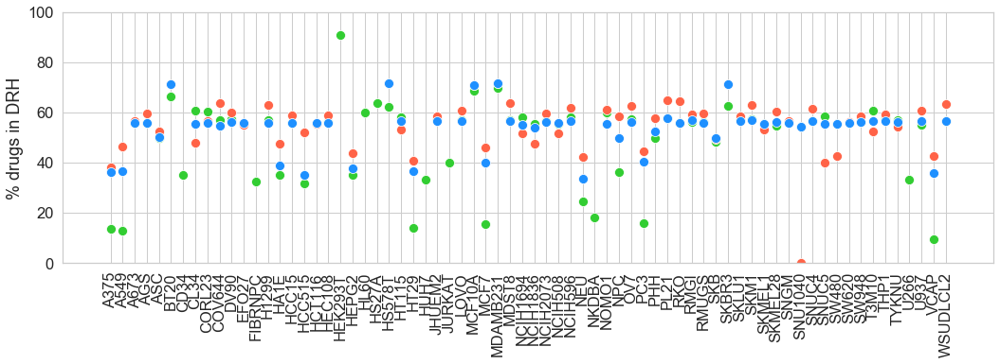

In [55]:
fig = plt.figure()
fig.set_size_inches(15, 6)
sns.set(font_scale=1.5)
with sns.axes_style('whitegrid'):
    sns.scatterplot(x=DRH_coverage_df.index, y='DRH coverage (QUIZC)', data=DRH_coverage_df, color='limegreen', s=100)
    sns.scatterplot(x=DRH_coverage_df.index, y='DRH coverage (MODZ)', data=DRH_coverage_df, color='tomato', s=100)
    sns.scatterplot(x=DRH_coverage_df.index, y='DRH coverage (CD)', data=DRH_coverage_df,  color='dodgerblue', s=100)
    plt.xticks(rotation=90)
    plt.ylim(0.0, 100.0)
    plt.tight_layout()
    plt.ylabel('% drugs in DRH')
    plt.xlabel('')
    plt.savefig(proj_output_path + 'DRH_MoA_coverage_all.pdf', format='pdf')
    plt.show()

#### DGIdb data

In [56]:
DGIdb_interactions = pd.read_csv(proj_external_data_path +'DGIdb/interactions.tsv', sep='\t')
DGIdb_genes = pd.read_csv(proj_external_data_path +'DGIdb/genes.tsv', sep='\t')
DGIdb_drugs = pd.read_csv(proj_external_data_path +'DGIdb/drugs.tsv', sep='\t')
DGIdb_categories = pd.read_csv(proj_external_data_path +'DGIdb/categories.tsv', sep='\t')

In [66]:
# # write file to be sent to "https://pubchem.ncbi.nlm.nih.gov/idexchange/idexchange.cgi" for conversion between CHEMBL IDs and Pubchem CIDs
# f = open(proj_output_path + 'DGIdb_drug_CHEMBL_ids_Oct2020.txt', 'w')
# for i in list(set(DGIdb_drugs['chembl_id']))[1:]:
#     f.write('%s\n' % i)
# f.close()

In [57]:
DGIdb_CHEMBL2CID = pd.read_csv(proj_intermediary_outputs_path + 'DGIdb_drug_CHEMBLids2CIDs.txt', sep='\t')
DGIdb_interactions_CID = pd.merge(DGIdb_interactions, DGIdb_CHEMBL2CID, left_on='drug_chembl_id', right_on='CHEMBL_id')

L1000_pert_info_cp = L1000_pert_info[L1000_pert_info['pert_type']=='trt_cp']
L1000_iname_CID_df = L1000_pert_info_cp[['pert_iname', 'pubchem_cid']]

# one 'pubchem cid' entry has characters in it, remove it manually 
L1000_iname_CID_df = L1000_iname_CID_df.loc[set(L1000_iname_CID_df.index) - set([20488])]
# convert the series to numeric
L1000_iname_CID_df['pubchem_cid'] = pd.to_numeric(L1000_iname_CID_df['pubchem_cid'])
# attach pert_iname values from L1000_pert_info to DGIdb data
DGIdb_interactions_iname_df = pd.merge(DGIdb_interactions_CID, L1000_iname_CID_df, left_on='CID', right_on='pubchem_cid')

In [58]:
DGIdb_coverage_df = pd.DataFrame(index=QUIZC_allcells['Cell_type'], columns=['DGIdb coverage (QUIZC)', 'DGIdb coverage (MODZ)', 'DGIdb coverage (CD)'])
for c in QUIZC_allcells['Cell_type']:
    DGIdb_coverage_df.at[c, 'DGIdb coverage (QUIZC)'] = 100.0 * (len(set(QUIZC_edgelist_df_dict[c]['Drug']) & 
                                                                    set(DGIdb_interactions_iname_df['pert_iname'])) / 
                                                          len(set(QUIZC_edgelist_df_dict[c]['Drug'])))
for c in MODZ_allcells['Cell_type']:
    DGIdb_coverage_df.at[c, 'DGIdb coverage (MODZ)'] = 100.0 * (len(set(MODZ_edgelist_df_dict[c]['Drug']) & 
                                                                   set(DGIdb_interactions_iname_df['pert_iname'])) /
                                                         len(set(MODZ_edgelist_df_dict[c]['Drug'])))
for c in CD_allcells['Cell_type']:
    DGIdb_coverage_df.at[c, 'DGIdb coverage (CD)'] = 100.0 * (len(set(CD_edgelist_df_dict[c]['Drug']) & 
                                                                  set(DGIdb_interactions_iname_df['pert_iname'])) /
                                                        len(set(CD_edgelist_df_dict[c]['Drug'])))

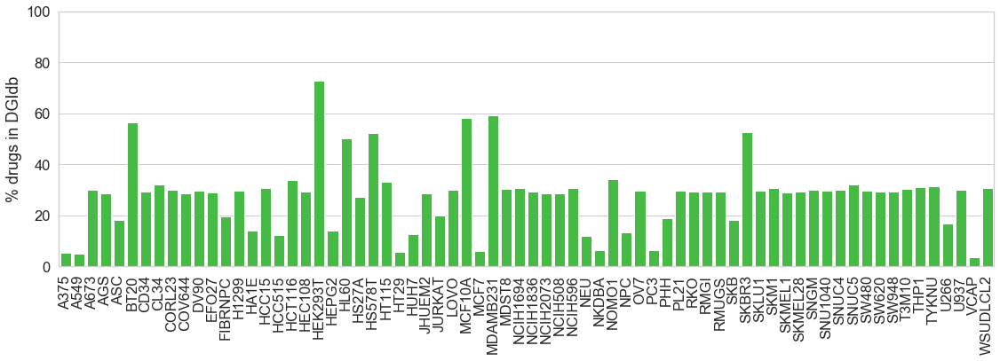

In [59]:
fig = plt.figure()
fig.set_size_inches(16, 6)
sns.set(font_scale=1.5)
with sns.axes_style('whitegrid'):
    sns.barplot(x=DGIdb_coverage_df.index, y='DGIdb coverage (QUIZC)', data=DGIdb_coverage_df, orient='v', color='limegreen')
    plt.ylim(0.0, 100.0)
    plt.xticks(rotation=90)
    plt.xlabel('')
    plt.ylabel('% drugs in DGIdb')
    plt.tight_layout()
    plt.savefig(proj_output_path + 'DGIdb_coverage_QUIZC.pdf', format='pdf', bbox_inches='tight')
    plt.show()

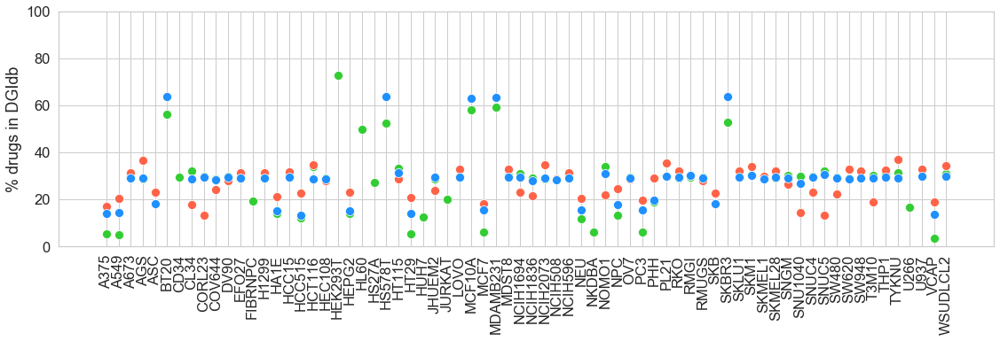

In [60]:
fig = plt.figure()
fig.set_size_inches(16, 6)
sns.set(font_scale=1.5)
with sns.axes_style('whitegrid'):
    sns.scatterplot(x=DGIdb_coverage_df.index, y='DGIdb coverage (QUIZC)', data=DGIdb_coverage_df, color='limegreen', s=100)
    sns.scatterplot(x=DGIdb_coverage_df.index, y='DGIdb coverage (MODZ)', data=DGIdb_coverage_df, color='tomato', s=100)
    sns.scatterplot(x=DGIdb_coverage_df.index, y='DGIdb coverage (CD)', data=DGIdb_coverage_df,  color='dodgerblue', s=100)
    plt.xticks(rotation=90)
    plt.ylim(0.0, 100.0)
    plt.tight_layout()
    plt.ylabel('% drugs in DGIdb')
    plt.xlabel('')
    plt.savefig(proj_output_path + 'DGIdb_coverage_all.pdf', format='pdf')
    plt.show()

#### DRH + DGIdb data

In [61]:
DRH_DGIdb_coverage_df = pd.DataFrame(index=QUIZC_allcells['Cell_type'], columns=['DRH+DGIdb coverage (QUIZC)', 'DRH+DGIdb coverage (MODZ)', 
                                                                           'DRH+DGIdb coverage (CD)'])
for c in QUIZC_allcells['Cell_type']:
    DRH_DGIdb_coverage_df.at[c, 'DRH+DGIdb coverage (QUIZC)'] = 100.0 * (len(set(QUIZC_edgelist_df_dict[c]['Drug']) & 
                                                                            (set(DGIdb_interactions_iname_df['pert_iname']) | 
                                                                             set(DRH_drugs['pert_iname']))) / 
                                                                        len(set(QUIZC_edgelist_df_dict[c]['Drug'])))
for c in MODZ_allcells['Cell_type']:
    DRH_DGIdb_coverage_df.at[c, 'DRH+DGIdb coverage (MODZ)'] = 100.0 * (len(set(MODZ_edgelist_df_dict[c]['Drug']) & 
                                                                            (set(DGIdb_interactions_iname_df['pert_iname']) | 
                                                                             set(DRH_drugs['pert_iname']))) /
                                                                       len(set(MODZ_edgelist_df_dict[c]['Drug'])))
for c in CD_allcells['Cell_type']:
    DRH_DGIdb_coverage_df.at[c, 'DRH+DGIdb coverage (CD)'] = 100.0 * (len(set(CD_edgelist_df_dict[c]['Drug']) &  
                                                                            (set(DGIdb_interactions_iname_df['pert_iname']) | 
                                                                             set(DRH_drugs['pert_iname']))) /
                                                                      len(set(CD_edgelist_df_dict[c]['Drug'])))

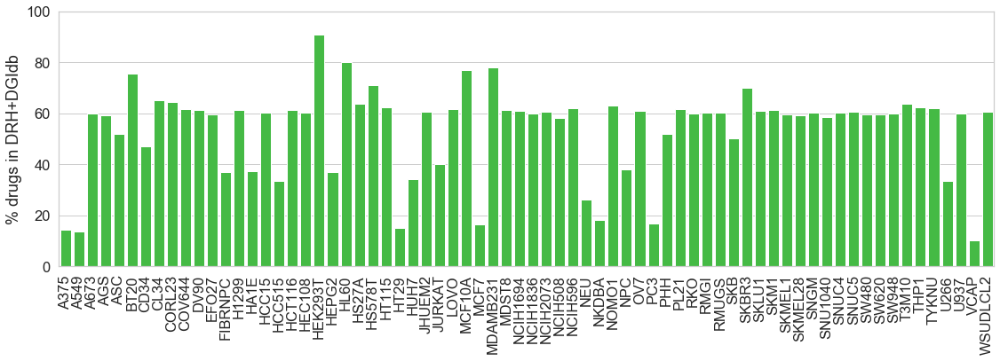

In [62]:
fig = plt.figure()
fig.set_size_inches(16, 6)
sns.set(font_scale=1.5)
with sns.axes_style('whitegrid'):
    sns.barplot(x=DRH_DGIdb_coverage_df.index, y='DRH+DGIdb coverage (QUIZC)', data=DRH_DGIdb_coverage_df, orient='v', color='limegreen')
    plt.ylim(0.0, 100.0)
    plt.xticks(rotation=90)
    plt.xlabel('')
    plt.ylabel('% drugs in DRH+DGIdb')
    plt.tight_layout()
    plt.savefig(proj_output_path + 'DRH_DGIdb_coverage_QUIZC.pdf', format='pdf', bbox_inches='tight')
    plt.show()

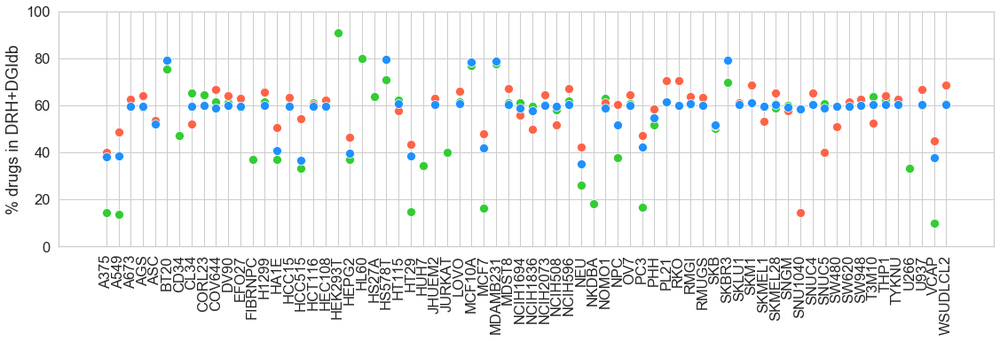

In [63]:
fig = plt.figure()
fig.set_size_inches(16, 6)
sns.set(font_scale=1.5)
with sns.axes_style('whitegrid'):
    sns.scatterplot(x=DRH_DGIdb_coverage_df.index, y='DRH+DGIdb coverage (QUIZC)', data=DRH_DGIdb_coverage_df, color='limegreen', s=100)
    sns.scatterplot(x=DRH_DGIdb_coverage_df.index, y='DRH+DGIdb coverage (MODZ)', data=DRH_DGIdb_coverage_df, color='tomato', s=100)
    sns.scatterplot(x=DRH_DGIdb_coverage_df.index, y='DRH+DGIdb coverage (CD)', data=DRH_DGIdb_coverage_df,  color='dodgerblue', s=100)
    plt.xticks(rotation=90)
    plt.ylim(0.0, 100.0)
    plt.tight_layout()
    plt.ylabel('% drugs in DRH+DGIdb')
    plt.xlabel('')
    plt.savefig(proj_output_path + 'DRH_DGIdb_coverage_all.pdf', format='pdf')
    plt.show()

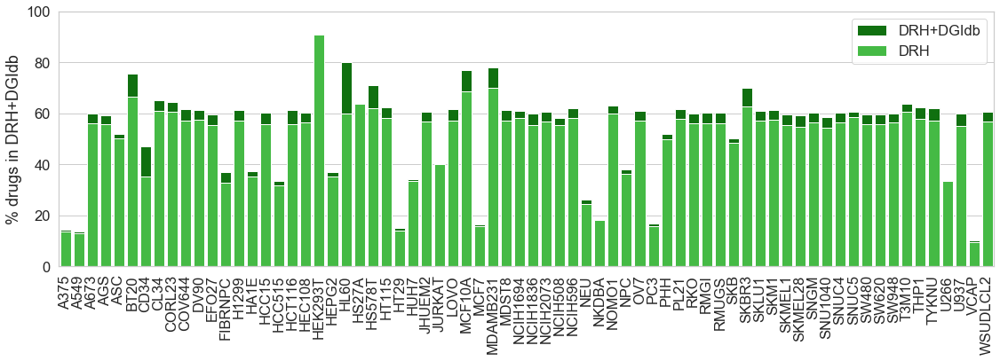

In [64]:
fig = plt.figure()
fig.set_size_inches(16, 6)
sns.set(font_scale=1.5)
with sns.axes_style('whitegrid'):
    sns.barplot(x=DRH_DGIdb_coverage_df.index, y='DRH+DGIdb coverage (QUIZC)', data=DRH_DGIdb_coverage_df, orient='v', color='green', 
                label='DRH+DGIdb')
    sns.barplot(x=DRH_coverage_df.index, y='DRH coverage (QUIZC)', data=DRH_coverage_df, orient='v', color='limegreen', label='DRH')
    plt.ylim(0.0, 100.0)
    plt.xticks(rotation=90)
    plt.xlabel('')
    plt.ylabel('% drugs in DRH+DGIdb')
    plt.legend()
    plt.tight_layout()
    plt.savefig(proj_output_path + 'DRH_DGIdb_coverage_QUIZC_ver2.pdf', format='pdf', bbox_inches='tight')
    plt.show()

## Enrichment of drugs with known MoA in drug-perturbagen networks (Fig. 4A, Supp. Figs. 11B-C)

In [120]:
QUIZC_DRH_enrichment_FE_df = pd.DataFrame(index=QUIZC_allcells['Cell_type'], columns=['OR', 'pval'])
QUIZC_DRH_enrichment_contingency_df = pd.DataFrame(index=QUIZC_allcells['Cell_type'], columns=['A', 'B', 'C', 'D'])
for c in QUIZC_allcells['Cell_type']:
    A = len(set(QUIZC_edgelist_df_dict[c]['Drug']) & set(DRH_drugs['pert_iname'])) 
    B = len(set(QUIZC_edgelist_df_dict[c]['Drug']) - set(DRH_drugs['pert_iname'])) 
    C = len(set(DRH_drugs['pert_iname']) - set(QUIZC_edgelist_df_dict[c]['Drug']))
    D = len(set(QUIZC_alldrugs['Pert_iname']) - (set(QUIZC_edgelist_df_dict[c]['Drug']) | set(DRH_drugs['pert_iname'])))
    QUIZC_DRH_enrichment_FE_df.at[c, 'OR'] = st.fisher_exact([[A, B], [C, D]])[0]
    QUIZC_DRH_enrichment_FE_df.at[c, 'pval'] = st.fisher_exact([[A, B], [C, D]])[1]
    QUIZC_DRH_enrichment_contingency_df.at[c, 'A'] = A
    QUIZC_DRH_enrichment_contingency_df.at[c, 'B'] = B
    QUIZC_DRH_enrichment_contingency_df.at[c, 'C'] = C
    QUIZC_DRH_enrichment_contingency_df.at[c, 'D'] = D

QUIZC_DRH_enrichment_contingency_df.to_csv(proj_intermediary_outputs_path + 'DRH_enrichment_contingency_df_QUIZC.csv')

MODZ_DRH_enrichment_FE_df = pd.DataFrame(index=MODZ_allcells['Cell_type'], columns=['OR', 'pval'])
MODZ_DRH_enrichment_contingency_df = pd.DataFrame(index=MODZ_allcells['Cell_type'], columns=['A', 'B', 'C', 'D'])
for c in MODZ_allcells['Cell_type']:
    A = len(set(MODZ_edgelist_df_dict[c]['Drug']) & set(DRH_drugs['pert_iname'])) 
    B = len(set(MODZ_edgelist_df_dict[c]['Drug']) - set(DRH_drugs['pert_iname'])) 
    C = len(set(DRH_drugs['pert_iname']) - set(MODZ_edgelist_df_dict[c]['Drug']))
    D = len(set(MODZ_alldrugs['Pert_iname']) - (set(MODZ_edgelist_df_dict[c]['Drug']) | set(DRH_drugs['pert_iname'])))
    MODZ_DRH_enrichment_FE_df.at[c, 'OR'] = st.fisher_exact([[A, B], [C, D]])[0]
    MODZ_DRH_enrichment_FE_df.at[c, 'pval'] = st.fisher_exact([[A, B], [C, D]])[1]
    MODZ_DRH_enrichment_contingency_df.at[c, 'A'] = A
    MODZ_DRH_enrichment_contingency_df.at[c, 'B'] = B
    MODZ_DRH_enrichment_contingency_df.at[c, 'C'] = C
    MODZ_DRH_enrichment_contingency_df.at[c, 'D'] = D

MODZ_DRH_enrichment_contingency_df.to_csv(proj_intermediary_outputs_path + 'DRH_enrichment_contingency_df_MODZ.csv')

CD_DRH_enrichment_FE_df = pd.DataFrame(index=CD_allcells['Cell_type'], columns=['OR', 'pval'])
CD_DRH_enrichment_contingency_df = pd.DataFrame(index=CD_allcells['Cell_type'], columns=['A', 'B', 'C', 'D'])
for c in CD_allcells['Cell_type']:
    A = len(set(CD_edgelist_df_dict[c]['Drug']) & set(DRH_drugs['pert_iname'])) 
    B = len(set(CD_edgelist_df_dict[c]['Drug']) - set(DRH_drugs['pert_iname'])) 
    C = len(set(DRH_drugs['pert_iname']) - set(CD_edgelist_df_dict[c]['Drug']))
    D = len(set(CD_alldrugs['Pert_iname']) - (set(CD_edgelist_df_dict[c]['Drug']) | set(DRH_drugs['pert_iname'])))
    CD_DRH_enrichment_FE_df.at[c, 'OR'] = st.fisher_exact([[A, B], [C, D]])[0]
    CD_DRH_enrichment_FE_df.at[c, 'pval'] = st.fisher_exact([[A, B], [C, D]])[1]
    CD_DRH_enrichment_contingency_df.at[c, 'A'] = A
    CD_DRH_enrichment_contingency_df.at[c, 'B'] = B
    CD_DRH_enrichment_contingency_df.at[c, 'C'] = C
    CD_DRH_enrichment_contingency_df.at[c, 'D'] = D

CD_DRH_enrichment_contingency_df.to_csv(proj_intermediary_outputs_path + 'DRH_enrichment_contingency_df_CD.csv')

In [122]:
DRH_QUIZC_fisher_pvals = pd.read_csv(proj_intermediary_outputs_path + 'DRH_enrichment_pvals_QUIZC.csv', index_col=0)
DRH_MODZ_fisher_pvals = pd.read_csv(proj_intermediary_outputs_path + 'DRH_enrichment_pvals_MODZ.csv', index_col=0)
DRH_CD_fisher_pvals = pd.read_csv(proj_intermediary_outputs_path + 'DRH_enrichment_pvals_CD.csv', index_col=0)

DRH_QUIZC_fisher_pvals = DRH_QUIZC_fisher_pvals.rename(columns={'pval': 'pval_QUIZC', 'logpval': 'logpval_QUIZC', 
                                                      'OR': 'OR_QUIZC', 'OR_CI1': 'OR_CI1_QUIZC', 'OR_CI2': 'OR_CI2_QUIZC'})
DRH_MODZ_fisher_pvals = DRH_MODZ_fisher_pvals.rename(columns={'pval': 'pval_MODZ', 'logpval': 'logpval_MODZ', 
                                                      'OR': 'OR_MODZ', 'OR_CI1': 'OR_CI1_MODZ', 'OR_CI2': 'OR_CI2_MODZ'})
DRH_CD_fisher_pvals = DRH_CD_fisher_pvals.rename(columns={'pval': 'pval_CD', 'logpval': 'logpval_CD', 
                                                      'OR': 'OR_CD', 'OR_CI1': 'OR_CI1_CD', 'OR_CI2': 'OR_CI2_CD'})



DRH_fisher_pvals_merged = pd.merge(pd.merge(DRH_QUIZC_fisher_pvals, DRH_MODZ_fisher_pvals, left_index=True, right_index=True, how='left'), 
                               DRH_CD_fisher_pvals, left_index=True, right_index=True, how='left')

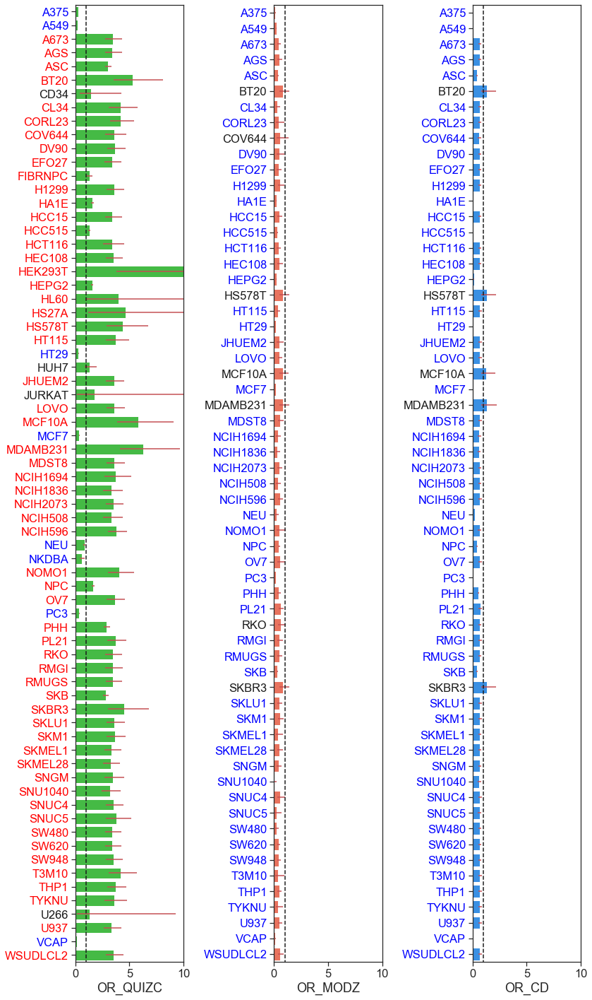

In [123]:
fig = plt.figure()
fig.set_size_inches(12, 20)
sns.set(font_scale=1.5)
with sns.axes_style("ticks"):
    plt.subplot(1, 3, 1)
    xerr = [DRH_QUIZC_fisher_pvals['OR_QUIZC'] - DRH_QUIZC_fisher_pvals['OR_CI1_QUIZC'], 
            DRH_QUIZC_fisher_pvals['OR_CI2_QUIZC'] - DRH_QUIZC_fisher_pvals['OR_QUIZC']]
    ax = sns.barplot(y=DRH_QUIZC_fisher_pvals.index, x='OR_QUIZC', data=DRH_QUIZC_fisher_pvals, orient='h', color='limegreen')
    plt.errorbar(x=DRH_QUIZC_fisher_pvals['OR_QUIZC'], y=np.arange(len(QUIZC_allcells)), xerr=xerr, fmt='none', c= 'r')
    colors = []
    for p, o in DRH_QUIZC_fisher_pvals[['pval_QUIZC', 'OR_QUIZC']].values:
        if (p<=0.05) & (o>=1.0):
            colors.append('red')
        elif (p<=0.05) & (o<=1.0):
            colors.append('blue')
        else:
            colors.append('k')    
    for color, tick in zip(colors, ax.yaxis.get_major_ticks()):
        tick.label1.set_color(color)
    plt.plot([1, 1], [-0.5, 70.5], 'k--')
    plt.xlim(0, 10)
    plt.ylim(len(QUIZC_allcells)-0.5, -0.5)
    
    plt.subplot(1, 3, 2)
    xerr = [DRH_MODZ_fisher_pvals['OR_MODZ'] - DRH_MODZ_fisher_pvals['OR_CI1_MODZ'], 
            DRH_MODZ_fisher_pvals['OR_CI2_MODZ'] - DRH_MODZ_fisher_pvals['OR_MODZ']]
    ax = sns.barplot(y=DRH_MODZ_fisher_pvals.index, x='OR_MODZ', data=DRH_MODZ_fisher_pvals, orient='h', color='tomato')
    plt.errorbar(x=DRH_MODZ_fisher_pvals['OR_MODZ'], y=np.arange(len(MODZ_allcells)), xerr=xerr, fmt='none', c= 'r')
    colors = []
    for p, o in DRH_MODZ_fisher_pvals[['pval_MODZ', 'OR_MODZ']].values:
        if (p<=0.05) & (o>=1.0):
            colors.append('red')
        elif (p<=0.05) & (o<=1.0):
            colors.append('blue')
        else:
            colors.append('k')    
    for color, tick in zip(colors, ax.yaxis.get_major_ticks()):
        tick.label1.set_color(color)
    plt.plot([1, 1], [-0.5, 70.5], 'k--')
    plt.xlim(0, 10)
    plt.ylim(len(MODZ_allcells)-0.5, -0.5)
    
    plt.subplot(1, 3, 3)
    xerr = [DRH_CD_fisher_pvals['OR_CD'] - DRH_CD_fisher_pvals['OR_CI1_CD'], 
            DRH_CD_fisher_pvals['OR_CI2_CD'] - DRH_CD_fisher_pvals['OR_CD']]
    ax = sns.barplot(y=DRH_CD_fisher_pvals.index, x='OR_CD', data=DRH_CD_fisher_pvals, orient='h', color='dodgerblue')
    plt.errorbar(x=DRH_CD_fisher_pvals['OR_CD'], y=np.arange(len(CD_allcells)), xerr=xerr, fmt='none', c= 'r')
    colors = []
    for p, o in DRH_CD_fisher_pvals[['pval_CD', 'OR_CD']].values:
        if (p<=0.05) & (o>=1.0):
            colors.append('red')
        elif (p<=0.05) & (o<=1.0):
            colors.append('blue')
        else:
            colors.append('k')    
    for color, tick in zip(colors, ax.yaxis.get_major_ticks()):
        tick.label1.set_color(color)
    plt.plot([1, 1], [-0.5, 70.5], 'k--')
    plt.xlim(0, 10)
    plt.ylim(len(CD_allcells)-0.5, -0.5)  

    plt.tight_layout()
    
    plt.savefig(proj_output_path + 'DRH_MoA_coverage_enrichment.pdf', format='pdf', bbox_inches='tight')

## MoA and clinical phase breakdown of each cell type (Figure 4B, Supp. Figs. 12A-B)

In [65]:
len(DRH_drugs['clinical_phase'].unique()), len(DRH_drugs['moa'].unique())

(8, 1355)

In [66]:
# make the dataframe indices in custom order so it goes from Preclinical to Launched instead of just alphabetically
QUIZC_clinical_phase_df = pd.DataFrame(0.0, index=['Preclinical', 'Phase 1', 'Phase 1/Phase 2', 'Phase 2', 'Phase 2/Phase 3', 
                                             'Phase 3',  'Launched', 'Withdrawn'], columns= QUIZC_allcells['Cell_type'])
for c in QUIZC_allcells['Cell_type']:

    a = pd.merge(QUIZC_edgelist_df_dict[c]['Drug'], DRH_drugs, 
                 left_on='Drug', right_on='pert_iname').drop_duplicates('Drug').groupby('clinical_phase').size().sort_values(ascending=False)

    a_perc = a / a.sum() * 100.0
    
    for i in np.arange(len(a_perc)):
        QUIZC_clinical_phase_df.at[a_perc.index[i], c] = a_perc.values[i]
        

        
MODZ_clinical_phase_df = pd.DataFrame(0.0, index=['Preclinical', 'Phase 1', 'Phase 1/Phase 2', 'Phase 2', 'Phase 2/Phase 3', 
                                             'Phase 3',  'Launched', 'Withdrawn'], columns= QUIZC_allcells['Cell_type'])
for c in MODZ_allcells['Cell_type']:

    a = pd.merge(MODZ_edgelist_df_dict[c]['Drug'], DRH_drugs, 
                 left_on='Drug', right_on='pert_iname').drop_duplicates('pert_iname').groupby('clinical_phase').size().sort_values(ascending=False)

    a_perc = a / a.sum() * 100.0
    
    for i in np.arange(len(a_perc)):
        MODZ_clinical_phase_df.at[a_perc.index[i], c] = a_perc.values[i]
        

CD_clinical_phase_df = pd.DataFrame(0.0, index=['Preclinical', 'Phase 1', 'Phase 1/Phase 2', 'Phase 2', 'Phase 2/Phase 3', 
                                             'Phase 3',  'Launched', 'Withdrawn'], columns= QUIZC_allcells['Cell_type'])
for c in CD_allcells['Cell_type']:

    a = pd.merge(CD_edgelist_df_dict[c]['Drug'], DRH_drugs, 
                 left_on='Drug', right_on='pert_iname').drop_duplicates('pert_iname').groupby('clinical_phase').size().sort_values(ascending=False)

    a_perc = a / a.sum() * 100.0
    
    for i in np.arange(len(a_perc)):
        CD_clinical_phase_df.at[a_perc.index[i], c] = a_perc.values[i]

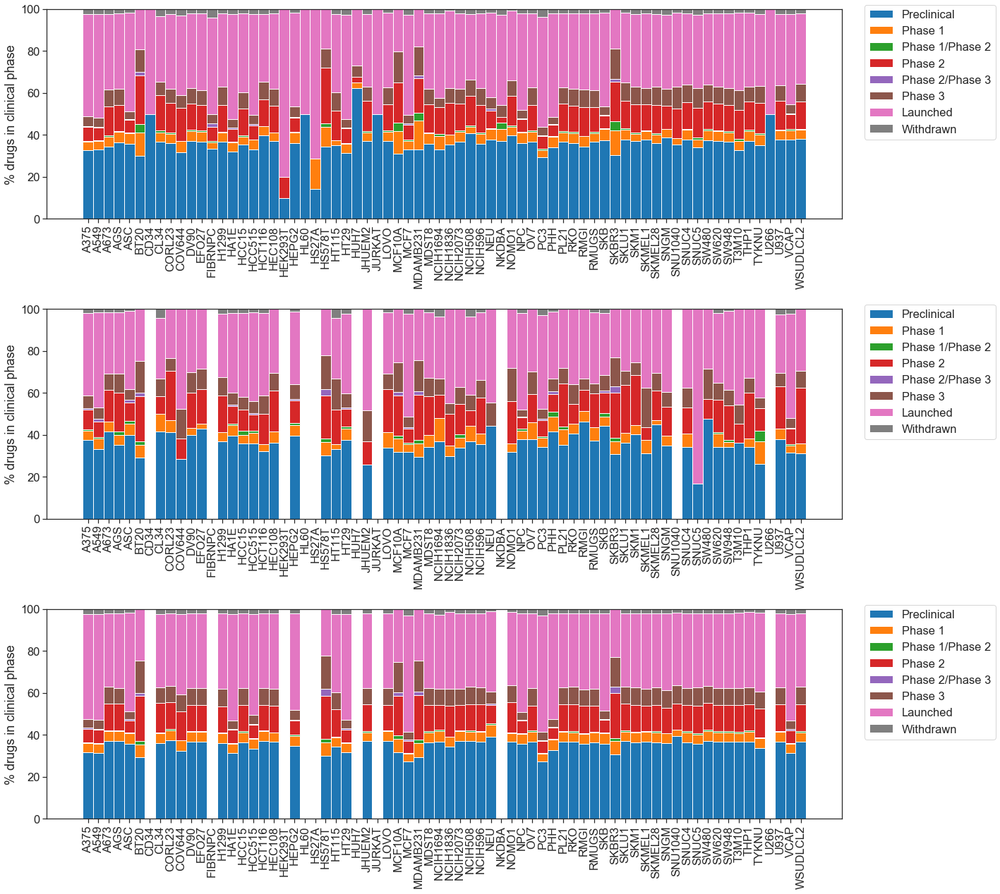

In [67]:
width = 1.0 
cm = plt.get_cmap('tab10')

fig = plt.figure()
fig.set_size_inches(20, 18)
sns.set(font_scale=1.5)
with sns.axes_style("ticks"):
    plt.subplot(3, 1, 1)
    p1 = plt.bar(QUIZC_allcells['Cell_type'], QUIZC_clinical_phase_df.iloc[0], width, label=QUIZC_clinical_phase_df.index[0], color=cm(0))
    for i in np.arange(1, len(QUIZC_clinical_phase_df.index.sort_values())):
        p2 = plt.bar(QUIZC_allcells['Cell_type'], QUIZC_clinical_phase_df.iloc[i], width, bottom=QUIZC_clinical_phase_df.cumsum().iloc[i-1], 
                     label=QUIZC_clinical_phase_df.index[i], color=cm(i))
    plt.xticks(rotation=90)
    plt.ylabel('% drugs in clinical phase')
    plt.legend(bbox_to_anchor=[1.20, 0.70], loc='right')
    
    plt.subplot(3, 1, 2)
    p1 = plt.bar(QUIZC_allcells['Cell_type'], MODZ_clinical_phase_df.iloc[0], width, label=MODZ_clinical_phase_df.index[0], color=cm(0))
    for i in np.arange(1, len(MODZ_clinical_phase_df.index.sort_values())):
        p2 = plt.bar(QUIZC_allcells['Cell_type'], MODZ_clinical_phase_df.iloc[i], width, bottom=MODZ_clinical_phase_df.cumsum().iloc[i-1], 
                     label=MODZ_clinical_phase_df.index[i], color=cm(i))
    plt.xticks(rotation=90)
    plt.ylabel('% drugs in clinical phase')
    plt.legend(bbox_to_anchor=[1.20, 0.70], loc='right')
    
    plt.subplot(3, 1, 3)
    p1 = plt.bar(QUIZC_allcells['Cell_type'], CD_clinical_phase_df.iloc[0], width, label=CD_clinical_phase_df.index[0], color=cm(0))
    for i in np.arange(1, len(CD_clinical_phase_df.index.sort_values())):
        p2 = plt.bar(QUIZC_allcells['Cell_type'], CD_clinical_phase_df.iloc[i], width, bottom=CD_clinical_phase_df.cumsum().iloc[i-1], 
                     label=CD_clinical_phase_df.index[i], color=cm(i))
    plt.xticks(rotation=90)
    plt.ylabel('% drugs in clinical phase')
    plt.legend(bbox_to_anchor=[1.20, 0.70], loc='right')    
    
    plt.tight_layout()
    plt.savefig(proj_output_path + 'clinical_phase_breakdown_all.pdf', format='pdf')
    plt.show()

## Enrichment of known drug-target edges in QUIZC/MODZ/CD (Figure 4D, Supp. Figs. 13B-E)

In [77]:
# DGIdb filtering -- remove nans, drop duplicates
DGIdb_edges_df = DGIdb_interactions_iname_df[['pert_iname', 'gene_name']]
DGIdb_edges_df = DGIdb_edges_df[~pd.isnull(DGIdb_edges_df['gene_name'])]
DGIdb_edges_df = DGIdb_edges_df.drop_duplicates()
DGIdb_edges_df = DGIdb_edges_df.reset_index(drop=True)

# DRH filtering -- remove nans, rename target column, reset indices, expand target genes into separate rows, drop duplicates
#print(len(DRH_edges_df))
DRH_edges_df = DRH_drugs_samples_df[~pd.isnull(DRH_drugs_samples_df['target'])][['pert_iname', 'target']]
print(len(DRH_edges_df))
DRH_edges_df = DRH_edges_df.rename(columns={'target': 'gene_name'})
DRH_edges_df = pd.DataFrame([x.split('|') for x in DRH_edges_df['gene_name'].tolist()], index=DRH_edges_df['pert_iname'])\
        .stack().reset_index(level=1, drop=True).reset_index(name='gene_name')[['pert_iname', 'gene_name',]]
DRH_edges_df = DRH_edges_df.drop_duplicates()
DRH_edges_df = DRH_edges_df.reset_index(drop=True)

# total numnber of nodes and edges in DGIdb and DRH
print(len(set(DGIdb_edges_df['pert_iname'])), len(set(DRH_edges_df['pert_iname'])))
print(len(DGIdb_edges_df), len(DRH_edges_df))

# merge the drug-target pairs from DGIdb and DRH
DRH_DGIdb_edges_df = pd.merge(DRH_edges_df, DGIdb_edges_df, on=['pert_iname', 'gene_name'], how='outer')

7655
837 4484
5353 13097


In [78]:
f = open(proj_intermediary_outputs_path + 'contingency_tables_QUIZC.csv', 'w')
f.write('Cell_type,A,B,C,D\n')
for c in QUIZC_allcells['Cell_type']:
    cell_edges_df = pd.DataFrame(list(QUIZC_diG_dict[c].edges()), columns=['pert_iname', 'gene_name'])

    merged_df = pd.merge(cell_edges_df, DRH_DGIdb_edges_df, on=['pert_iname', 'gene_name'], how='outer', indicator=True)

    A = len(merged_df[merged_df['_merge'] == 'both'])
    B = len(merged_df[merged_df['_merge'] == 'left_only'])
    C = len(merged_df[merged_df['_merge'] == 'right_only'])
    D = (len(set(DRH_DGIdb_edges_df['pert_iname']) | set(cell_edges_df['pert_iname'])) * 
         len(set(DRH_DGIdb_edges_df['gene_name']) | set(cell_edges_df['gene_name']))) - (A + B + C)

    f.write('%s,%s,%s,%s,%s\n' % (c, A, B, C, D))
f.close()


f = open(proj_intermediary_outputs_path + 'contingency_tables_MODZ.csv', 'w')
f.write('Cell_type,A,B,C,D\n')
for c in MODZ_allcells['Cell_type']:
    cell_edges_df = pd.DataFrame(list(MODZ_diG_dict[c].edges()), columns=['pert_iname', 'gene_name'])

    merged_df = pd.merge(cell_edges_df, DRH_DGIdb_edges_df, on=['pert_iname', 'gene_name'], how='outer', indicator=True)

    A = len(merged_df[merged_df['_merge'] == 'both'])
    B = len(merged_df[merged_df['_merge'] == 'left_only'])
    C = len(merged_df[merged_df['_merge'] == 'right_only'])
    D = (len(set(DRH_DGIdb_edges_df['pert_iname']) | set(cell_edges_df['pert_iname'])) * 
         len(set(DRH_DGIdb_edges_df['gene_name']) | set(cell_edges_df['gene_name']))) - (A + B + C)

    f.write('%s,%s,%s,%s,%s\n' % (c, A, B, C, D))
f.close()


f = open(proj_intermediary_outputs_path + 'contingency_tables_CD.csv', 'w')
f.write('Cell_type,A,B,C,D\n')
for c in CD_allcells['Cell_type']:
    cell_edges_df = pd.DataFrame(list(CD_diG_dict[c].edges()), columns=['pert_iname', 'gene_name'])

    merged_df = pd.merge(cell_edges_df, DRH_DGIdb_edges_df, on=['pert_iname', 'gene_name'], how='outer', indicator=True)

    A = len(merged_df[merged_df['_merge'] == 'both'])
    B = len(merged_df[merged_df['_merge'] == 'left_only'])
    C = len(merged_df[merged_df['_merge'] == 'right_only'])
    D = (len(set(DRH_DGIdb_edges_df['pert_iname']) | set(cell_edges_df['pert_iname'])) * 
         len(set(DRH_DGIdb_edges_df['gene_name']) | set(cell_edges_df['gene_name']))) - (A + B + C)

    f.write('%s,%s,%s,%s,%s\n' % (c, A, B, C, D))
f.close()

# --> Process output in R ("overlap_CIs.R") to get the confidence intervals

In [80]:
QUIZC_fisher_pvals = pd.read_csv(proj_intermediary_outputs_path + 'edge_overlap_pvals_QUIZC.csv', index_col=0)
MODZ_fisher_pvals = pd.read_csv(proj_intermediary_outputs_path + 'edge_overlap_pvals_MODZ.csv', index_col=0)
CD_fisher_pvals = pd.read_csv(proj_intermediary_outputs_path + 'edge_overlap_pvals_CD.csv', index_col=0)

QUIZC_fisher_pvals = QUIZC_fisher_pvals.rename(columns={'pval': 'pval_QUIZC', 'logpval': 'logpval_QUIZC', 
                                                      'OR': 'OR_QUIZC', 'OR_CI1': 'OR_CI1_QUIZC', 'OR_CI2': 'OR_CI2_QUIZC'})
MODZ_fisher_pvals = MODZ_fisher_pvals.rename(columns={'pval': 'pval_MODZ', 'logpval': 'logpval_MODZ', 
                                                      'OR': 'OR_MODZ', 'OR_CI1': 'OR_CI1_MODZ', 'OR_CI2': 'OR_CI2_MODZ'})
CD_fisher_pvals = CD_fisher_pvals.rename(columns={'pval': 'pval_CD', 'logpval': 'logpval_CD', 
                                                      'OR': 'OR_CD', 'OR_CI1': 'OR_CI1_CD', 'OR_CI2': 'OR_CI2_CD'})

fisher_pvals_merged = pd.merge(pd.merge(QUIZC_fisher_pvals, MODZ_fisher_pvals, left_index=True, right_index=True, how='left'), 
                               CD_fisher_pvals, left_index=True, right_index=True, how='left')

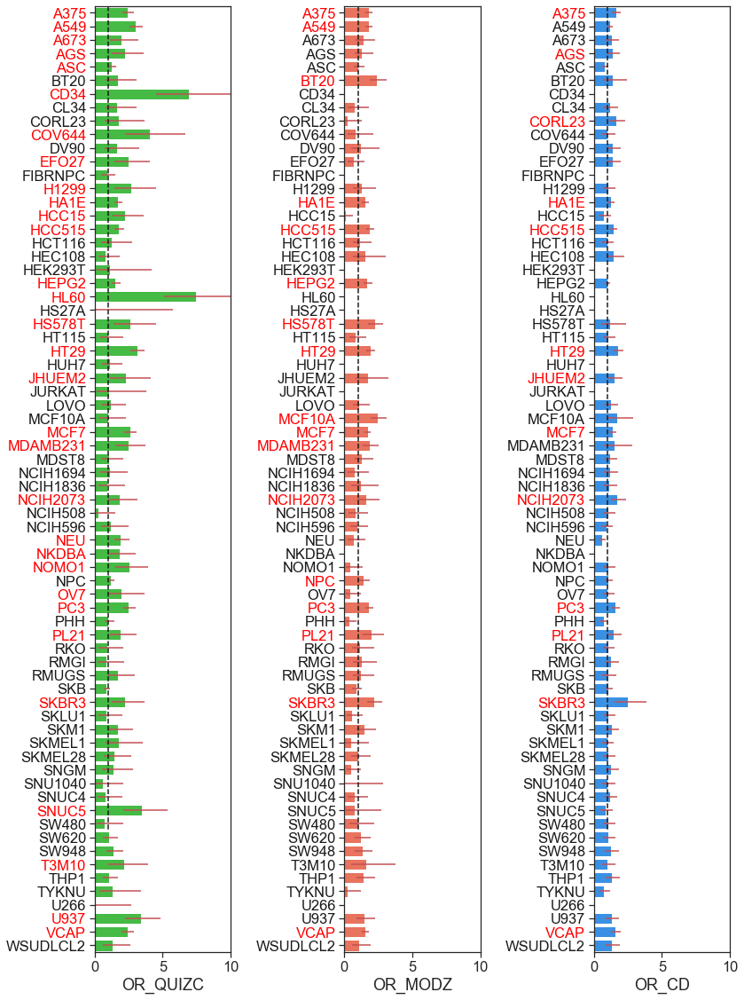

In [81]:
fig = plt.figure()
fig.set_size_inches(12, 16)
sns.set(font_scale=1.5)
with sns.axes_style("ticks"):
    plt.subplot(1, 3, 1)
    xerr = [fisher_pvals_merged['OR_QUIZC'] - fisher_pvals_merged['OR_CI1_QUIZC'], fisher_pvals_merged['OR_CI2_QUIZC'] - fisher_pvals_merged['OR_QUIZC']]
    ax = sns.barplot(y=fisher_pvals_merged.index, x='OR_QUIZC', data=fisher_pvals_merged, orient='h', color='limegreen')
    plt.errorbar(x=fisher_pvals_merged['OR_QUIZC'], y=np.arange(len(QUIZC_allcells)), xerr=xerr, fmt='none', c= 'r')
    colors = ['red' if (p<=0.05) & (o>=1.0) else 'k' for p, o in fisher_pvals_merged[['pval_QUIZC', 'OR_QUIZC']].values]
    for color, tick in zip(colors, ax.yaxis.get_major_ticks()):
        tick.label1.set_color(color)
    plt.plot([1, 1], [-0.5, 60.5], 'k--')
    plt.xlim(0, 10)
    plt.ylim(len(QUIZC_allcells)-0.5, -0.5)
    
    plt.subplot(1, 3, 2)
    xerr = [fisher_pvals_merged['OR_MODZ'] - fisher_pvals_merged['OR_CI1_MODZ'], fisher_pvals_merged['OR_CI2_MODZ'] - fisher_pvals_merged['OR_MODZ']]
    ax = sns.barplot(y=fisher_pvals_merged.index, x='OR_MODZ', data=fisher_pvals_merged, orient='h', color='tomato')
    plt.errorbar(x=fisher_pvals_merged['OR_MODZ'], y=np.arange(len(QUIZC_allcells)), xerr=xerr, fmt='none', c= 'r')
    colors = ['red' if (p<=0.05) & (o>=1.0) else 'k' for p, o in fisher_pvals_merged[['pval_MODZ', 'OR_MODZ']].values]
    for color, tick in zip(colors, ax.yaxis.get_major_ticks()):
        tick.label1.set_color(color)
    plt.plot([1, 1], [-0.5, 60.5], 'k--')
    plt.xlim(0, 10)
    plt.ylim(len(QUIZC_allcells)-0.5, -0.5)
    
    plt.subplot(1, 3, 3)
    xerr = [fisher_pvals_merged['OR_CD'] - fisher_pvals_merged['OR_CI1_CD'], fisher_pvals_merged['OR_CI2_CD'] - fisher_pvals_merged['OR_CD']]
    ax = sns.barplot(y=fisher_pvals_merged.index, x='OR_CD', data=fisher_pvals_merged, orient='h', color='dodgerblue')
    plt.errorbar(x=fisher_pvals_merged['OR_CD'], y=np.arange(len(QUIZC_allcells)), xerr=xerr, fmt='none', c= 'r')
    colors = ['red' if (p<=0.05) & (o>=1.0) else 'k' for p, o in fisher_pvals_merged[['pval_CD', 'OR_CD']].values]
    for color, tick in zip(colors, ax.yaxis.get_major_ticks()):
        tick.label1.set_color(color)
    plt.plot([1, 1], [-0.5, 60.5], 'k--')
    plt.xlim(0, 10)
    plt.ylim(len(QUIZC_allcells)-0.5, -0.5)
    
    plt.tight_layout()
    
    plt.savefig(proj_output_path + 'known_DT_overlap_Fisher_CI_all.pdf', format='pdf')
    plt.show()

In [82]:
31/70, 17/70, 13/70

(0.44285714285714284, 0.24285714285714285, 0.18571428571428572)

/Users/ardahalu/anaconda3/envs/py3_main/lib/python3.8/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/ardahalu/anaconda3/envs/py3_main/lib/python3.8/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


0.7333333333333333
0.7213114754098361


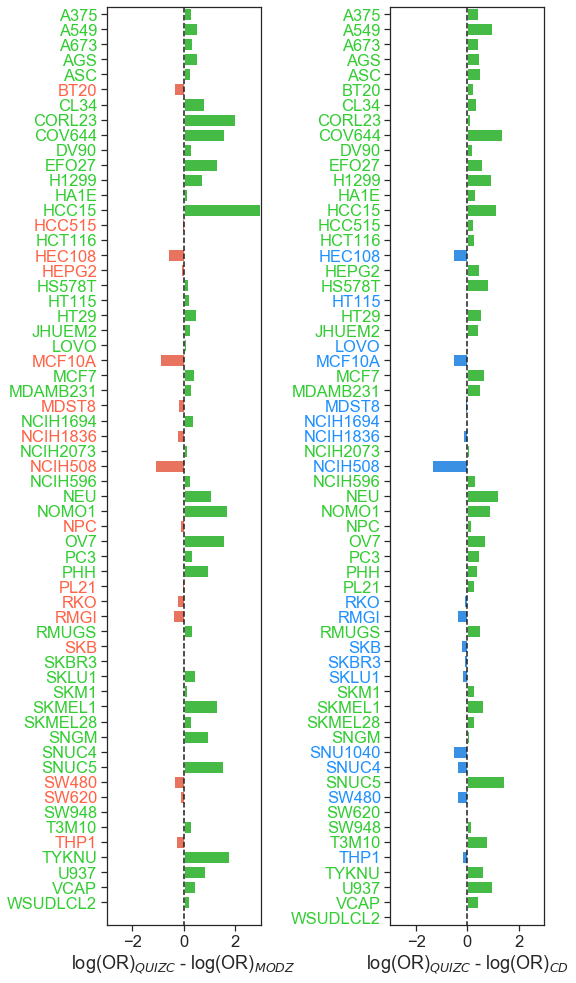

In [83]:
fig = plt.figure()
fig.set_size_inches(8, 14)
sns.set(font_scale=1.5)
with sns.axes_style("ticks"):
    plt.subplot(1, 2, 1)
    logOR_diff_df = pd.DataFrame(np.log(fisher_pvals_merged['OR_QUIZC']) - np.log(fisher_pvals_merged['OR_MODZ'])).replace([np.inf, -np.inf], np.nan).dropna()
    colors = ['limegreen' if o>=0 else 'tomato' for o in logOR_diff_df[0].values]
    ax = sns.barplot(y=logOR_diff_df.index, x=0, data=logOR_diff_df, orient='h', palette=colors)
    for color, tick in zip(colors, ax.yaxis.get_major_ticks()):
        tick.label1.set_color(color)
    plt.plot([0, 0], [-0.5, 60.5], 'k--')
    plt.xlim(-3, 3)
    plt.ylim(60.5, -0.5)
    plt.xlabel(r'log(OR)$_{QUIZC}$ - log(OR)$_{MODZ}$')    
    print(len(logOR_diff_df[logOR_diff_df[0] > 0]) / len(logOR_diff_df))
    
    plt.subplot(1, 2, 2)
    logOR_diff_df = pd.DataFrame(np.log(fisher_pvals_merged['OR_QUIZC']) - np.log(fisher_pvals_merged['OR_CD'])).replace([np.inf, -np.inf], np.nan).dropna()
    colors = ['limegreen' if o>=0 else 'dodgerblue' for o in logOR_diff_df[0].values]
    ax = sns.barplot(y=logOR_diff_df.index, x=0, data=logOR_diff_df, orient='h', palette=colors)
    for color, tick in zip(colors, ax.yaxis.get_major_ticks()):
        tick.label1.set_color(color)
    plt.plot([0, 0], [-0.5, 60.5], 'k--')
    plt.xlim(-3, 3)
    plt.ylim(60.5, -0.5)
    plt.xlabel(r'log(OR)$_{QUIZC}$ - log(OR)$_{CD}$')
    print(len(logOR_diff_df[logOR_diff_df[0] > 0]) / len(logOR_diff_df))
    
    plt.tight_layout()
    plt.savefig(proj_output_path + 'known_DT_overlap_Fisher_logOR_diff.pdf', format='pdf')
    plt.show()

## Calculate Selectivity and Tool scores

### Map QUIZC drugs to CIDs
**QUIZC-independent files used:** <br>
(1) "L1000_inchi_key2cid.txt" Contains all the drugs with InChI keys in the master L1000 perturbation file ("GSE92742_Broad_LINCS_pert_info.txt"). The InChI keys were uploaded to the PubChem Identifier Exchange and this is the file containing the InChI key to PubChem CID mapping. This file contains all the drugs in L1000 with InChIs, therefore it is not QUIZC network dependent but encompasses all drugs in QUIZC networks. <br>
(2) "L1000_SMILES2cid.txt" Same as above but for SMILES keys instead of InChI keys. <br>
**QUIZC-dependent files generated:** <br>
(1) "QUIZC_drug_CIDs_inchi_smiles.csv" This is the file that maps QUIZC drugs' pert_inames to PubChem CIDs through both InChI and SMILES keys. Since in the code below "allgenes" is used, this output file will be generated for whichever QUIZC network version is used as input. <br>
(2) "QUIZC_cids_inchi_smiles_allcids.csv" This is the file that contains all the QUIZC PubChem CIDs to be fed into ChemMineR to calculate Tanimoto Similarity scores. Since it uses "QUIZC_drug_CIDs_inchi_smiles.csv", it, too, is dependent on the specific set of QUIZC networks used as input. <br>

In [84]:
print(len(set(MODZ_alldrugs['Pert_iname']) - set(QUIZC_alldrugs['Pert_iname'])),
      len(set(CD_alldrugs['Pert_iname']) - set(QUIZC_alldrugs['Pert_iname'])),
      len(set(QUIZC_alldrugs['Pert_iname']) - set(MODZ_alldrugs['Pert_iname'])),
     len(set(QUIZC_alldrugs['Pert_iname']) - set(CD_alldrugs['Pert_iname'])))

2 15 14894 13141


In [85]:
### conversion from pert_iname to CID through InChI and SMILES keys (we got those from the PubChem Identifier Exchange)
# InChI to CID
inchi_key2cid = pd.read_csv(proj_intermediary_outputs_path + 'L1000_inchi_key2cid.txt', sep='\t')

QUIZC_inchi_keys = pd.merge(QUIZC_alldrugs, L1000_pert_info, how='left', left_on='Pert_iname', right_on='pert_iname')[['Pert_iname', 'inchi_key']]
QUIZC_inchi_keys = QUIZC_inchi_keys[QUIZC_inchi_keys['inchi_key'] != '-666']
QUIZC_inchi_keys = QUIZC_inchi_keys.drop_duplicates()

QUIZC_cids_inchi = pd.merge(QUIZC_inchi_keys, inchi_key2cid, how='left', left_on='inchi_key', right_on='inchi_key')[['Pert_iname', 'pubchem_cid']]
QUIZC_cids_inchi = QUIZC_cids_inchi[~pd.isnull(QUIZC_cids_inchi['pubchem_cid'])]

# SMILES to CID
smiles2cid = pd.read_csv(proj_intermediary_outputs_path + 'L1000_SMILES2cid.txt', sep='\t')

QUIZC_smiles = pd.merge(QUIZC_alldrugs, L1000_pert_info, how='left', left_on='Pert_iname', right_on='pert_iname')[['Pert_iname', 'canonical_smiles']]
QUIZC_smiles = QUIZC_smiles[QUIZC_smiles['canonical_smiles'] != '-666']
QUIZC_smiles = QUIZC_smiles.drop_duplicates()

QUIZC_cids_smiles = pd.merge(QUIZC_smiles, smiles2cid, how='left', left_on='canonical_smiles', right_on='SMILES')[['Pert_iname', 'pubchem_cid']]
QUIZC_cids_smiles = QUIZC_cids_smiles[~pd.isnull(QUIZC_cids_smiles['pubchem_cid'])]

QUIZC_cids_inchi_smiles = pd.merge(QUIZC_cids_smiles, QUIZC_cids_inchi, how='outer', left_on='Pert_iname', right_on='Pert_iname')

# finally, complete the missing values by copying the corresponding values from the one of "pubchem_cid_x" or "pubchem_cid_y" 
for ix in QUIZC_cids_inchi_smiles.index[pd.isnull(QUIZC_cids_inchi_smiles['pubchem_cid_x'])]:
    QUIZC_cids_inchi_smiles.at[ix, 'pubchem_cid_x'] = QUIZC_cids_inchi_smiles.loc[ix]['pubchem_cid_y']
    
for ix in QUIZC_cids_inchi_smiles.index[pd.isnull(QUIZC_cids_inchi_smiles['pubchem_cid_y'])]:
    QUIZC_cids_inchi_smiles.at[ix, 'pubchem_cid_y'] = QUIZC_cids_inchi_smiles.loc[ix]['pubchem_cid_x']

QUIZC_cids_inchi_smiles.to_csv(proj_intermediary_outputs_path + 'QUIZC_drug_CIDs_inchi_smiles.csv', index=False)

# write the new (expanded) set of CIDs to be input into ChemmineR for fingerprint retrieval
f = open(proj_intermediary_outputs_path + 'QUIZC_cids_inchi_smiles_allcids.csv', 'w')
f.write('pubchem_cid\n')
for cid in sorted(list(set(QUIZC_cids_inchi_smiles[~pd.isnull(QUIZC_cids_inchi_smiles['pubchem_cid_x'])]['pubchem_cid_x'].astype(int)) | \
    set(QUIZC_cids_inchi_smiles[~pd.isnull(QUIZC_cids_inchi_smiles['pubchem_cid_y'])]['pubchem_cid_y'].astype(int)))):
    f.write('%s\n' % cid)
f.close()

## Import ChEMBL data and match with QUIZC drugs and targets
**Has to be done only once for a set of input QUIZC networks. Once we finalize which QUIZC version to use, this section can be commented out.** <br>
**QUIZC-independent input files used:** <br>
(1) "CHEMBL27_human_singleprotein.csv" The master ChEMBLv27 file that includes all the drug activity information for Single Protein targetds in H.Sapiens <br>
(2) "chembl_uniprot_mapping.txt" The ChEMBL to UniProt mapping for the target genes in ChEMBL v27, downloaded from ChEMBL website (ftp://ftp.ebi.ac.uk/pub/databases/chembl/ChEMBLdb/latest/). <br>
(3) "HugoGene_20200528.txt" The UniProt to Gene Symbol and Entrez ID mapping from HUGO Gene Nomenclature Committee website (https://www.genenames.org/), used to map ChEMBL IDs of the targets to Gene Symbols and Entrez IDs. Retrieved on the date as in the filename. <br>
(4) "ChEMBL27_human_singleprotein_ChEMBL2PubChem.txt" The ChEMBL ID to CID mapping of all the drugs in "CHEMBL27_human_singleprotein.csv". <br>
**QUIZC-dependent input files used:** <br>
(1) "QUIZC_cids_inchi_smiles_allcids.csv"  The file that contains all the QUIZC PubChem CIDs. <br>

**QUIZC-independent outputs:** <br>
(1) "ChEMBL27_human_singleprotein_ChEMBL_IDs.csv" File containing all unique ChEMBL IDs in ""CHEMBL27_human_singleprotein.csv", to be input into PubChem IDEX for conversion into CIDs. This file was split into 3 files of <=400,000 lines since there were a little over 1M IDs and queries were capped at 500K. The results of the three ChEMBL_ID-to-CID mapping files from IDEX were concatenated to form "ChEMBL27_human_singleprotein_ChEMBL2PubChem.txt" <br>
**QUIZC-dependent outputs:** <br>
(1) "ChEMBL27_human_singleprotein_QUIZC.txt" This is the subset of ChEMBLv27 activity data with compounds and targets in QUIZC networks, in CID and Gene Symbol/Entrez ID format. <br>
(2) "ChEMBL27_human_singleprotein_QUIZC_CIDs.txt" All acitivity information for the compounds QUIZC networks. The difference of this from the above is the this file contains activities of all targets of the QUIZC drugs, whereas the above contains only the activities between the drugs and targets in QUIZC. **This is the main file that is used in the Selectivity and Tool Score calculation below.**<br>

In [86]:
chembl27_data = pd.read_csv(proj_external_data_path + 'CHEMBL27/CHEMBL27_human_singleprotein.csv', sep=';')

# 9 lines are missing the Compound Key entry, excluding those
chembl27_data = chembl27_data[~pd.isnull(chembl27_data['Compound Key'])]

In [87]:
# Write all unique ChEMBL IDs to file for conversion to CIDs in PubChem Identifier Exchange
# Note: We have to (manually) break the below file into 3 files of <=400,000 lines since there are a little over 1M IDs 
# and queries are capped at 500K.
f = open(proj_intermediary_outputs_path + 'ChEMBL27_human_singleprotein_ChEMBL_IDs.csv', 'w')
for i in set(chembl27_data['Molecule ChEMBL ID']):
    f.write('%s\n' % i)
f.close()

In [89]:
# Import the ChEMBL ID to PubChem CID mappings downloaded from PubChem Identifier Exchange (manually merged from the three files above)
ChEMBL2PubChem = pd.read_csv(proj_intermediary_outputs_path + 'ChEMBL27_human_singleprotein_ChEMBL2PubChem.txt', 
                             sep='\t', header=None)
print(len(ChEMBL2PubChem))
ChEMBL2PubChem = ChEMBL2PubChem[~pd.isnull(ChEMBL2PubChem[1])]
print(len(ChEMBL2PubChem))
ChEMBL2PubChem[1] = ChEMBL2PubChem[1].astype(int)

# Map the compound ChEMBL IDs in the activity data to CIDs
chembl27_data_CID = pd.merge(chembl27_data, ChEMBL2PubChem, left_on='Molecule ChEMBL ID', right_on=0)

# UniProt ID mappings of all ChEMBL targets (downloaded from ftp://ftp.ebi.ac.uk/pub/databases/chembl/ChEMBLdb/latest/)
chembl27_uniprot = pd.read_csv(proj_intermediary_outputs_path + 'chembl_uniprot_mapping.txt', sep='\t', 
                               skiprows=1, header=None)
chembl27_uniprot = chembl27_uniprot.rename(columns={0: 'UniProt ID', 1: 'ChEMBL ID', 2: 'Protein name', 3: 'ChEMBL target type'})

# HUGO Gene name mappings (as of 28/05/2020)
HUGO_map = pd.read_csv(proj_external_data_path + 'HugoGene/HugoGene_20200528.txt', sep='\t')

# Convert ChEMBL targets to gene symbols and Entrez IDs using the HUGO Gene Names
chembl27_uniprot_entrez = pd.merge(chembl27_uniprot, HUGO_map, left_on='UniProt ID', right_on='UniProt ID(supplied by UniProt)')

# Map the target ChEMBL IDs in the activity data to Gene Symbols and Entrez IDs
chembl27_data_CID_entrez = pd.merge(chembl27_data_CID, chembl27_uniprot_entrez, left_on='Target ChEMBL ID', right_on='ChEMBL ID')
chembl27_data_CID_entrez = chembl27_data_CID_entrez.rename(columns={1: 'PubChem CID'})

1043625
1042400


In [90]:
# 4,311 of the 18,737 QUIZC CIDs have activity data in ChEMBL
# these 4,311 compounds have overall 326,134 activity records with 1,817 targets in ChEMBL, 
# of which 4,261 and 1,630 are in the QUIZC networks, respecitvely.
# so overall, for the QUIZC networks we have information on 308,605 activities between 4,261 compounds and 1,630 targets.
QUIZC_CIDs = pd.read_csv(proj_intermediary_outputs_path + 'QUIZC_cids_inchi_smiles_allcids.csv')

print(len(set(chembl27_data_CID_entrez[chembl27_data_CID_entrez['PubChem CID']
                                       .isin(QUIZC_CIDs['pubchem_cid'])]['PubChem CID'])))
print(len(chembl27_data_CID_entrez[chembl27_data_CID_entrez['PubChem CID']
                                   .isin(QUIZC_CIDs['pubchem_cid'])]))
print(len(set(chembl27_data_CID_entrez[chembl27_data_CID_entrez['PubChem CID']
                                       .isin(QUIZC_CIDs['pubchem_cid'])]['NCBI Gene ID(supplied by NCBI)'])))
print(len(set(chembl27_data_CID_entrez[chembl27_data_CID_entrez['PubChem CID']
                                       .isin(QUIZC_CIDs['pubchem_cid'])]['Approved symbol'])))
print(len(set(chembl27_data_CID_entrez[(chembl27_data_CID_entrez['NCBI Gene ID(supplied by NCBI)']
                                       .isin(L1000_gene_info['pr_gene_id'].astype(float))) & 
                                      (chembl27_data_CID_entrez['PubChem CID']
                                       .isin(QUIZC_CIDs['pubchem_cid']))]['NCBI Gene ID(supplied by NCBI)'])))
print(len(set(chembl27_data_CID_entrez[(chembl27_data_CID_entrez['NCBI Gene ID(supplied by NCBI)']
                                       .isin(L1000_gene_info['pr_gene_id'].astype(float))) & 
                                      (chembl27_data_CID_entrez['PubChem CID']
                                       .isin(QUIZC_CIDs['pubchem_cid']))]['PubChem CID'])))
print(len(chembl27_data_CID_entrez[(chembl27_data_CID_entrez['NCBI Gene ID(supplied by NCBI)']
                                       .isin(L1000_gene_info['pr_gene_id'].astype(float))) & 
                                      (chembl27_data_CID_entrez['PubChem CID']
                                       .isin(QUIZC_CIDs['pubchem_cid']))]))

# overall number of compounds and targets with activity data (H. Sapiens + single protein target) in ChEMBL
print(len(set(chembl27_data_CID_entrez['Molecule ChEMBL ID'])), len(set(chembl27_data_CID_entrez['NCBI Gene ID(supplied by NCBI)'])))

4311
326134
1817
1817
1630
4261
308605
1037122 3448


In [91]:
# subset of ChEMBL activity data with compounds and targets in QUIZC networks
chembl27_QUIZC = chembl27_data_CID_entrez[(chembl27_data_CID_entrez['NCBI Gene ID(supplied by NCBI)']
                                          .isin(L1000_gene_info['pr_gene_id'].astype(float))) & 
                                         (chembl27_data_CID_entrez['PubChem CID'].isin(QUIZC_CIDs['pubchem_cid']))]
chembl27_QUIZC.to_csv(proj_intermediary_outputs_path + 'ChEMBL27_human_singleprotein_QUIZC.txt', sep='\t', index=False)

# subset of ChEMBL activity data with compounds in QUIZC networks (note the difference from the above  "ChEMBL27_human_singleprotein_QUIZC.txt", 
# which is the ChEMBL binding information between QUIZC drugs AND QUIZC targets)
chembl27_QUIZC_CIDs = chembl27_data_CID_entrez[chembl27_data_CID_entrez['PubChem CID'].isin(QUIZC_CIDs['pubchem_cid'])]
chembl27_QUIZC_CIDs.to_csv(proj_intermediary_outputs_path + 'ChEMBL27_human_singleprotein_QUIZC_CIDs.txt', sep='\t', index=False)

## Calculate Selectivity and Tool scores

In [92]:
activityStats_df = get_activity_stats(chembl27_QUIZC_CIDs)

100%|██████████| 4311/4311 [03:37<00:00, 19.80it/s]


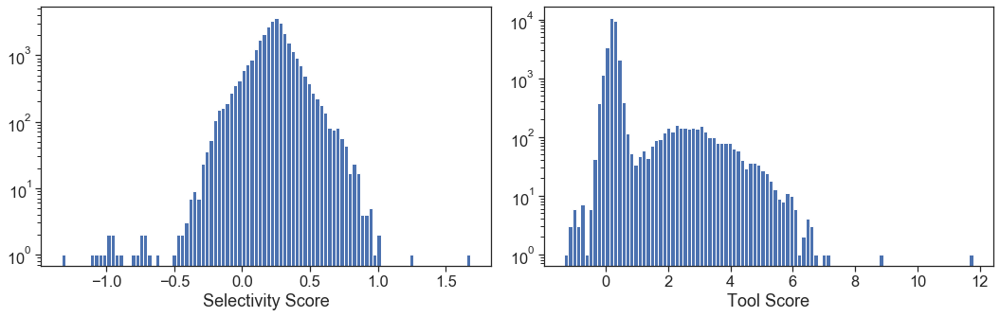

In [93]:
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):
    fig = plt.figure()
    fig.set_size_inches(15, 5)  
    plt.subplot(1, 2, 1)
    plt.hist(activityStats_df['selectivity score'], bins=100)
    plt.yscale('log')
    plt.xlabel('Selectivity Score')
    plt.subplot(1, 2, 2)
    plt.hist(activityStats_df['tool score'], bins=100) 
    plt.yscale('log')
    plt.xlabel('Tool Score')
    plt.tight_layout()
    plt.show()

In [94]:
selectivity_Q1 =  activityStats_df['selectivity score'].quantile(0.25)
selectivity_Q3 =  activityStats_df['selectivity score'].quantile(0.75)
selectivity_IQR = selectivity_Q3 - selectivity_Q1
selectivity_Q1 - (selectivity_IQR  * 4.0), selectivity_Q3 + (selectivity_IQR  * 4.0)

(-0.4551686353867359, 0.9219511491284509)

In [95]:
(QUIZC_activityStats_nooutliers_df_besttool,
 QUIZC_activityStats_nooutliers_df_bestselectivity) = calculate_selectivity_tool(activityStats_df, QUIZC_cids_inchi_smiles, 
                                                                                 4.0, 7.5, proj_intermediary_outputs_path)

In [96]:
# proportion of ChEMBL human single target bioactivity data with cell line information:
len(chembl27_data[~pd.isnull(chembl27_data['Cell ChEMBL ID'])]) / len(chembl27_data)

0.12100114537164854

## QUIZ-C sensitivity analysis (Supp. Fig. 28)

100%|██████████| 60/60 [00:03<00:00, 19.60it/s]


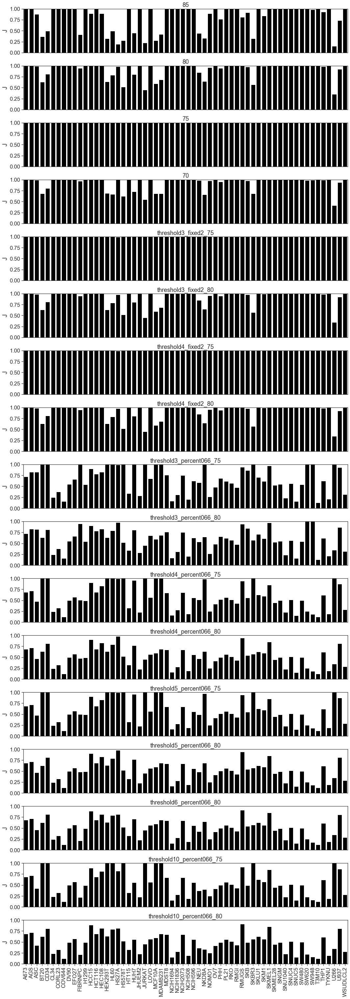

In [109]:
all_params = ['85', '80', '75', '70', 'threshold3_fixed2_75', 'threshold3_fixed2_80', 'threshold4_fixed2_75', 'threshold4_fixed2_80', 
              'threshold3_percent066_75', 'threshold3_percent066_80', 'threshold4_percent066_75', 'threshold4_percent066_80',
              'threshold5_percent066_75', 'threshold5_percent066_80', 'threshold6_percent066_80',
              'threshold10_percent066_75', 'threshold10_percent066_80']
fig = plt.figure()
fig.set_size_inches(15, len(all_params)*2.5)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):
    for i, param in enumerate(all_params):

        with open(proj_path + 'QUIZ-C_sensitivity/cell_pos_edges_dict_%s.pickle' % param, 'rb') as handle:
            cell_pos_edges_dict = pickle.load(handle)
        with open(proj_path + 'QUIZ-C_sensitivity/cell_neg_edges_dict_%s.pickle' % param, 'rb') as handle:
            cell_neg_edges_dict = pickle.load(handle)
        with open(proj_path + 'QUIZ-C_sensitivity/cell_drugs_dict_%s.pickle' % param, 'rb') as handle:
            cell_drugs_dict = pickle.load(handle) 


        cell_edges_df_dict = {}
        for c in tqdm(set(cell_pos_edges_dict.keys()) - set(['MCH58']), position=0, leave=True):

            temp_pos_df = pd.DataFrame(np.array([(i, j) for i, j in zip(cell_drugs_dict[c], cell_pos_edges_dict[c])])).explode(1)
            temp_neg_df = pd.DataFrame(np.array([(i, j) for i, j in zip(cell_drugs_dict[c], cell_neg_edges_dict[c])])).explode(1)

            temp_pos_df = temp_pos_df[~pd.isnull(temp_pos_df[1])]
            temp_neg_df = temp_neg_df[~pd.isnull(temp_neg_df[1])]

            temp_pos_df = temp_pos_df.reset_index(drop=True).rename(columns={0: 'Drug', 1: 'Target'})
            temp_neg_df = temp_neg_df.reset_index(drop=True).rename(columns={0: 'Drug', 1: 'Target'})

            temp_pos_df['Target'] = temp_pos_df['Target'].astype(int)
            temp_neg_df['Target'] = temp_neg_df['Target'].astype(int)

            temp_pos_df['Direction'] = 'Up'
            temp_neg_df['Direction'] = 'Down'

            temp_pos_df = pd.merge(temp_pos_df, L1000_gene_info, left_on='Target', right_on='pr_gene_id', how='left')[['Drug', 'pr_gene_symbol', 'Direction']]
            temp_neg_df = pd.merge(temp_neg_df, L1000_gene_info, left_on='Target', right_on='pr_gene_id', how='left')[['Drug', 'pr_gene_symbol', 'Direction']]

            temp_all_df = pd.concat([temp_pos_df, temp_neg_df]).rename(columns={'pr_gene_symbol': 'Target'})

            cell_edges_df_dict[c] = temp_all_df


        J_df = pd.DataFrame(index=sorted(list(set(cell_pos_edges_dict.keys()) - set(['MCH58']))), columns=['J', 'inner', 'outer'])
        for c in sorted(list(set(cell_pos_edges_dict.keys()) - set(['MCH58']))):
            old_new_inner = pd.merge(QUIZC_edgelist_df_dict[c], cell_edges_df_dict[c], left_on=['Drug', 'Target', 'Direction'], 
                                     right_on=['Drug', 'Target', 'Direction'], how='inner')
            old_new_outer = pd.merge(QUIZC_edgelist_df_dict[c], cell_edges_df_dict[c], left_on=['Drug', 'Target', 'Direction'], 
                                     right_on=['Drug', 'Target', 'Direction'], how='outer')
            J = 1.0 * len(old_new_inner) /  len(old_new_outer)
            J_df.at[c, 'J'] = J
            J_df.at[c, 'inner'] = len(old_new_inner)
            J_df.at[c, 'outer'] = len(old_new_outer)


        plt.subplot(len(all_params), 1, i+1)
        sns.barplot(x=J_df.index, y='J', data=J_df, color='black')
        plt.xticks(rotation=90)
        if i < len(all_params)-1:
            plt.gca().axes.get_xaxis().set_visible(False)
        #plt.gca().axes.get_yaxis().set_visible(False)
        #plt.colorbar(im)
        plt.title('%s' % param)
        plt.ylim(0.0, 1.0)

    plt.tight_layout()
    plt.subplots_adjust(wspace=0.2, hspace=0.3)
    plt.savefig(proj_output_path + 'QUIZC_different_parameters_edge_overlap_comparison.pdf', format='pdf')
    plt.show()        

## Comparison of SCS with Chi square statistic and Fisher's exact test (Supp. Figs. 14A-B)

In [3]:
def SCS_chi2(geneset_up, geneset_dn, disease_up, disease_dn):
          
        A = len(disease_up & geneset_up)
        B = len(disease_up & geneset_dn)
        C = len(disease_dn & geneset_up)
        D = len(disease_dn & geneset_dn)
            
        if len((geneset_up | geneset_dn) & (disease_up | disease_dn)) > 0:
            if ((A+B == 0) | (C+D == 0) | (B+D == 0) | (A+C == 0)):
                
                return np.nan, np.nan 
            
            else:
                
                SCS_chi2 = st.chi2_contingency([[A, B], [C, D]])[0]
                SCS_chi2_pval = st.chi2_contingency([[A, B], [C, D]])[1]

                return SCS_chi2, SCS_chi2_pval
            
        else:
            return np.nan, np.nan

In [4]:
def SCS_fisher(geneset_up, geneset_dn, disease_up, disease_dn):
          
        A = len(disease_up & geneset_up)
        B = len(disease_up & geneset_dn)
        C = len(disease_dn & geneset_up)
        D = len(disease_dn & geneset_dn)
            
        if len((geneset_up | geneset_dn) & (disease_up | disease_dn)) > 0:
            if (B == 0) | (C == 0):
                
                return np.nan, np.nan 
            
            else:
                
                SCS_fisher_odds = st.fisher_exact([[A, B], [C, D]])[0]
                SCS_fisher_pval = st.fisher_exact([[A, B], [C, D]])[1]

                return SCS_fisher_odds, SCS_fisher_pval
            
        else:
            return np.nan, np.nan

In [5]:
cgp_updn, cgp_updn_labels, cgp_updn_allgenes = process_MSigDB_CGP(input_paths_dict['cgp_dir'])
Enrichr_GEO_disease_human_up, Enrichr_GEO_disease_human_dn = import_Enrichr_GEO(input_paths_dict['Enrichr_GEO_up_path'], 
                                                                                input_paths_dict['Enrichr_GEO_dn_path'])

In [6]:
scs_chi2_df = pd.DataFrame(index=cgp_updn_labels, columns=sorted(list(Enrichr_GEO_disease_human_up.keys())))
scs_fisher_df = pd.DataFrame(index=cgp_updn_labels, columns=sorted(list(Enrichr_GEO_disease_human_up.keys())))
scs_df = pd.DataFrame(index=cgp_updn_labels, columns=sorted(list(Enrichr_GEO_disease_human_up.keys())))

for geneset_name in tqdm(cgp_updn_labels, position=0, leave=True):

    geneset_up = set(cgp_updn[geneset_name + '_UP'])
    geneset_dn = set(cgp_updn[geneset_name + '_DN'])

    for disease_name in sorted(list(Enrichr_GEO_disease_human_up.keys())):
        
        disease_up = set(Enrichr_GEO_disease_human_up[disease_name])
        disease_dn = set(Enrichr_GEO_disease_human_dn[disease_name])

        A = len(disease_up & geneset_up)
        B = len(disease_up & geneset_dn)
        C = len(disease_dn & geneset_up)
        D = len(disease_dn & geneset_dn)
        # st.chi2_contingency([[A, B], [C, D]])[0]
        temp_chi2, temp_chi2_pval = SCS_chi2(geneset_up, geneset_dn, disease_up, disease_dn)
        scs_chi2_df.at[geneset_name, disease_name] = temp_chi2
        # print(temp_chi2, temp_pval)
        
        temp_fisher_odds, temp_fisher_pval = SCS_fisher(geneset_up, geneset_dn, disease_up, disease_dn)
        scs_fisher_df.at[geneset_name, disease_name] = temp_fisher_odds       
        
        temp_scs = SCS(geneset_up, geneset_dn, disease_up, disease_dn)
        scs_df.at[geneset_name, disease_name] = temp_scs
        # print(temp_scs)

100%|██████████| 1058/1058 [16:05<00:00,  1.10it/s]


In [7]:
scs_flat = scs_df.to_numpy().flatten()
scs_chi2_flat = scs_chi2_df.to_numpy().flatten()
scs_fisher_flat = scs_fisher_df.to_numpy().flatten()

In [8]:
st.pearsonr(scs_flat[np.where((scs_fisher_flat != 0) & ~(pd.isnull(scs_fisher_flat)))], 
            np.log10(scs_fisher_flat[np.where((scs_fisher_flat != 0) & ~(pd.isnull(scs_fisher_flat)))].astype(float)))

(0.7311634128398151, 0.0)

In [9]:
st.spearmanr(scs_flat[np.where((scs_fisher_flat != 0) & ~(pd.isnull(scs_fisher_flat)))], 
            np.log10(scs_fisher_flat[np.where((scs_fisher_flat != 0) & ~(pd.isnull(scs_fisher_flat)))].astype(float)))

SpearmanrResult(correlation=0.8654065658329321, pvalue=0.0)

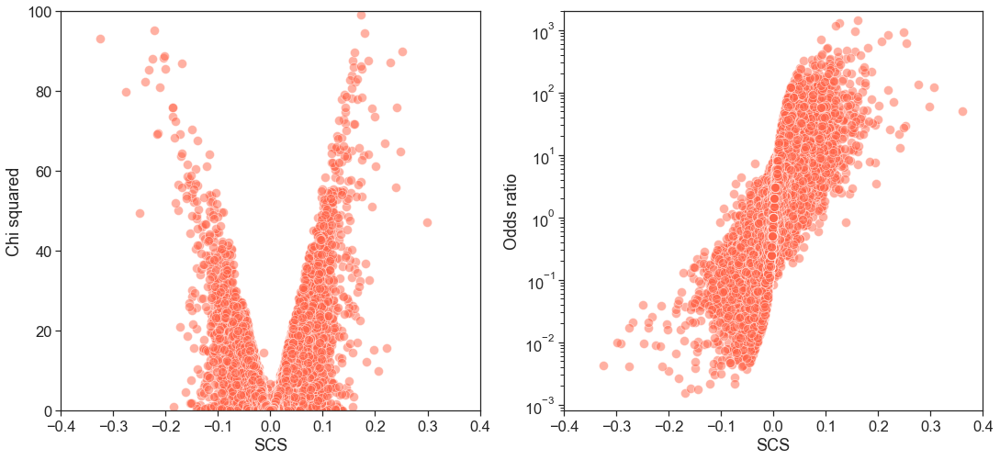

In [10]:
fig = plt.figure()
fig.set_size_inches(18, 8)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):
    plt.subplot(1, 2, 1)
    sns.scatterplot(scs_flat, scs_chi2_flat, alpha=0.5, s=100, color='tomato')
    plt.xlim(-0.4, 0.4)
    plt.ylim(0, 100)
    plt.xlabel('SCS')
    plt.ylabel('Chi squared')
    
    plt.subplot(1, 2, 2)
    sns.scatterplot(scs_flat, scs_fisher_flat, alpha=0.5, s=100, color='tomato')
    plt.xlim(-0.4, 0.4)
    plt.xlim(-0.4, 0.4)
    plt.yscale('log')
    plt.ylim(0.0008, 2000)
    plt.xlabel('SCS')
    plt.ylabel('Odds ratio')
    
    plt.savefig(proj_output_path + 'SCS_Chi2_OR.pdf', format='pdf')  
    
    plt.show()   

## Sensitivity of PACOS values to correlations in intermediary disease signatures (Supp. Figs. 15-16)

In [3]:
L1000_gene_info, L1000_cell_info, L1000_inst_info, L1000_pert_info, L1000_sig_info = import_L1000_metadata(input_paths_dict['L1000_gene_info_path'], 
                                                                                                           input_paths_dict['L1000_cell_info_path'],
                                                                                                           input_paths_dict['L1000_inst_info_path'], 
                                                                                                           input_paths_dict['L1000_pert_info_path'], 
                                                                                                           input_paths_dict['L1000_sig_info_path'])

In [4]:
QUIZC_edgelist_df_dict, QUIZC_nodelist_df_dict, QUIZC_allcells, \
QUIZC_allgenes, QUIZC_alldrugs, QUIZC_allnodes = process_QUIZC_output(proj_path + 'ALL_QUIZC75/' + 'ALL_cell_pos_edges_dict_0.75.pickle', 
                                                                     proj_path + 'ALL_QUIZC75/' + 'ALL_cell_neg_edges_dict_0.75.pickle',
                                                                     proj_path + 'ALL_QUIZC75/' + 'ALL_cell_drugs_dict_0.75.pickle',
                                                                     L1000_gene_info)

100%|██████████| 71/71 [00:07<00:00,  9.37it/s]


In [6]:
cgp_updn, cgp_updn_labels, cgp_updn_allgenes = process_MSigDB_CGP(input_paths_dict['cgp_dir'])
Enrichr_GEO_disease_human_up, Enrichr_GEO_disease_human_dn = import_Enrichr_GEO(input_paths_dict['Enrichr_GEO_up_path'], 
                                                                                input_paths_dict['Enrichr_GEO_dn_path'])

In [7]:
Enrichr_GEO_feature_df = pd.DataFrame(0, index=sorted(list(Enrichr_GEO_disease_human_up.keys())), 
                                      columns=QUIZC_allgenes['Gene_symbol'], dtype='int')

for disease_name in tqdm(sorted(list(Enrichr_GEO_disease_human_up.keys())), position=0, leave=True):

    disease_up_common = set(Enrichr_GEO_disease_human_up[disease_name]) & set(QUIZC_allgenes['Gene_symbol'])
    disease_dn_common = set(Enrichr_GEO_disease_human_dn[disease_name]) & set(QUIZC_allgenes['Gene_symbol'])

    Enrichr_GEO_feature_df.loc[disease_name][disease_up_common] = 1
    Enrichr_GEO_feature_df.loc[disease_name][disease_dn_common] = -1
   

100%|██████████| 569/569 [00:02<00:00, 262.24it/s]


In [8]:
Enrichr_GEO_corrmat = np.corrcoef(Enrichr_GEO_feature_df)
Enrichr_GEO_varcovmat = np.cov(Enrichr_GEO_feature_df)

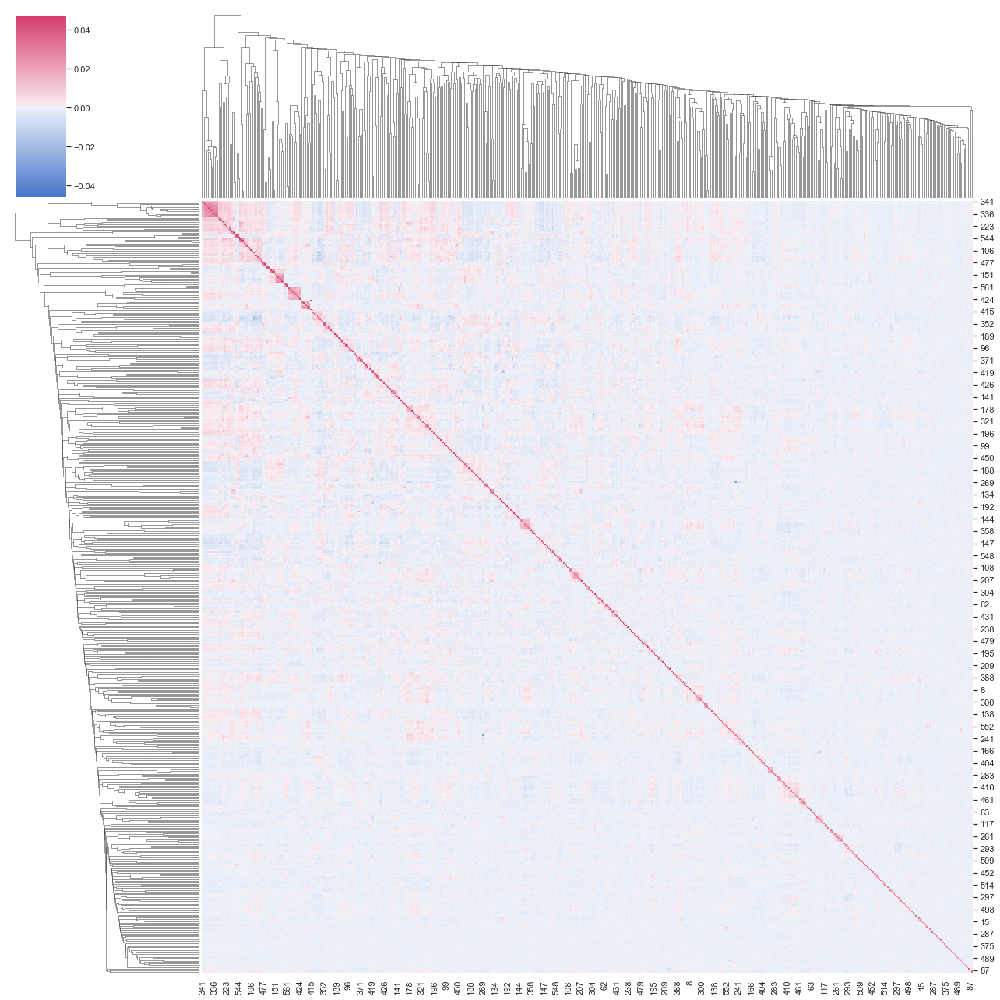

In [17]:
sns.set(font_scale=1.0)
with sns.axes_style("white"):
    sns.clustermap(Enrichr_GEO_varcovmat, 
                   cmap=sns.diverging_palette(255, 0, sep=1, n=256, as_cmap=True), linewidths=0, 
                   figsize=(18, 18))
    plt.savefig(proj_output_path + 'disease_varcov.pdf', format='pdf', bbox_inches='tight')

plt.show()

In [9]:
Enrichr_GEO_corrmat_row_linkage = hierarchy.linkage(distance.pdist(Enrichr_GEO_corrmat), method='ward')
Enrichr_GEO_corrmat_Z = hierarchy.dendrogram(Enrichr_GEO_corrmat_row_linkage, orientation='left', color_threshold=10, no_plot=True)
Enrichr_GEO_corrmat_idx = Enrichr_GEO_corrmat_Z['leaves']

In [10]:
from matplotlib.colors import rgb2hex, colorConverter
from collections import defaultdict

class Clusters(dict):
    def _repr_html_(self):
        html = '<table style="border: 0;">'
        for c in self:
            hx = rgb2hex(colorConverter.to_rgb(c))
            html += '<tr style="border: 0;">' \
            '<td style="background-color: {0}; ' \
                       'border: 0;">' \
            '<code style="background-color: {0};">'.format(hx)
            html += c + '</code></td>'
            html += '<td style="border: 0"><code>' 
            html += repr(self[c]) + '</code>'
            html += '</td></tr>'

        html += '</table>'

        return html

# (http://www.nxn.se/valent/extract-cluster-elements-by-color-in-python) and (https://nbviewer.jupyter.org/gist/vals/150ec97a5b7db9c82ee9) 
# Note: This is an ingenious method but has one minor flaw -- if the upper and lower legs of two branches somehow coincide (in the reducibility 
# dendrogram it does, so I guess it's not that rare), the same coordinate can be registered as a leaf in two different classes, and when the time 
# comes to plot, the non-leaf color can override the actual leaf color. to circumvent this issue, we should either remove whichever labels are 
# duplicated from the non-leaf (grey in this case) color, or make the coloring order such that grey gets colored first and all other colors 
# overwrite it.
def get_cluster_classes(den, label='ivl'):
    cluster_idxs = defaultdict(list)
    for c, pi in zip(den['color_list'], den['icoord']):
        for leg in pi[1:3]:
            i = (leg - 5.0) / 10.0
            #print(c, '|', pi, '|', leg,'|', i, '|', abs(i - int(i)) < 1e-5)
            if abs(i - int(i)) < 1e-5:
                cluster_idxs[c].append(int(i))

    # not the best solution but here is where we remove the redundant key from the grey class(i.e. "above_color_threshold parameter", set to #AAAAAA) 
    for key in set(cluster_idxs.keys()) - set(['#AAAAAA']):
        overlap = set(cluster_idxs[key]) & set(cluster_idxs['#AAAAAA'])
        #print(key, overlap, len(overlap))
        if len(overlap) > 0:
            for o in overlap:
                cluster_idxs['#AAAAAA'].pop(np.where(np.array(cluster_idxs['#AAAAAA'])==o)[0][0])                
                
    cluster_classes = Clusters()
    for c, l in cluster_idxs.items():
        i_l = [den[label][i] for i in l]
        cluster_classes[c] = i_l

    return cluster_classes

In [11]:
clust_thr_k_dict = {}
for thr in np.linspace(0.1, 2.5, 25):
    fc = hierarchy.fcluster(Enrichr_GEO_corrmat_row_linkage, criterion='distance', t=thr)
    #print (thr, max(fc))
    clust_thr_k_dict[thr] = {k: np.where(fc == k)[0] for k in range(1, max(fc)+1)}
    
    
clust_thr_k_rand_dict = {}
for thr in clust_thr_k_dict.keys():
    for k in clust_thr_k_dict[thr].keys():
        clust_thr_k_rand_dict[thr] = {k: random.choice(clust_thr_k_dict[thr][k]) for k in clust_thr_k_dict[thr].keys()}

In [13]:
QUIZC_activityStats_nooutliers_df_besttool = pd.read_csv(input_paths_dict['tool_path'])

In [14]:
pcp_perturbation_df_dict = PCP_perturbation_alldrugs(QUIZC_alldrugs, QUIZC_allcells, QUIZC_edgelist_df_dict, 
                                                     Enrichr_GEO_disease_human_up, Enrichr_GEO_disease_human_dn,
                                                     proj_benchmark_outputs_path, 
                                                     method_name='QUIZ-C', return_output=True) 

pacos_tool_merged_df_thr_dict = {}

for thr in tqdm(clust_thr_k_rand_dict.keys(), position=0, leave=True):

    Enrichr_GEO_disease_human_up_tempthr = {Enrichr_GEO_feature_df.index[i]: Enrichr_GEO_disease_human_up[Enrichr_GEO_feature_df.index[i]] 
                                            for i in sorted(list(clust_thr_k_rand_dict[thr].values()))}
    Enrichr_GEO_disease_human_dn_tempthr = {Enrichr_GEO_feature_df.index[i]: Enrichr_GEO_disease_human_dn[Enrichr_GEO_feature_df.index[i]] 
                                            for i in sorted(list(clust_thr_k_rand_dict[thr].values()))}

    geneset_name = cgp_updn_labels[0]

    geneset_up = set(cgp_updn[geneset_name + '_UP'])
    geneset_dn = set(cgp_updn[geneset_name + '_DN'])   
    pcp_geneset_df = PCP_geneset(geneset_up, geneset_dn, Enrichr_GEO_disease_human_up_tempthr, Enrichr_GEO_disease_human_dn_tempthr, 
                                 geneset_name=geneset_name)

    pacos_tool_merged_df = PACOS(pcp_geneset_df, pcp_perturbation_df_dict, QUIZC_alldrugs, QUIZC_allcells,
                                 QUIZC_activityStats_nooutliers_df_besttool, '/Users/ardahalu/Desktop/', method_name='QUIZ-C', geneset_name=geneset_name, 
                                 r=2.0, threshold=10, tqdm_off=True)
    
    pacos_tool_merged_df_thr_dict[thr] = pacos_tool_merged_df
    
    os.remove('/Users/ardahalu/Desktop/' + 'QUIZ-C_%s_r2.csv' % geneset_name)

Reading PCPs for all perturbations...


  0%|          | 0/25 [00:00<?, ?it/s]/Users/ardahalu/anaconda3/envs/py3_main/lib/python3.8/site-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/Users/ardahalu/anaconda3/envs/py3_main/lib/python3.8/site-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/Users/ardahalu/anaconda3/envs/py3_main/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/Users/ardahalu/anaconda3/envs/py3_main/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/Users/ardahalu/anaconda3/envs/py3_main/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
 12%|█▏        | 3/25 [19:03

KeyboardInterrupt: 

In [18]:
fig = plt.figure()
fig.set_size_inches(16, 4)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):
    for thr in pacos_tool_merged_df_thr_dict.keys():

        plt.boxplot(pacos_tool_merged_df_thr_dict[thr]['PACOS_Spearman_rho'].values, positions=[thr], widths=0.08, showfliers=False)
    #plt.legend()
    plt.xticks(np.linspace(0.1, 2.5, 25), np.around(np.linspace(0.1, 2.5, 25), 1), rotation=90)
    plt.xlabel('cophenetic distance')
    plt.ylabel('PACOS')
    plt.show()

NameError: name 'pacos_tool_merged_df_thr_dict' is not defined

<Figure size 1152x288 with 0 Axes>

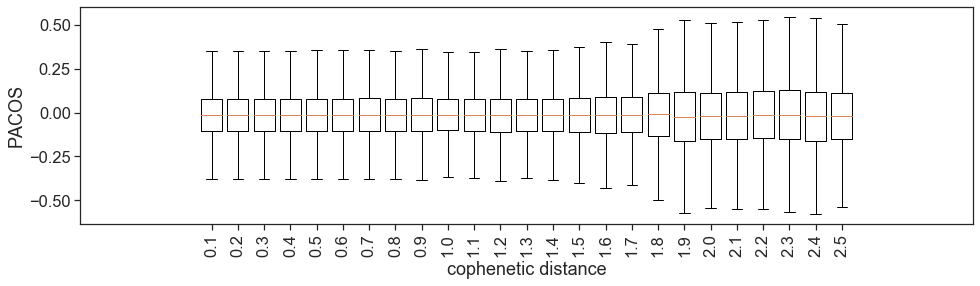

In [744]:
fig = plt.figure()
fig.set_size_inches(16, 4)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):
    for thr in pacos_tool_merged_df_thr_dict.keys():

        plt.boxplot(pacos_tool_merged_df_thr_dict[thr]['PACOS_Spearman_rho_reverse'].values, positions=[thr], widths=0.08, showfliers=False)
    #plt.legend()
    plt.xticks(np.linspace(0.1, 2.5, 25), np.around(np.linspace(0.1, 2.5, 25), 1), rotation=90)
    plt.xlabel('cophenetic distance')
    plt.ylabel('PACOS')
    plt.show()

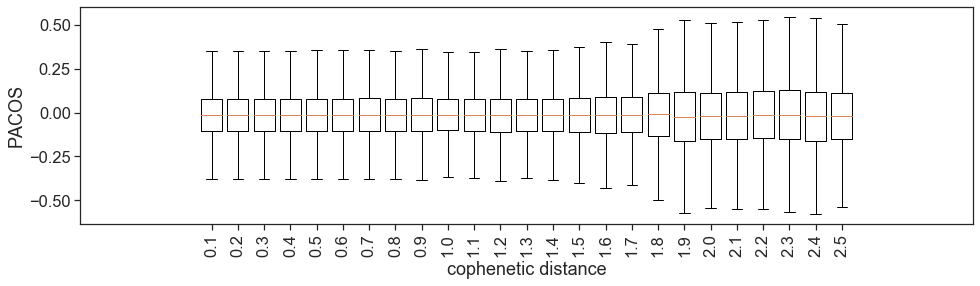

In [744]:
fig = plt.figure()
fig.set_size_inches(16, 4)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):
    for thr in pacos_tool_merged_df_thr_dict.keys():

        plt.boxplot(pacos_tool_merged_df_thr_dict[thr]['PACOS_Spearman_rho_reverse'].values, positions=[thr], widths=0.08, showfliers=False)
    #plt.legend()
    plt.xticks(np.linspace(0.1, 2.5, 25), np.around(np.linspace(0.1, 2.5, 25), 1), rotation=90)
    plt.xlabel('cophenetic distance')
    plt.ylabel('PACOS')
    plt.show()

In [742]:
fc = hierarchy.fcluster(Enrichr_GEO_corrmat_row_linkage, criterion='distance', t=2.5)
print(max(fc)+1)

78


In [789]:
cluster_sizes_thr = [max(hierarchy.fcluster(Enrichr_GEO_corrmat_row_linkage, criterion='distance', t=thr)) + 1 
                     for thr in np.around(np.linspace(0.1, 2.5, 25), 1)]

In [736]:
{k: np.where(fc == k)[0] for k in range(1, max(fc)+1)}

{1: array([373, 377]),
 2: array([441, 442, 443, 444, 526]),
 3: array([116]),
 4: array([ 68, 216, 561]),
 5: array([409, 412, 522]),
 6: array([258, 259]),
 7: array([256, 257]),
 8: array([103, 195]),
 9: array([511, 512]),
 10: array([527, 528]),
 11: array([127]),
 12: array([198, 417]),
 13: array([113, 163]),
 14: array([307, 308]),
 15: array([48]),
 16: array([496]),
 17: array([233, 297]),
 18: array([416]),
 19: array([ 26, 262, 263]),
 20: array([261, 515]),
 21: array([ 25, 260]),
 22: array([329, 460]),
 23: array([60, 61, 62]),
 24: array([253, 254]),
 25: array([156]),
 26: array([292]),
 27: array([272]),
 28: array([252, 255]),
 29: array([293, 408]),
 30: array([500, 502]),
 31: array([ 98, 358]),
 32: array([231, 232]),
 33: array([517, 518]),
 34: array([ 21, 104]),
 35: array([299, 514]),
 36: array([ 47, 304]),
 37: array([154, 524]),
 38: array([  4, 251]),
 39: array([24]),
 40: array([562]),
 41: array([403, 404, 405]),
 42: array([ 86, 288]),
 43: array([ 19,

In [753]:
maxPACOS_thr_df = pd.DataFrame(index=QUIZC_allcells['Cell_type'], columns=pacos_tool_merged_df_thr_dict.keys())
for thr in pacos_tool_merged_df_thr_dict.keys():
    maxPACOS_thr_df[thr] = pacos_tool_merged_df_thr_dict[thr].groupby('Cell_type').max()['PACOS_Spearman_rho']

In [763]:
meanPACOS_thr_df = pd.DataFrame(index=QUIZC_allcells['Cell_type'], columns=pacos_tool_merged_df_thr_dict.keys())
for thr in pacos_tool_merged_df_thr_dict.keys():
    meanPACOS_thr_df[thr] = pacos_tool_merged_df_thr_dict[thr].groupby('Cell_type').mean()['PACOS_Spearman_rho']

In [783]:
maxPACOS_thr_df.mean().index

Float64Index([               0.1,                0.2,                0.3,
                             0.4,                0.5,                0.6,
                             0.7, 0.7999999999999999, 0.8999999999999999,
              0.9999999999999999, 1.0999999999999999,                1.2,
                             1.3,                1.4,                1.5,
              1.5999999999999999,                1.7,                1.8,
                             1.9,                2.0, 2.0999999999999996,
              2.1999999999999997,                2.3,                2.4,
                             2.5],
             dtype='float64')

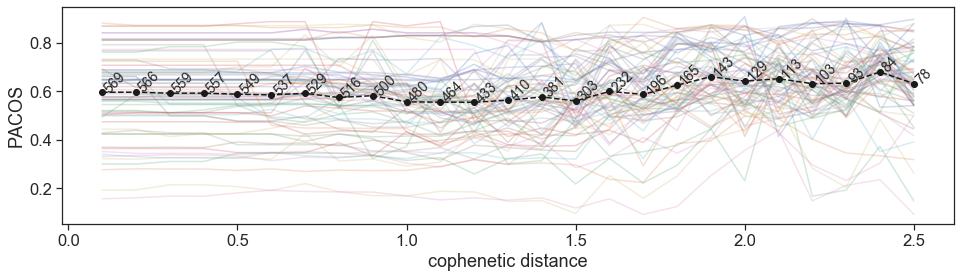

In [814]:
fig = plt.figure()
fig.set_size_inches(16, 4)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):
    plt.plot(maxPACOS_thr_df.T, alpha=0.25)
    plt.plot(maxPACOS_thr_df.mean(), 'ko--')
    for i, txt in enumerate(cluster_sizes_thr):
        plt.annotate(txt, (list(maxPACOS_thr_df.mean().index)[i], list(maxPACOS_thr_df.mean())[i]), fontsize=14, rotation=45)
    plt.xlabel('cophenetic distance')
    plt.ylabel('PACOS')
    plt.show()

### The PACOS values only start to get inflated somewhat only after a cophenetic distance of 1.5, at which point the clusters are too artifically combined (i.e., diseases that are not similar are forced to be included in the same cluster). This is the case for both the overall distributions and the maximal PACOS values for wach cell line.

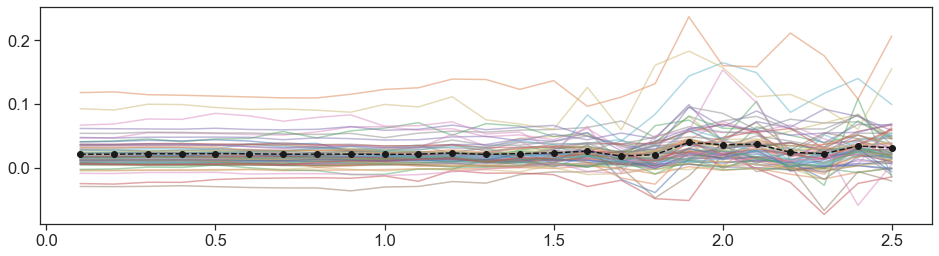

In [770]:
fig = plt.figure()
fig.set_size_inches(16, 4)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):
    plt.plot(meanPACOS_thr_df.T, alpha=0.5)
    plt.plot(meanPACOS_thr_df.mean(), 'ko--')
plt.show()

## Proof-of-concept 1: Subclinical Atherosclerosis

From the [EHJ 2023 paper on epigenetic aging and subclinical atherosclerosis](https://academic.oup.com/eurheartj/article/44/29/2698/7203968?login=false)

In [15]:
ehj2023_SA = pd.read_csv(proj_external_data_path + 'Sanchez-Cabo_EHJ/OnlineTable8_DEGs_DEPs_GDvsND.csv', skiprows=3)

In [16]:
SA_005_up = ehj2023_SA[(ehj2023_SA['P.Value']<0.05) & (ehj2023_SA['logFC']>0)]
SA_005_dn = ehj2023_SA[(ehj2023_SA['P.Value']<0.05) & (ehj2023_SA['logFC']<0)]

f = open(proj_path + 'PoC1_SA/ehj2023_SA_005_up.csv', 'w')
for i in SA_005_up['ext_gene'].values:
    f.write('%s\n' % i)
f.close()

f = open(proj_path + 'PoC1_SA/ehj2023_SA_005_dn.csv', 'w')
for i in SA_005_dn['ext_gene'].values:
    f.write('%s\n' % i)
f.close()

In [17]:
f = open(proj_path + 'PoC1_SA/ehj2023_SA_005_up.csv', 'r')
ehj2023_SA_005_up = set([i.rstrip() for i in f])
f.close()
f = open(proj_path + 'PoC1_SA/ehj2023_SA_005_dn.csv', 'r')
ehj2023_SA_005_dn = set([i.rstrip() for i in f])
f.close()

In [18]:
# get Pathopticon results
SA005_PACOS_all = pd.read_csv(proj_path + 'PoC1_SA/QUIZ-C_Subclinical_atherosclerosis_p005_r2.csv')
SA005_PACOS_U937 = SA005_PACOS_all[SA005_PACOS_all['Cell_type']=='U937'].sort_values('PACOS_tool_combined_reverse', ascending=False)

SA005 = pd.read_csv(proj_path + 'PoC1_SA/Subclinical_atherosclerosis_p005_Pathopticon.csv')
SA005_U937 = SA005[SA005['Cell_type'] == 'U937'].sort_values('PACOS_tool_combined_reverse', 
                                                             ascending=False).set_index('Pert_iname', drop=True)

In [19]:
CPDB_all_paths = pd.read_csv(proj_external_data_path + 'ConsensusPathDB/CPDB_pathways_genes.tab', sep='\t')
CPDB_all_paths_dict = {}
CPDB_allgenes = set()
for p in CPDB_all_paths['pathway']:
    CPDB_all_paths_dict[p] = CPDB_all_paths[CPDB_all_paths['pathway']==p]['hgnc_symbol_ids'].values[0].split(',')
    CPDB_allgenes.update(set(CPDB_all_paths[CPDB_all_paths['pathway']==p]['hgnc_symbol_ids'].values[0].split(',')))

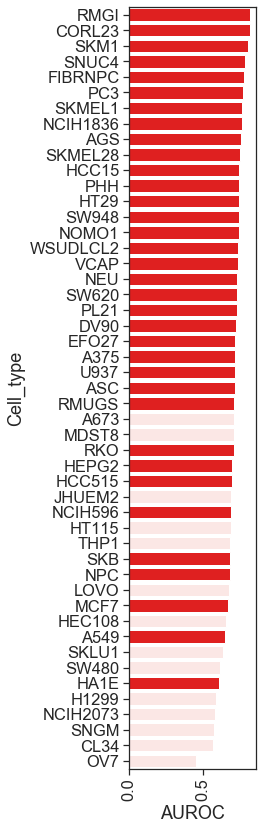

In [36]:
SA005_auroc_sorted = SA005[['Cell_type', 'AUROC', 'AUROC_emp_pval']].drop_duplicates().sort_values('AUROC', ascending=False)
colors = ['red' if o<0.05 else 'mistyrose' for o in SA005_auroc_sorted['AUROC_emp_pval']]
fig = plt.figure()
fig.set_size_inches(4, 12)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):
    sns.barplot(data=SA005_auroc_sorted, y='Cell_type', x='AUROC', orient='h',
                palette=colors)
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.savefig(proj_path + 'PoC1_SA/SA005_sigcells.pdf', format='pdf', bbox_inches='tight')
    plt.show()

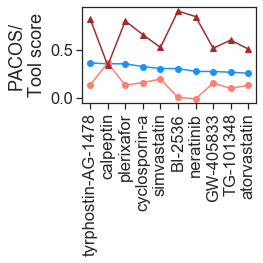

In [46]:
fig = plt.figure()
fig.set_size_inches(4, 4)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):
    plt.plot(SA005_PACOS_U937['Pert_iname'][0:10], SA005_PACOS_U937['PACOS_tool_combined_reverse'][0:10], 'o-', 
             label='PACOS+Tool', c='Dodgerblue')
    plt.plot(SA005_PACOS_U937['Pert_iname'][0:10], SA005_PACOS_U937['PACOS_Spearman_rho_reverse'][0:10], 'o-', 
             label='PACOS', c='Salmon')
    plt.plot(SA005_PACOS_U937['Pert_iname'][0:10], SA005_PACOS_U937['tool_score_imputed'][0:10], '^-', 
             label='Tool', c='Brown')
    plt.xticks(rotation=90)
    #plt.legend()
    plt.ylabel('PACOS/\nTool score')
    plt.tight_layout()
    plt.savefig(proj_path + 'PoC1_SA/SA005_U937_top10_PACOS.pdf', format='pdf', bbox_inches='tight')
    plt.show()

## Pathway analysis of the top intermediary pathophenotypes of top drug candidates (Fig. 7C, Supp. Fig. 24)

In [20]:
validation_v2_drugs_U937 = ['tyrphostin-AG-1478', 'cyclosporin-a', 'simvastatin', 'neratinib', 'GW-405833', 'TG-101348']
validation_v2_cell_lines = ['U937']
validation_v2_drug_geneset_dict_up = {'U937': ehj2023_SA_005_up}
validation_v2_drug_geneset_dict_dn = {'U937': ehj2023_SA_005_dn}
validation_v2_drug_geneset_name = {'U937': 'ehj2023_SA_005'}

In [21]:
c = 'U937'
topN = 5
drug_topN_diseases = {}
for i, drug in enumerate(validation_v2_drugs_U937):

    geneset_name = validation_v2_drug_geneset_name[c]
    pcp_geneset_df = PCP_geneset(validation_v2_drug_geneset_dict_up[c], validation_v2_drug_geneset_dict_dn[c], 
                                 Enrichr_GEO_disease_human_up, Enrichr_GEO_disease_human_dn, geneset_name=geneset_name)
    temp_common_diseases = set(pcp_geneset_df.loc[geneset_name][~pd.isnull(pcp_geneset_df.loc[geneset_name])].index) &\
                            set(pcp_perturbation_df_dict[drug].loc[c][~pd.isnull(pcp_perturbation_df_dict[drug].loc[c])].index)
    
    drug_topN_diseases[drug] = (pcp_geneset_df.loc[geneset_name][temp_common_diseases] * 
                                 pcp_perturbation_df_dict[drug].loc[c][temp_common_diseases]).sort_values(ascending=True)[0:topN].index.values
    
# all_topN_diseases = functools.reduce(set.union, (set(val) for val in drug_topN_diseases.values()))
# print(len(all_topN_diseases))
 
    ehj2023_SA_005_overlap = {}
    for dis in drug_topN_diseases[drug]:
        ehj2023_SA_005_overlap[dis] = ((ehj2023_SA_005_up | ehj2023_SA_005_dn) & 
                                (set(Enrichr_GEO_disease_human_up[dis]) | set(Enrichr_GEO_disease_human_dn[dis])))

    overlap_df, fisher_OR_df, fisher_pval_df, fisher_adjpval_df = fisher_pathway_enrichment(CPDB_all_paths_dict, ehj2023_SA_005_overlap, CPDB_allgenes, 
                                                                                method='fdr_bh',
                                                                                outfile=proj_path + 'PoC1_SA/' + 
                                                                                '%s_%s_top%s_diseases_CPDB_enrichment' % (c, drug, topN))
    print(drug)

tyrphostin-AG-1478
cyclosporin-a
simvastatin
neratinib
GW-405833
TG-101348


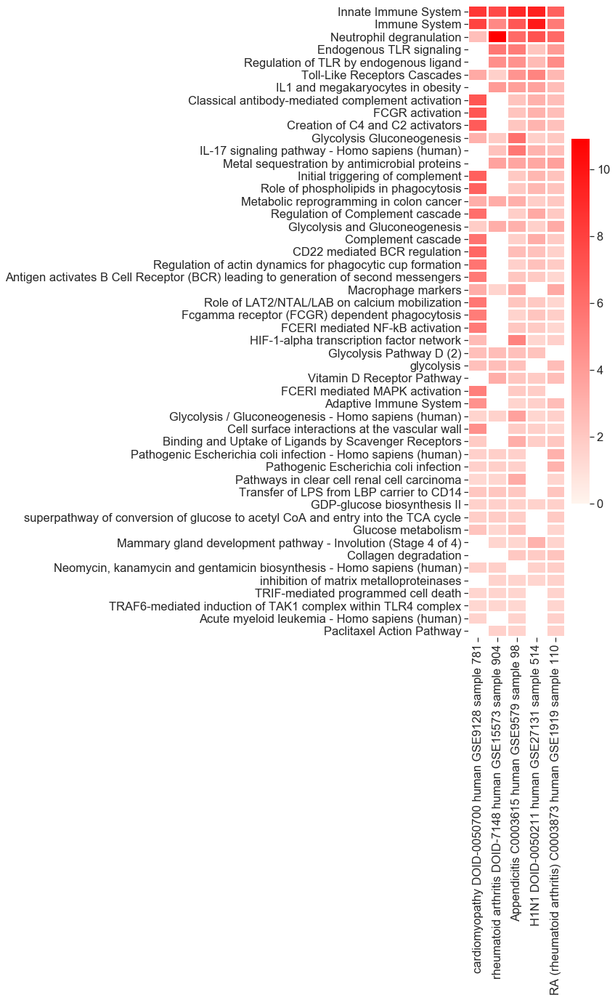

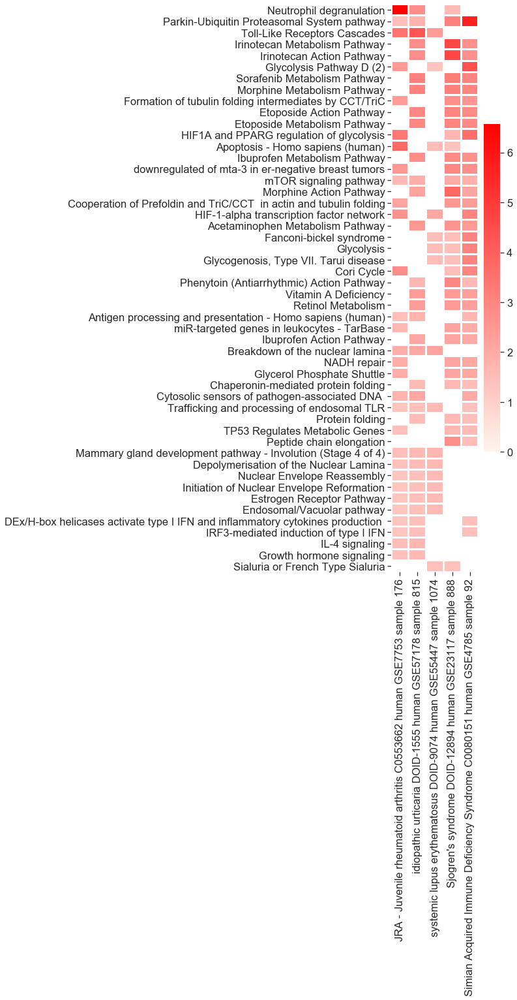

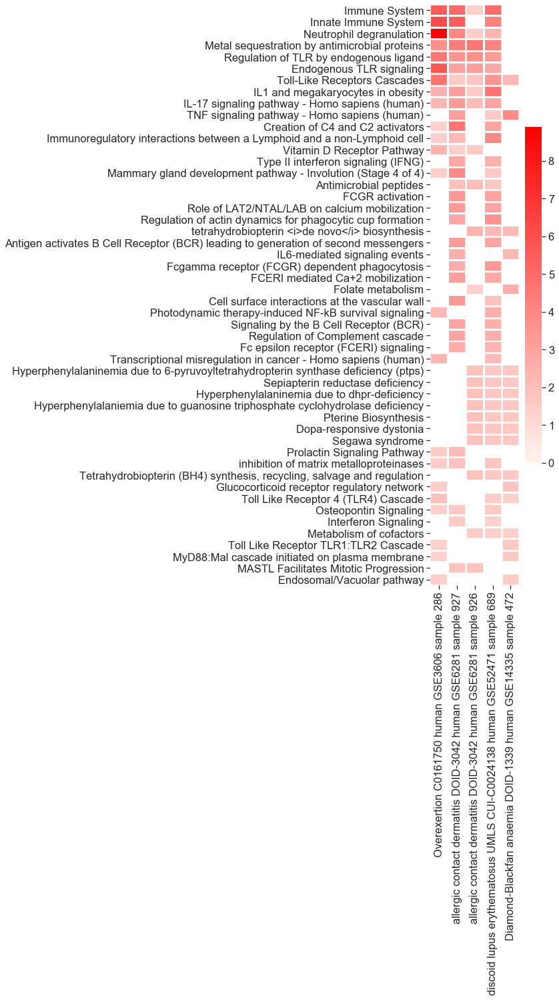

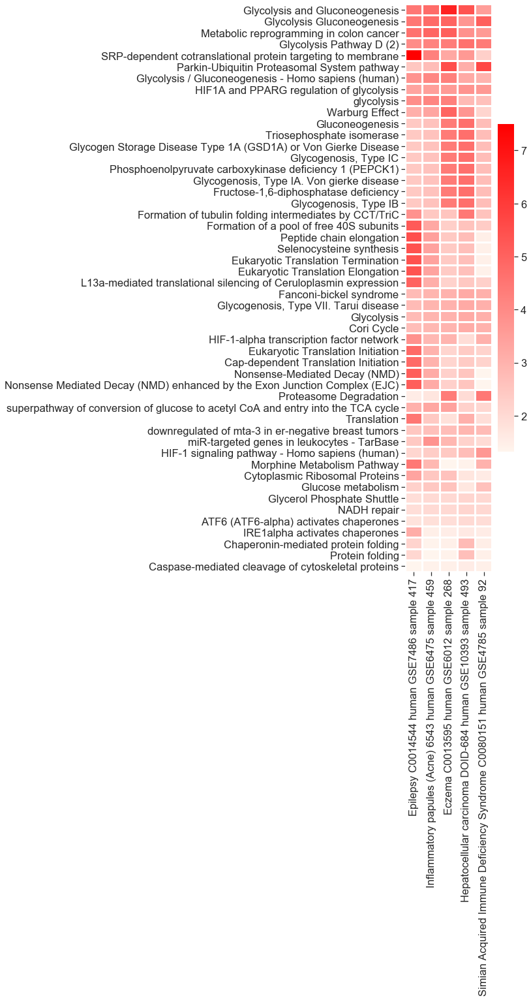

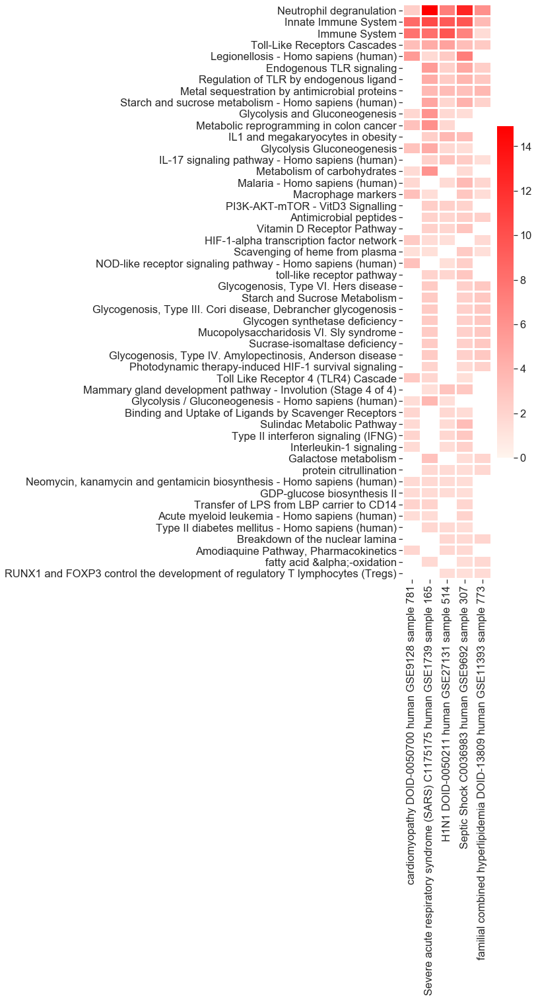

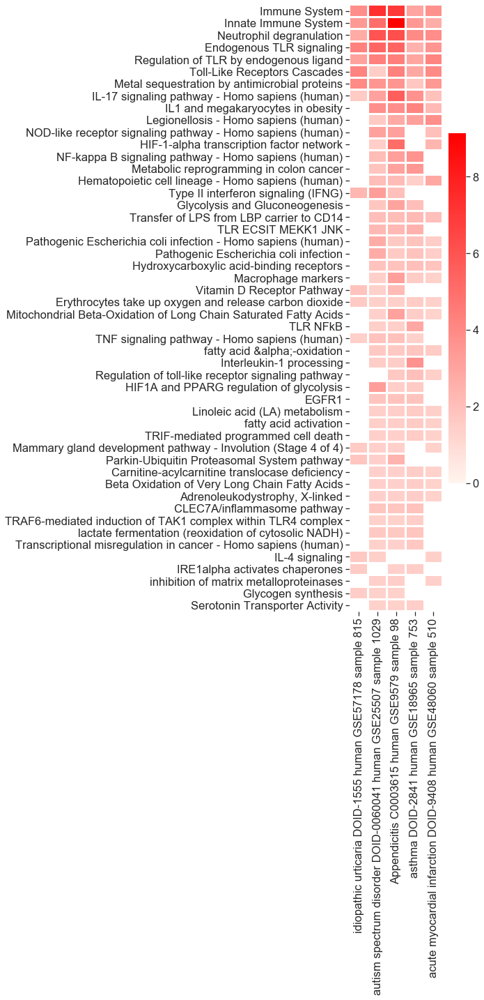

In [22]:
# filter each and write to file
topN = 5
c = 'U937'
for drug in validation_v2_drugs_U937:
    temp_pval_df = pd.read_csv(proj_path + 'PoC1_SA/' + '%s_%s_top%s_diseases_CPDB_enrichment_fisher_pval.csv' % 
                               (c, drug, topN), index_col=0)
    temp_OR_df = pd.read_csv(proj_path + 'PoC1_SA/' + '%s_%s_top%s_diseases_CPDB_enrichment_fisher_OR.csv' % 
                               (c, drug, topN), index_col=0)

    temp_top50_heatmap_df = -np.log10(temp_pval_df.loc[((temp_pval_df < 0.05) & (temp_OR_df > 1)).sum(axis=1).sort_values(ascending=False)[0:50].index])
    temp_top50_heatmap_df = temp_top50_heatmap_df.loc[temp_top50_heatmap_df.sum(axis=1).sort_values(ascending=False).index]
    fig = plt.figure()
    fig.set_size_inches(3, 16)
    sns.set(font_scale=1.5)
    cmap = colors.LinearSegmentedColormap.from_list("", ["seashell", "red"])
    with sns.axes_style('ticks'):
        ax = sns.heatmap(temp_top50_heatmap_df, mask=temp_top50_heatmap_df<-np.log10(0.05), cmap=cmap, linewidths=2, linecolor='white')    
        plt.xticks(rotation=90)
        plt.yticks(rotation=0)
        plt.savefig(proj_path + 'PoC1_SA/' + '%s_heatmap_%s_top%s_diseases_CPDB_enrichment_top50pathways.pdf' % (c, drug, topN), 
                    format='pdf', bbox_inches='tight')
        plt.show()

In [26]:
temp_condensed_rownames = ['Toll-Like Receptors Cascades', 'Innate Immune System',
                          'IL-17 signaling pathway - Homo sapiens (human)']

topN = 5
c = 'U937'
temp_master_df = pd.DataFrame(index=temp_condensed_rownames)
for drug in validation_v2_drugs_U937:
    temp_pval_df = pd.read_csv(proj_path + 'PoC1_SA/' +  '%s_%s_top%s_diseases_CPDB_enrichment_fisher_pval.csv' % (c, drug, topN), 
                               index_col=0)
    temp_master_df = pd.concat([temp_master_df, 
                                temp_pval_df.loc[temp_condensed_rownames].add_prefix(drug+'--')],
                               axis = 1)

temp_condensed_colnames = []
for d in ['tyrphostin-AG-1478', 'cyclosporin-a', 'simvastatin','neratinib', 'GW-405833', 'TG-101348']:
    temp_condensed_colnames.extend([str(s) for s in temp_master_df.columns[temp_master_df.columns.str.contains(d)]])

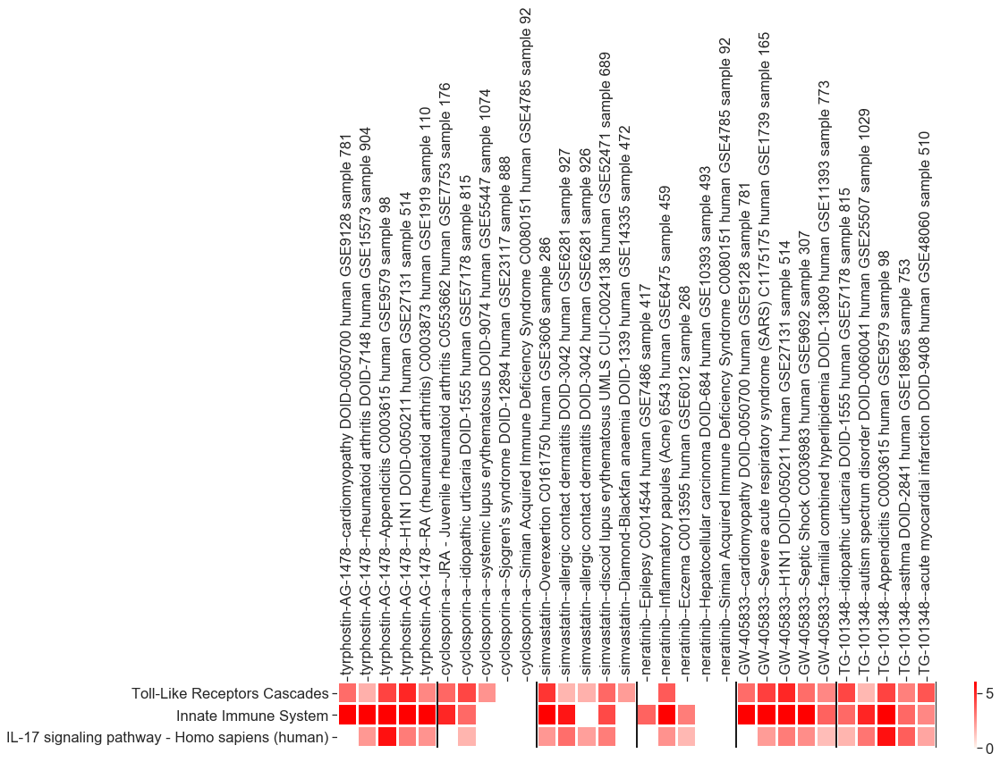

In [27]:
fig = plt.figure()
fig.set_size_inches(15, temp_master_df.shape[0]*0.45)
sns.set(font_scale=1.5)
cmap = colors.LinearSegmentedColormap.from_list("", ["seashell", "red"])
with sns.axes_style('ticks'):
    ax = sns.heatmap(-np.log10(temp_master_df[temp_condensed_colnames]), mask=-np.log10(temp_master_df[temp_condensed_colnames])<-np.log10(0.05), cmap=cmap, linewidths=2, linecolor='white', 
                    vmin=0, vmax=6)    
    ax.xaxis.tick_top() # x axis on top
    ax.xaxis.set_label_position('top')
    ax.vlines(np.arange(1, 10)*topN, *ax.get_ylim(), lw=2)
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
plt.savefig(proj_path + 'PoC1_SA/' +  'Fig7_condensed_heatmap.pdf', format='pdf', bbox_inches='tight')
plt.show()



## Combined network of candidate drug, top intermediary pathophenotypes, and their gene targets (Fig. 7D)

In [28]:
f = open(proj_path + 'PoC1_SA/' + 'Figure7_network_viz_nodes.csv', 'w')
f.write('Id\tLabel\tNodeType\tNodeSize\n')
f.write('Subclinical atherosclerosis\tSubclinical atherosclerosis\tInput_disease\t75\n')
for SA_gene in set(ehj2023_SA_005_up) | (ehj2023_SA_005_dn):
    f.write('%s\t%s\tInput_disease_genes\t40\n' % (SA_gene, SA_gene))
for d in ['tyrphostin-AG-1478', 'cyclosporin-a', 'simvastatin','neratinib', 'GW-405833', 'TG-101348']:
    f.write('%s\t%s\tDrug\t75\n' % (d, d))
    temp_quizc_targets = QUIZC_edgelist_df_dict['U937'][QUIZC_edgelist_df_dict['U937']['Drug']==d]['Target']
    for t in temp_quizc_targets:
        f.write('%s\t%s\tDrug_target\t40\n' % (t, t))
    temp_intermediary_disaeses =  [s.split('--')[1] for s in temp_master_df.columns[temp_master_df.columns.str.contains(d)]]
    for d_i in temp_intermediary_disaeses:
        f.write('%s\t%s\tIntermediary_disease\t75\n' % (d_i, d_i))
        temp_intermediary_disease_genes = set(Enrichr_GEO_disease_human_up[d_i])| set(Enrichr_GEO_disease_human_dn[d_i])
        for d_i_g in temp_intermediary_disease_genes:
            f.write('%s\t%s\tIntermediary_disease_gene\t40\n' % (d_i_g, d_i_g))           
f.close()

f = open(proj_path + 'PoC1_SA/' + 'Figure7_network_viz_edges.csv', 'w')
f.write('Source\tTarget\tType\tEdgeType\tEffect\tEdgeColor\tWeight\n')
for SA_gene in set(ehj2023_SA_005_up):
    f.write('Subclinical atherosclerosis\t%s\tUndirected\tInput_disease-gene\tUp\tRed\t10\n' % SA_gene)
for SA_gene in set(ehj2023_SA_005_dn):
    f.write('Subclinical atherosclerosis\t%s\tUndirected\tInput_disease-gene\tDown\tBlue\t10\n' % SA_gene)   
    
for d in ['tyrphostin-AG-1478', 'cyclosporin-a', 'simvastatin','neratinib', 'GW-405833', 'TG-101348']:
    temp_quizc_targets_df = QUIZC_edgelist_df_dict['U937'][QUIZC_edgelist_df_dict['U937']['Drug']==d]
    for (e1, e2, e3) in temp_quizc_targets_df.values:
        f.write('%s\t%s\tUndirected\tQUIZC_drug_target\t%s\tRed\t10\n' % (e1, e2, e3))
    temp_intermediary_disaeses =  [s.split('--')[1] for s in temp_master_df.columns[temp_master_df.columns.str.contains(d)]]
    for d_i in temp_intermediary_disaeses:
        temp_intermediary_disease_genes = set(Enrichr_GEO_disease_human_up[d_i])| set(Enrichr_GEO_disease_human_dn[d_i])
        for d_i_g in set(Enrichr_GEO_disease_human_up[d_i]):
            f.write('%s\t%s\tUndirected\tIntermediary_disease-intermediary_gene\tUp\tRed\t10\n' % (d_i, d_i_g))   
        for d_i_g in set(Enrichr_GEO_disease_human_dn[d_i]):
            f.write('%s\t%s\tUndirected\tIntermediary_disease-intermediary_gene\tDown\tBlue\t10\n' % (d_i, d_i_g))    
f.close()

## Centrality of pathway vs. non-pathway genes in the combined network (Fig. 7E; Supp. Fig. 25)

In [31]:
fig7_full_netstats = pd.read_csv(proj_path + 'PoC1_SA/' + 'Fig7_network_full.csv')

<ipython-input-32-7ae0a749c22f>:69: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


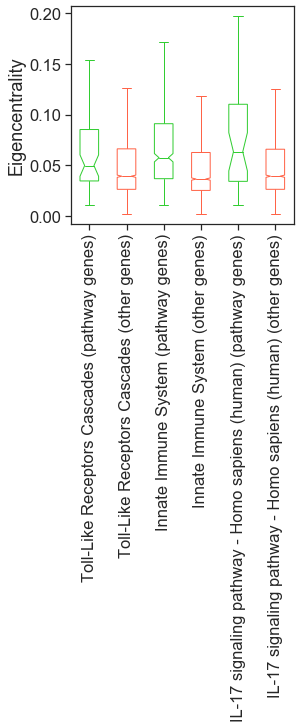

In [32]:
sns.set(font_scale=1.5)
fig = plt.figure()
fig.set_size_inches(4, 4)
with sns.axes_style('ticks'):
    box1 = plt.boxplot(fig7_full_netstats[fig7_full_netstats['Id'].isin(CPDB_all_paths[CPDB_all_paths['pathway'] == 
                                             'Toll-Like Receptors Cascades']['hgnc_symbol_ids']\
                                                                .str.split(',').values[0])]['eigencentrality'], widths=0.5,
                       positions=[1], notch=True, patch_artist=True, showfliers=False)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box1[item], color='limegreen')
    plt.setp(box1["boxes"], facecolor='white')
    plt.setp(box1["fliers"], markeredgecolor='limegreen')

    box2 = plt.boxplot(fig7_full_netstats[~fig7_full_netstats['Id'].isin(CPDB_all_paths[CPDB_all_paths['pathway'] == 
                                             'Toll-Like Receptors Cascades']['hgnc_symbol_ids']\
                                                                .str.split(',').values[0])]['eigencentrality'], widths=0.5,
                       positions=[2], notch=True, patch_artist=True, showfliers=False)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box2[item], color='tomato')
    plt.setp(box2["boxes"], facecolor='white')
    plt.setp(box2["fliers"], markeredgecolor='tomato')
    
    
    box3 = plt.boxplot(fig7_full_netstats[fig7_full_netstats['Id'].isin(CPDB_all_paths[CPDB_all_paths['pathway'] == 
                                             'Innate Immune System']['hgnc_symbol_ids']\
                                                                .str.split(',').values[0])]['eigencentrality'], widths=0.5,
                       positions=[3], notch=True, patch_artist=True, showfliers=False)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box3[item], color='limegreen')
    plt.setp(box3["boxes"], facecolor='white')
    plt.setp(box3["fliers"], markeredgecolor='limegreen')

    box4 = plt.boxplot(fig7_full_netstats[~fig7_full_netstats['Id'].isin(CPDB_all_paths[CPDB_all_paths['pathway'] == 
                                             'Innate Immune System']['hgnc_symbol_ids']\
                                                                .str.split(',').values[0])]['eigencentrality'], widths=0.5,
                       positions=[4], notch=True, patch_artist=True, showfliers=False)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box4[item], color='tomato')
    plt.setp(box4["boxes"], facecolor='white')
    plt.setp(box4["fliers"], markeredgecolor='tomato')
        
    box5 = plt.boxplot(fig7_full_netstats[fig7_full_netstats['Id'].isin(CPDB_all_paths[CPDB_all_paths['pathway'] == 
                                             'IL-17 signaling pathway - Homo sapiens (human)']['hgnc_symbol_ids']\
                                                                .str.split(',').values[0])]['eigencentrality'], widths=0.5,
                       positions=[5], notch=True, patch_artist=True, showfliers=False)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box5[item], color='limegreen')
    plt.setp(box5["boxes"], facecolor='white')
    plt.setp(box5["fliers"], markeredgecolor='limegreen')

    box6 = plt.boxplot(fig7_full_netstats[~fig7_full_netstats['Id'].isin(CPDB_all_paths[CPDB_all_paths['pathway'] == 
                                             'IL-17 signaling pathway - Homo sapiens (human)']['hgnc_symbol_ids']\
                                                                .str.split(',').values[0])]['eigencentrality'], widths=0.5,
                       positions=[6], notch=True, patch_artist=True, showfliers=False)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box6[item], color='tomato')
    plt.setp(box6["boxes"], facecolor='white')
    plt.setp(box6["fliers"], markeredgecolor='tomato')
   
    plt.xticks([1, 2, 3, 4, 5, 6], ['Toll-Like Receptors Cascades (pathway genes)', 
                                                 'Toll-Like Receptors Cascades (other genes)',
                                                'Innate Immune System (pathway genes)', 
                                                 'Innate Immune System (other genes)',
                                                 'IL-17 signaling pathway - Homo sapiens (human) (pathway genes)', 
                                                 'IL-17 signaling pathway - Homo sapiens (human) (other genes)'])
    #plt.ylim(-100, 2500)
    plt.ylabel('Eigencentrality')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.savefig(proj_path + 'PoC1_SA/' + 'Pathway_genes_eigenvector.pdf', format='pdf', bbox_inches='tight')
    plt.show()

<ipython-input-33-8ba35679a089>:71: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


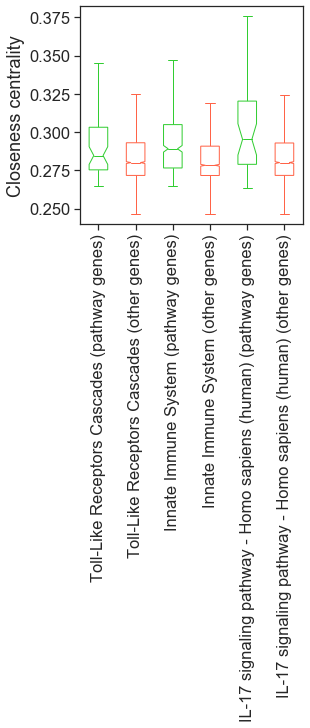

In [33]:
sns.set(font_scale=1.5)
fig = plt.figure()
fig.set_size_inches(4, 4)
with sns.axes_style('ticks'):
    box1 = plt.boxplot(fig7_full_netstats[fig7_full_netstats['Id'].isin(CPDB_all_paths[CPDB_all_paths['pathway'] == 
                                             'Toll-Like Receptors Cascades']['hgnc_symbol_ids']\
                                                                .str.split(',').values[0])]['closnesscentrality'], widths=0.5,
                       positions=[1], notch=True, patch_artist=True, showfliers=False)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box1[item], color='limegreen')
    plt.setp(box1["boxes"], facecolor='white')
    plt.setp(box1["fliers"], markeredgecolor='limegreen')

    box2 = plt.boxplot(fig7_full_netstats[~fig7_full_netstats['Id'].isin(CPDB_all_paths[CPDB_all_paths['pathway'] == 
                                             'Toll-Like Receptors Cascades']['hgnc_symbol_ids']\
                                                                .str.split(',').values[0])]['closnesscentrality'], widths=0.5,
                       positions=[2], notch=True, patch_artist=True, showfliers=False)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box2[item], color='tomato')
    plt.setp(box2["boxes"], facecolor='white')
    plt.setp(box2["fliers"], markeredgecolor='tomato')
    
    
    box3 = plt.boxplot(fig7_full_netstats[fig7_full_netstats['Id'].isin(CPDB_all_paths[CPDB_all_paths['pathway'] == 
                                             'Innate Immune System']['hgnc_symbol_ids']\
                                                                .str.split(',').values[0])]['closnesscentrality'], widths=0.5,
                       positions=[3], notch=True, patch_artist=True, showfliers=False)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box3[item], color='limegreen')
    plt.setp(box3["boxes"], facecolor='white')
    plt.setp(box3["fliers"], markeredgecolor='limegreen')

    box4 = plt.boxplot(fig7_full_netstats[~fig7_full_netstats['Id'].isin(CPDB_all_paths[CPDB_all_paths['pathway'] == 
                                             'Innate Immune System']['hgnc_symbol_ids']\
                                                                .str.split(',').values[0])]['closnesscentrality'], widths=0.5,
                       positions=[4], notch=True, patch_artist=True, showfliers=False)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box4[item], color='tomato')
    plt.setp(box4["boxes"], facecolor='white')
    plt.setp(box4["fliers"], markeredgecolor='tomato')

    
    box5 = plt.boxplot(fig7_full_netstats[fig7_full_netstats['Id'].isin(CPDB_all_paths[CPDB_all_paths['pathway'] == 
                                             'IL-17 signaling pathway - Homo sapiens (human)']['hgnc_symbol_ids']\
                                                                .str.split(',').values[0])]['closnesscentrality'], widths=0.5,
                       positions=[5], notch=True, patch_artist=True, showfliers=False)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box5[item], color='limegreen')
    plt.setp(box5["boxes"], facecolor='white')
    plt.setp(box5["fliers"], markeredgecolor='limegreen')

    box6 = plt.boxplot(fig7_full_netstats[~fig7_full_netstats['Id'].isin(CPDB_all_paths[CPDB_all_paths['pathway'] == 
                                             'IL-17 signaling pathway - Homo sapiens (human)']['hgnc_symbol_ids']\
                                                                .str.split(',').values[0])]['closnesscentrality'], widths=0.5,
                       positions=[6], notch=True, patch_artist=True, showfliers=False)
    for item in ['boxes', 'whiskers', 'fliers', 'medians', 'caps']:
            plt.setp(box6[item], color='tomato')
    plt.setp(box6["boxes"], facecolor='white')
    plt.setp(box6["fliers"], markeredgecolor='tomato')

   
    plt.xticks([1, 2, 3, 4, 5, 6], ['Toll-Like Receptors Cascades (pathway genes)', 
                                                 'Toll-Like Receptors Cascades (other genes)',
                                                'Innate Immune System (pathway genes)', 
                                                 'Innate Immune System (other genes)',
                                                 'IL-17 signaling pathway - Homo sapiens (human) (pathway genes)', 
                                                 'IL-17 signaling pathway - Homo sapiens (human) (other genes)'])
    #plt.ylim(-100, 2500)
    plt.ylabel('Closeness centrality')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.savefig(proj_path + 'PoC1_SA/' + 'Pathway_genes_closeness.pdf', format='pdf', bbox_inches='tight')
    plt.show()

## Summary of in vitro results (Fig. 7F)

In [35]:
U937_data = pd.read_csv(proj_path + 'PoC1_SA/' + 'Sarvesh_data_U937_ctrl.csv', skiprows=1, index_col=0)

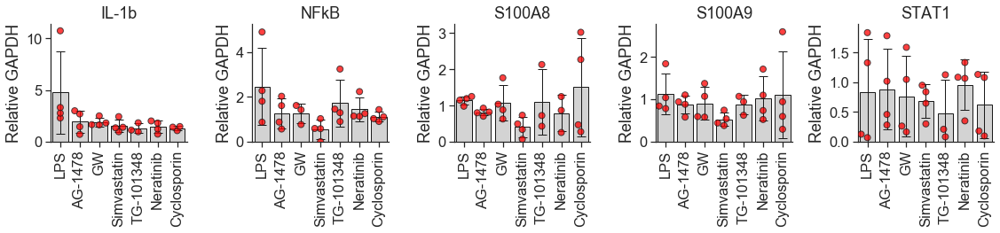

In [36]:
fig = plt.figure()
fig.set_size_inches(16, 4)
sns.set(font_scale=1.5)
with sns.axes_style("ticks"):
    
    for n, i in enumerate(['IL-1b', 'NFkB', 'S100A8', 'S100A9', 'STAT1']):

        temp_cols = [i + '_%s' % x for x in np.arange(1, 5)]
        temp_df = U937_data[temp_cols]
        plt.subplot(1, 5, n+1)
        plt.title(i)
        plt.bar(temp_df.index[1:], temp_df.loc[temp_df.index[1:]].mean(axis=1),  color='lightgrey', edgecolor='k')
        plt.errorbar(temp_df.index[1:], temp_df.loc[temp_df.index[1:]].mean(axis=1), yerr=temp_df.loc[temp_df.index[1:]].std(axis=1), 
                     color='k', capsize=5, elinewidth=1, markeredgewidth=1, ls='none')
        sns.swarmplot(data=temp_df.loc[temp_df.index[1:]].T, color='red', alpha=0.75, size=7, edgecolor='k', linewidth=1)
        plt.xticks(rotation=90)
        plt.ylabel('Relative GAPDH')
        plt.ylim(ymin=0)
        sns.despine()
        plt.tight_layout()
    
    plt.savefig(proj_path + 'PoC1_SA/' + 'Fig7A_SA_invitro.pdf', format='pdf', bbox_inches='tight')
    plt.show()

## Proof-of-concept 2: Vein graft failure

In [37]:
### Parse vein graft data from Decano, Julius L., et al. "Systems approach to discovery of therapeutic targets for vein graft disease: 
### PPARα pivotally regulates metabolism, activation, and heterogeneity of macrophages and lesion development." 
### Circulation 143.25 (2021): 2454-2470.

In [38]:
mouse2human = pd.read_csv(proj_external_data_path + 'MGI/HMD_HumanPhenotype.rpt.txt', sep='\t', header=None)

In [39]:
VG_timecourse = pd.read_csv(proj_external_data_path + 'Decano_Circulation/Timecourse proteomics Vein graft _TCrs_VI-LHL-JLD_FDR005.csv')
VG_timecourse = pd.merge(VG_timecourse, mouse2human, left_on='Gene Name', right_on = 2)

In [40]:
day1_FC2_up = set(VG_timecourse[(VG_timecourse['FC (Day1)'] >= 2.0)][0])
day1_FC2_dn = set(VG_timecourse[(VG_timecourse['FC (Day1)'] <= 0.5)][0])
day3_FC2_up = set(VG_timecourse[(VG_timecourse['FC (Day3)'] >= 2.0)][0])
day3_FC2_dn = set(VG_timecourse[(VG_timecourse['FC (Day3)'] <= 0.5)][0])
wk2_FC2_up = set(VG_timecourse[(VG_timecourse['FC (Week2)'] >= 2.0)][0])
wk2_FC2_dn = set(VG_timecourse[(VG_timecourse['FC (Week2)'] <= 0.5)][0])
wk4_FC2_up = set(VG_timecourse[(VG_timecourse['FC (Week4)'] >= 2.0)][0])
wk4_FC2_dn = set(VG_timecourse[(VG_timecourse['FC (Week4)'] <= 0.5)][0])

VG_early_up = day1_FC2_up | day3_FC2_up
VG_early_dn = day1_FC2_dn | day3_FC2_dn
VG_late_up = wk2_FC2_up | wk4_FC2_up
VG_late_dn = wk2_FC2_dn | wk4_FC2_dn

In [41]:
f = open(proj_path + 'PoC2_VG/VG_early_up.csv', 'w')
for gene in sorted(list(VG_early_up)):
    f.write('%s\n' % gene)
f.close()
f = open(proj_path + 'PoC2_VG/VG_early_dn.csv', 'w')
for gene in sorted(list(VG_early_dn)):
    f.write('%s\n' % gene)
f.close()
f = open(proj_path + 'PoC2_VG/VG_late_up.csv', 'w')
for gene in sorted(list(VG_late_up)):
    f.write('%s\n' % gene)
f.close()
f = open(proj_path + 'PoC2_VG/VG_late_dn.csv', 'w')
for gene in sorted(list(VG_late_dn)):
    f.write('%s\n' % gene)
f.close()

### PACOS overview of the validation drugs (Figure 7A)

In [42]:
pcp_perturbation_df_dict = PCP_perturbation_alldrugs(QUIZC_alldrugs, QUIZC_allcells, QUIZC_edgelist_df_dict, 
                                                     Enrichr_GEO_disease_human_up, Enrichr_GEO_disease_human_dn,
                                                     input_paths_dict['benchmark_path'], method_name='QUIZ-C', return_output=True) 

Reading PCPs for all perturbations...


In [43]:
validaton_drugs = ['rosiglitazone', 'GW-7647', 'estriol', 'sunitinib', 'pravastatin', 'dephostatin', 'SB-203580', 'AG-490']
validation_drug_cell_dict = {'rosiglitazone': 'NCIH2073', 'GW-7647': 'ASC', 'estriol': 'ASC', 'sunitinib': 'ASC', 'pravastatin': 'ASC', 
                             'dephostatin': 'ASC', 'SB-203580': 'ASC', 'AG-490': 'ASC'}
validation_drug_geneset_dict_up = {'rosiglitazone': VG_early_up, 'GW-7647': VG_late_up, 'estriol': VG_late_up, 'sunitinib': VG_late_up, 
                                   'pravastatin': VG_late_up, 'dephostatin': VG_late_up, 'SB-203580': VG_late_up, 'AG-490': VG_late_up}
validation_drug_geneset_dict_dn = {'rosiglitazone': VG_early_dn, 'GW-7647': VG_late_dn, 'estriol': VG_late_dn, 'sunitinib': VG_late_dn, 
                                   'pravastatin': VG_late_dn, 'dephostatin': VG_late_dn, 'SB-203580': VG_late_dn, 'AG-490': VG_late_dn}
validation_drug_geneset_name = {'rosiglitazone': 'VG_early', 'GW-7647': 'VG_late', 'estriol': 'VG_late', 'sunitinib': 'VG_late', 
                                   'pravastatin': 'VG_late', 'dephostatin': 'VG_late', 'SB-203580': 'VG_late', 'AG-490': 'VG_late'}
validation_inflammatory = ['CCL2', 'IL6', 'CCL7', 'RELA', 'WARS', 'GBP1', 'RELB', 'GBP4', 'CCL5', 'CCL8', 'S100A10']
validation_antiinflammatory = ['APOE', 'CHI3L1', 'ARG1', 'PPARA', 'CCL22']

SpearmanrResult(correlation=-0.5122675027529634, pvalue=0.04248553439768148)
SpearmanrResult(correlation=-0.2599862633161545, pvalue=3.042523101492266e-10)
SpearmanrResult(correlation=-0.5753565618943244, pvalue=0.0013592427977389293)
SpearmanrResult(correlation=-0.19521297048407873, pvalue=0.00026437464041065165)
SpearmanrResult(correlation=-0.31012861747354314, pvalue=0.030110011101295388)
SpearmanrResult(correlation=-0.44134324228160254, pvalue=0.02400529118359139)
SpearmanrResult(correlation=-0.24888822755819556, pvalue=1.2905416290952694e-05)
SpearmanrResult(correlation=-0.09591499731850778, pvalue=0.08821222199836957)


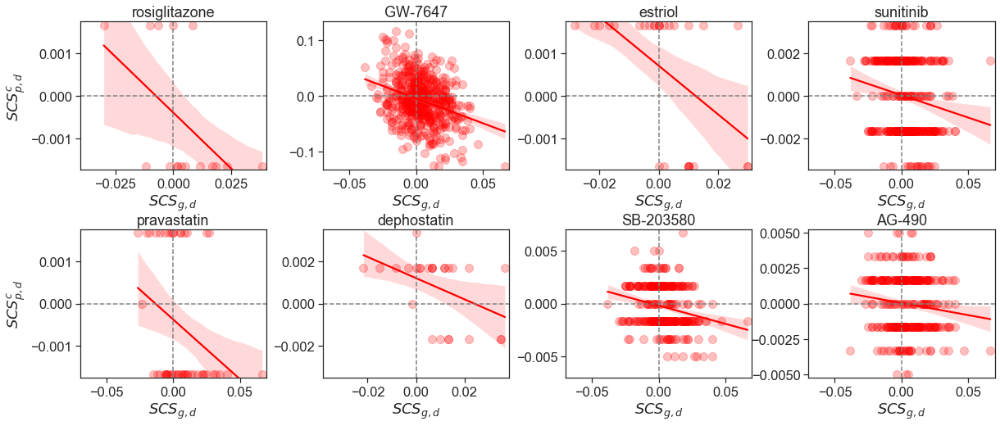

In [44]:
fig = plt.figure()
fig.set_size_inches(20, 8)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):
    
    for i, drug in enumerate(validaton_drugs):
        
        c = validation_drug_cell_dict[drug]
        geneset_name = validation_drug_geneset_name[drug]
        pcp_geneset_df = PCP_geneset(validation_drug_geneset_dict_up[drug], validation_drug_geneset_dict_dn[drug], 
                                     Enrichr_GEO_disease_human_up, Enrichr_GEO_disease_human_dn, geneset_name=geneset_name)
              
        temp_common_diseases = set(pcp_geneset_df.loc[geneset_name][~pd.isnull(pcp_geneset_df.loc[geneset_name])].index) &\
                                        set(pcp_perturbation_df_dict[drug].loc[c][~pd.isnull(pcp_perturbation_df_dict[drug].loc[c])].index)
        
        print(st.spearmanr(pcp_geneset_df.loc[geneset_name][temp_common_diseases], pcp_perturbation_df_dict[drug].loc[c][temp_common_diseases]))
                
        plt.subplot(2, 4, i+1)
        plt.title(drug)
        sns.regplot(pcp_geneset_df.loc[geneset_name][temp_common_diseases].values, 
                    pcp_perturbation_df_dict[drug].loc[c][temp_common_diseases].values,
                   scatter_kws={'s': 100, 'color': 'red', 'alpha': 0.25}, line_kws={'color': 'red'})
        ymax = max(abs(min(pcp_perturbation_df_dict[drug].loc[c][temp_common_diseases].values)), 
                   abs(max(pcp_perturbation_df_dict[drug].loc[c][temp_common_diseases].values)))
        xmax = max(abs(min(pcp_geneset_df.loc[geneset_name][temp_common_diseases].values)), 
                   abs(max(pcp_geneset_df.loc[geneset_name][temp_common_diseases].values)))
        scaling_f = 1/20.0
        plt.plot([0, 0], [-(ymax+ymax*scaling_f), (ymax+ymax*scaling_f)], 'grey', linestyle='--')
        plt.plot([-(xmax+xmax*scaling_f), (xmax+xmax*scaling_f)], [0, 0], 'grey', linestyle='--')
        plt.ylim(-(ymax+ymax*scaling_f), (ymax+ymax*scaling_f))
        plt.xlim(-(xmax+xmax*scaling_f), (xmax+xmax*scaling_f))
        #sns.despine()
        
        if i%4== 0: 
            plt.ylabel(r'$SCS^{c}_{p, d}$') 
        else: 
            plt.ylabel('')
        plt.xlabel(r'$SCS_{g, d}$')
plt.subplots_adjust(hspace=0.4, wspace=0.3)
#plt.tight_layout()
plt.savefig(proj_path + 'PoC2_VG/' + 'VG_validation_drugs_PACOS_overview.pdf', format='pdf')   
plt.show()

### Pathway enrichment of the top diseases with the most similar signatures to vein graft disease (Figure 7B)

In [45]:
CPDB_all_paths = pd.read_csv(proj_external_data_path + 'ConsensusPathDB/CPDB_pathways_genes.tab', sep='\t')
CPDB_all_paths_dict = {}
CPDB_allgenes = set()
for p in CPDB_all_paths['pathway']:
    CPDB_all_paths_dict[p] = CPDB_all_paths[CPDB_all_paths['pathway']==p]['hgnc_symbol_ids'].values[0].split(',')
    CPDB_allgenes.update(set(CPDB_all_paths[CPDB_all_paths['pathway']==p]['hgnc_symbol_ids'].values[0].split(',')))

In [48]:
topN = 10
drug_topN_diseases = {}
for i, drug in enumerate(validaton_drugs):

    c = validation_drug_cell_dict[drug]
    geneset_name = validation_drug_geneset_name[drug]
    pcp_geneset_df = PCP_geneset(validation_drug_geneset_dict_up[drug], validation_drug_geneset_dict_dn[drug], 
                                 Enrichr_GEO_disease_human_up, Enrichr_GEO_disease_human_dn, geneset_name=geneset_name)
    temp_common_diseases = set(pcp_geneset_df.loc[geneset_name][~pd.isnull(pcp_geneset_df.loc[geneset_name])].index) &\
                            set(pcp_perturbation_df_dict[drug].loc[c][~pd.isnull(pcp_perturbation_df_dict[drug].loc[c])].index)
    
    drug_topN_diseases[drug] = (pcp_geneset_df.loc[geneset_name][temp_common_diseases] * 
                                 pcp_perturbation_df_dict[drug].loc[c][temp_common_diseases]).sort_values(ascending=True)[0:topN].index.values
    
all_topN_diseases = functools.reduce(set.union, (set(val) for val in drug_topN_diseases.values()))
print(len(all_topN_diseases))

VG_late_overlap = {}
for dis in all_topN_diseases:
    VG_late_overlap[dis] = ((wk2_FC2_up | wk4_FC2_up | wk2_FC2_dn | wk4_FC2_dn) & 
                            (set(Enrichr_GEO_disease_human_up[dis]) | set(Enrichr_GEO_disease_human_dn[dis])))
    
overlap_df, fisher_OR_df, fisher_pval_df, fisher_adjpval_df = fisher_pathway_enrichment(CPDB_all_paths_dict, VG_late_overlap, CPDB_allgenes, 
                                                                                  method='fdr_bh',
                                                            outfile=proj_path + 'PoC2_VG/' + 'all_top%s_diseases_CPDB_enrichment' % topN)

64


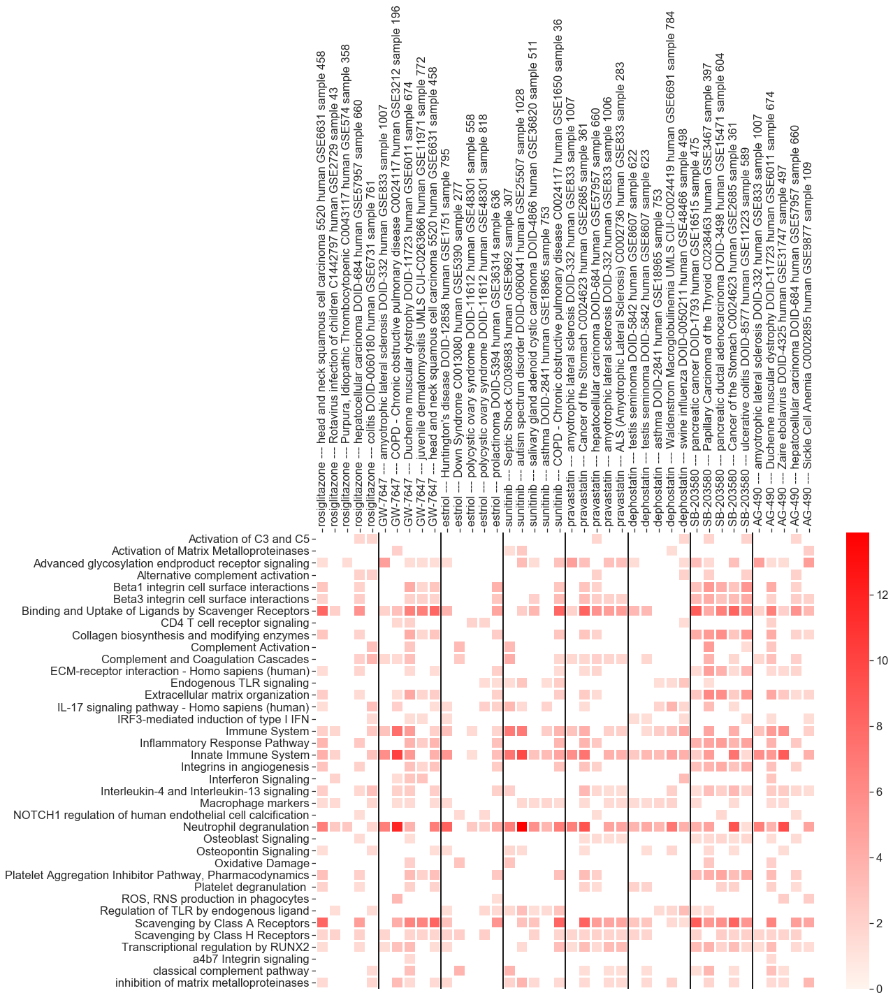

In [49]:
topN = 5
drug_topN_diseases = {}
for i, drug in enumerate(validaton_drugs):

    c = validation_drug_cell_dict[drug]
    geneset_name = validation_drug_geneset_name[drug]
    pcp_geneset_df = PCP_geneset(validation_drug_geneset_dict_up[drug], validation_drug_geneset_dict_dn[drug], 
                                 Enrichr_GEO_disease_human_up, Enrichr_GEO_disease_human_dn, geneset_name=geneset_name) 
    temp_common_diseases = set(pcp_geneset_df.loc[geneset_name][~pd.isnull(pcp_geneset_df.loc[geneset_name])].index) &\
                            set(pcp_perturbation_df_dict[drug].loc[c][~pd.isnull(pcp_perturbation_df_dict[drug].loc[c])].index)
    drug_topN_diseases[drug] = (pcp_geneset_df.loc[geneset_name][temp_common_diseases] * 
                                 pcp_perturbation_df_dict[drug].loc[c][temp_common_diseases]).sort_values(ascending=True)[0:topN].index.values

select_pathways = ['Neutrophil degranulation', 'Innate Immune System', 'Binding and Uptake of Ligands by Scavenger Receptors',
                  'Scavenging by Class A Receptors', 'Immune System', 'inhibition of matrix metalloproteinases', 
                   'Interleukin-4 and Interleukin-13 signaling', 'Scavenging by Class H Receptors', 'Transcriptional regulation by RUNX2',
                   'Advanced glycosylation endproduct receptor signaling', 'Macrophage markers', 'Regulation of TLR by endogenous ligand',
                   'Integrins in angiogenesis', 'IL-17 signaling pathway - Homo sapiens (human)', 
                   'Inflammatory Response Pathway', 'Extracellular matrix organization', 'Beta3 integrin cell surface interactions',
                  'Beta1 integrin cell surface interactions', 'Platelet Aggregation Inhibitor Pathway, Pharmacodynamics', 
                  'Collagen biosynthesis and modifying enzymes', 'Complement and Coagulation Cascades', 
                  'ECM-receptor interaction - Homo sapiens (human)', 'Endogenous TLR signaling', 'classical complement pathway',
                  'Osteoblast Signaling', 'Osteopontin Signaling', 'Interferon Signaling', 'Complement Activation',
                  'Activation of Matrix Metalloproteinases', 'IRF3-mediated induction of type I IFN', 
                  'Platelet degranulation ', 'a4b7 Integrin signaling', 'ROS, RNS production in phagocytes',
                   'NOTCH1 regulation of human endothelial cell calcification',
                  'CD4 T cell receptor signaling', 'Activation of C3 and C5', 'Oxidative Damage', 
                  'Alternative complement activation']


pathway_heatmap = pd.DataFrame(0.0, index=sorted(select_pathways), 
                               columns=['%s --- %s' % (i, j) for d in drug_topN_diseases.keys() for i, j in product([d], drug_topN_diseases[d])])

for d in pathway_heatmap.columns:
    for p in pathway_heatmap.index:
        pathway_heatmap.at[p, d] = -np.log10(fisher_pval_df.at[p, d.split(' --- ')[1]])
        
fig = plt.figure()
fig.set_size_inches(16, 12)
sns.set(font_scale=1.5)
cmap = colors.LinearSegmentedColormap.from_list("", ["seashell", "red"])
with sns.axes_style('ticks'):
    ax = sns.heatmap(pathway_heatmap, mask=pathway_heatmap<-np.log10(0.05), cmap=cmap, linewidths=2, linecolor='white')    
    ax.xaxis.tick_top() # x axis on top
    ax.xaxis.set_label_position('top')
    ax.vlines(np.arange(1, 8)*topN, *ax.get_ylim(), lw=2)
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
plt.savefig(proj_path + 'PoC2_VG/' + 'heatmap_all_top%s_diseases_CPDB_enrichment_selectpathways_pval_extended.pdf' % topN, 
            format='pdf', bbox_inches='tight')
plt.show()

### In vitro validation summary (Figure 7C)

In [50]:
inflammation_panel = ['CCL2', 'CCL5', 'CCL7', 'CCL8', 'GBP1', 'GBP4', 'IL6', 'RELA', 'RELB', 'S100A10', 'WARS', 
                      'APOE', 'ARG1', 'CCL22', 'CHI3L1', 'PPARA']

fig7c = pd.DataFrame(index=np.concatenate([['M(-)', 'M(LPS)'], validaton_drugs]), 
                     columns=['%s_%s' % (i, j) for i, j in product(inflammation_panel, np.arange(1, 4))])
fig7c_mean_df = pd.DataFrame(index=np.concatenate([['M(-)', 'M(LPS)'], validaton_drugs]), columns=inflammation_panel)
fig7c_pval_df = pd.DataFrame(index=np.concatenate([['M(-)', 'M(LPS)'], validaton_drugs]), columns=inflammation_panel)

for i in inflammation_panel:
    temp_csv = pd.read_csv(proj_path + 'PoC2_VG/' + 'Pathopticon_invitro_data/%s.csv' % i)
    temp_csv = temp_csv.rename(columns={'GW': 'GW-7647', 'ROS': 'rosiglitazone', 'Estriol': 'estriol', 'Sunitinib': 'sunitinib', 
                                        'Pravastatin': 'pravastatin', 'Dephostatin': 'dephostatin', 'SB': 'SB-203580', 'AG490': 'AG-490'})
    
    for j in fig7c_mean_df.index:
        fig7c_mean_df.at[j, i] = temp_csv.mean()[j]

    fig7c_pval_df.at['M(LPS)', i]= np.round(st.mannwhitneyu(temp_csv['M(-)'][~pd.isnull(temp_csv['M(-)'])], 
                                                            temp_csv['M(LPS)'][~pd.isnull(temp_csv['M(LPS)'])])[1], 3)        
        
    for drug in validaton_drugs:        
        fig7c_pval_df.at[drug, i] = np.round(st.mannwhitneyu(temp_csv['M(LPS)'][~pd.isnull(temp_csv['M(LPS)'])], 
                                                 temp_csv[drug][~pd.isnull(temp_csv[drug])])[1], 3)
    
    
    
    if st.mannwhitneyu(temp_csv['M(-)'][~pd.isnull(temp_csv['M(-)'])], temp_csv['M(LPS)'][~pd.isnull(temp_csv['M(LPS)'])])[1] < 0.05:
        print('***', i, 'ctrl', 
              st.mannwhitneyu(temp_csv['M(-)'][~pd.isnull(temp_csv['M(-)'])], temp_csv['M(LPS)'][~pd.isnull(temp_csv['M(LPS)'])])[1])
    else:
        print(i, 'ctrl', 
              st.mannwhitneyu(temp_csv['M(-)'][~pd.isnull(temp_csv['M(-)'])], temp_csv['M(LPS)'][~pd.isnull(temp_csv['M(LPS)'])])[1])        
    for drug in validaton_drugs:
        if st.mannwhitneyu(temp_csv['M(LPS)'][~pd.isnull(temp_csv['M(LPS)'])], temp_csv[drug][~pd.isnull(temp_csv[drug])])[1] < 0.05:
            print('***', i, 
                  drug, st.mannwhitneyu(temp_csv['M(LPS)'][~pd.isnull(temp_csv['M(LPS)'])], temp_csv[drug][~pd.isnull(temp_csv[drug])])[1])
        else:
            print(i, drug, st.mannwhitneyu(temp_csv['M(LPS)'][~pd.isnull(temp_csv['M(LPS)'])], temp_csv[drug][~pd.isnull(temp_csv[drug])])[1])
            
            
            
fig7c_zscores_df = pd.DataFrame(st.zscore(fig7c_mean_df.astype(float), axis=0), index=fig7c_mean_df.index, columns=fig7c_mean_df.columns)

*** CCL2 ctrl 0.015191410988288745
*** CCL2 rosiglitazone 0.02591496360895484
CCL2 GW-7647 0.12357998660595354
CCL2 estriol 0.188379558905791
*** CCL2 sunitinib 0.02591496360895484
*** CCL2 pravastatin 0.02591496360895484
CCL2 dephostatin 0.4298418975993331
CCL2 SB-203580 0.188379558905791
CCL2 AG-490 0.188379558905791
*** CCL5 ctrl 0.030300984856003035
*** CCL5 rosiglitazone 0.02591496360895484
CCL5 GW-7647 0.40848066085769563
CCL5 estriol 0.4298418975993331
CCL5 sunitinib 0.05580588414914612
*** CCL5 pravastatin 0.02591496360895484
CCL5 dephostatin 0.29794154528258887
CCL5 SB-203580 0.10796246947007015
CCL5 AG-490 0.188379558905791
*** CCL7 ctrl 0.02591496360895484
*** CCL7 rosiglitazone 0.04042779918502612
CCL7 GW-7647 0.07445733658938286
CCL7 estriol 0.07445733658938286
*** CCL7 sunitinib 0.04042779918502612
*** CCL7 pravastatin 0.04042779918502612
CCL7 dephostatin 0.5
CCL7 SB-203580 0.19136654444261297
CCL7 AG-490 0.09521513191276199
*** CCL8 ctrl 0.02591496360895484
*** CCL8 rosi

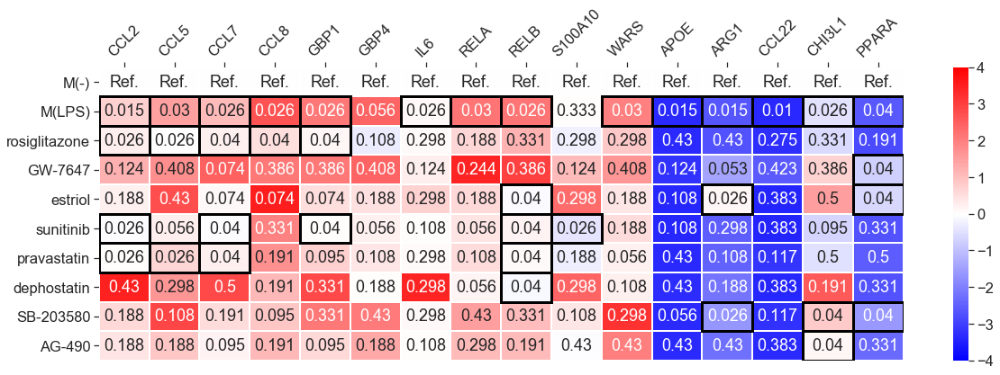

In [51]:
fig = plt.figure()
fig.set_size_inches(20, 6)
sns.set(font_scale=1.5)
with sns.axes_style('ticks'):
    ax = sns.heatmap(fig7c_zscores_df - fig7c_zscores_df.iloc[0], cmap='bwr', linewidths=1, linecolor='white', vmin=-4, vmax=4, fmt='',
                    annot=fig7c_pval_df.round(3).fillna('').replace('', 'Ref.'))    
    for (i, j) in [(i, j) for i, j in zip(np.where(fig7c_pval_df<0.05)[0], np.where(fig7c_pval_df<0.05)[1])]:
        ax.add_patch(Rectangle((j, i), 1, 1, fill=False, edgecolor='black', lw=3))
    ax.xaxis.tick_top() # x axis on top
    ax.xaxis.set_label_position('top')
    #ax.vlines(np.arange(1, 8)*topN, *ax.get_ylim(), lw=2)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
plt.savefig(proj_path + 'PoC2_VG/' + 'invitro_heatmap.pdf', format='pdf', bbox_inches='tight')
plt.show()